In [244]:
import pandas as pd
import numpy as np
from scipy import stats
import statsmodels.api as sm
import os
import matplotlib.pyplot as plt
from sklearn import linear_model
from sklearn.preprocessing import StandardScaler
import statsmodels.formula.api as smf
import warnings
from sklearn.model_selection import cross_val_score
from datetime import datetime
from sklearn.cluster import MiniBatchKMeans, AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram
from sklearn.preprocessing import StandardScaler, OneHotEncoder, PolynomialFeatures
from sklearn import metrics
from datetime import datetime
from itertools import product
import warnings

### Откроем и преобразуем данные

In [245]:
all_data = []
for dic, folders, files in os.walk('/Users/shrlq/Documents/python_yandex/course 6/week_3/agg_data_'):
    for file in files:
        print (file)
        data_month = pd.read_csv(str('/Users/shrlq/Documents/python_yandex/course 6/week_3/agg_data_/' + file), ';', index_col=['tpep_pickup_hour'], 
                                 parse_dates=['tpep_pickup_hour'])
        all_data.append(data_month)
all_data = pd.concat(all_data)
all_data.sort_values(by = 'tpep_pickup_hour', inplace=True)
all_data = all_data.drop(['Unnamed: 0'], axis=1)
all_data.head()

df_03.csv
df_02.csv
df_06.csv
df_05.csv
df_04.csv


,Reg_ID,count
tpep_pickup_hour,,
2016-02-01,1841,0
2016-02-01,269,0
2016-02-01,988,0
2016-02-01,961,0
2016-02-01,668,0


### Задание 1
Составьте из данных о поездках прямоугольную таблицу так, чтобы по строкам было время, а по столбцам идентификатор ячейки (возьмите только те, которые были отобраны на второй неделе).

In [246]:
# получим временные ряды по каждому региону
data_ = all_data.pivot_table(columns=['Reg_ID'], aggfunc=sum, values=['count'], index=all_data.index)
data_.columns = data_.columns.droplevel()

# исключим ряды, среднее которых за май меньше 5.
only_may = data_.iloc[2160:-720, :]
data_ = data_.iloc[:, np.where(only_may.mean(axis=0) >= 5)[0]]
data_.head()

Reg_ID,1075,1076,1077,1125,1126,1127,1128,1129,1130,1131,...,1630,1684,1733,1734,1783,2068,2069,2118,2119,2168
tpep_pickup_hour,,,,,,,,,,,,,,,,,,,,,
2016-02-01 00:00:00,19,26,5,15,76,92,152,217,267,56,...,15,0,5,275,60,80,15,184,15,92
2016-02-01 01:00:00,6,17,5,5,29,53,104,116,182,40,...,9,0,3,5,49,8,1,27,7,129
2016-02-01 02:00:00,5,5,1,6,21,31,52,118,137,22,...,5,0,0,1,0,13,0,11,2,0
2016-02-01 03:00:00,4,0,0,3,9,36,32,76,106,10,...,11,0,0,0,0,6,0,2,1,0
2016-02-01 04:00:00,4,4,2,10,15,46,35,72,84,11,...,9,0,0,0,0,0,0,31,0,2


### Запишем функции для последующих преобразований

In [247]:
# функция для добавления синусоидных и косинусоидных признаков
def sincos_feat_gen(data):
    T_ = np.arange(0, data.shape[0])+1
    week_seas = []
    df = pd.DataFrame()
    for n in np.arange(1, 7):
        week_sin = np.sin(T_*2*np.pi*n/168)
        week_seas.append(week_sin)
        week_cos = np.cos(T_*2*np.pi*n/168)
        week_seas.append(week_cos)
        
    df_= pd.DataFrame(data = week_seas).T
    sincos_col_names = ['sincos_' + str(x) for x in np.arange(0, len(np.arange(1, 7))*2)]
    df_.columns = sincos_col_names
    return (df_)


In [248]:
# функция для добавления дискретного признака дня недели 
def wd_feat_gen(data, name='weekday'):   
    data_ = pd.DataFrame()
    data_[name] = [str(d.weekday()) for d in data.index]
    return(data_)

In [249]:
# функция для кодирования категорийных признаков в бинарные
def cat_feat_gen(data, columns):
    # добавим признак категориальные признаки дней недели:
    temp_data = data.loc[:, columns] 

    # с помощью OneHotEncoder закодируем признаки по дням неделям:
    encoder = OneHotEncoder(drop='first', categories='auto')
    data_oh = encoder.fit_transform(temp_data).toarray()
    data_oh = pd.DataFrame(data_oh)
    
    data_oh.index = data.index
    cat_names = ['cat_' + str(x) for x in np.arange(0, len(data_oh.columns))]
    data_oh.columns = cat_names
    return(data_oh)


In [250]:
# функция для создания полиномиальных признаков
def polynomy_feat_gen(data, n=2):
    PolyNomy = PolynomialFeatures(degree = n)
    data_pn = PolyNomy.fit_transform(data)
    data_pn = pd.DataFrame(data_pn)
    return(data_pn)

In [251]:
# функция нахождения признака T+i в периоде с лагом i
def count_i_lag(count, i):
    count_ = []
    for n in np.arange(count.shape[0]):
        if n+i >=0 and n+i < count.shape[0]:
            count_.append(count[n+i])
        else:
            count_.append(np.nan)
    return(count_)

In [252]:
# функция для стандартизации выбранных признаков
def standardize_only_num_feat (data_train, data_predict):
    SC = StandardScaler()
    model = SC.fit(data_train)
    data_pr = SC.transform(data_predict)
    data_pr = pd.DataFrame(data_pr)
    return (data_pr)

In [253]:
def time_s_decompose(data):
    with plt.rc_context():
        plt.rc("figure", figsize=(15,5))
        return (sm.tsa.seasonal_decompose(data).plot())

In [254]:
# функции регресии с помощью машинного обучения с добавлением регуляризатора L1, чтобы исключить линейно-зависимые признаки. 
def auxilary_reg_residuals(X, y, alpha=0.5):
    SR = linear_model.SGDRegressor(penalty='l1', max_iter=1000, tol=1e-3, random_state=123, alpha=alpha)
    model = SR.fit(X = X, y = y)

    scor = round(cross_val_score(SR, cv=5, X = X, y = y, 
                    scoring='r2', ).mean(), 3)

    print ('Среднее значение R2: ' + str(scor))
    print (X.columns[np.argwhere(model.coef_ > 0)])
    data_feat = X.columns[np.argwhere(model.coef_ > 0)]

    # посчитаем остатки регрессии, чтобы по ним потом обучить модель ARIMA
    predictions = SR.predict(X)
    data_ = pd.DataFrame(predictions, columns=['predictions'])
    data_['resid'] = data_['predictions'].values - y.values
    data_['resid']
    
    data_.index = X.index
    return([data_, data_feat])

In [255]:
# функция дифференцирования остатов регресии
def dif_seas_plot(data, col_current='resid', col_dif = 'resid_dif', period=None, period_prev=0):
    %pylab inline
    print("Критерий Дики-Фуллера: p=%f" % sm.tsa.stattools.adfuller(data[col_current][period_prev:])[1])

    data[col_dif] = data[col_current] - data[col_current].shift(period)
    plt.figure(figsize(15,5))
    sm.tsa.seasonal_decompose(data[col_dif][period+period_prev:]).plot()
    print("Критерий Дики-Фуллера: p=%f" % sm.tsa.stattools.adfuller(data[col_dif][period+period_prev:])[1])
    return (data)

In [293]:
# функция, которая строит все возможные комбинации гиперпараметров
def param_comb(p, q, P, Q):
    param = list(product(list(range(p+1)), list(range(q+1)), list(range(P+1)), list(range(Q+1))))
    print ('Количетво комбинаций параметров: ' + str(len(param)))
    return(param)

In [257]:
# функция, которая перебирает все комбинации гиперпараметров, считает AIC и выбирает лучшую комбинацию гиперпараметров
def SARIMAX_calc(data, parameters, s, period_days=None):
    results = []
    best_results =[]
    best_aic = float("inf")
    warnings.filterwarnings('ignore')
    
    if period_days is None:
        period_days = data.shape[0]
        
    parameters = np.array(parameters)[np.argsort([sum(a) for a in parameters])]

    for param in parameters:
        #try except нужен, потому что на некоторых наборах параметров модель не обучается
        try:
            model=sm.tsa.statespace.SARIMAX(data.iloc[data.shape[0] - period_days:, 0], 
                                            exog = data.iloc[data.shape[0] - period_days:, 1:],
                                    order=(param[0], d, param[1]), 
                                    seasonal_order=(param[2], D, param[3], s)).fit(disp=-1)
        #выводим параметры, на которых модель не обучается и переходим к следующему набору
        except ValueError:
            print('wrong parameters:', param) 
            continue
        #выводим параметры в случае возникновения коллинеарности 
        except LinAlgError:
            print('Singular matrix:', param)
            continue
        
        aic = model.aic
        #сохраняем лучшую модель, aic, параметры 
        if aic < best_aic:
            best_model = model 
            best_aic = aic 
            best_param = param 
            best_results.append([param, model.aic])
            print ([param, model.aic])
        results.append([param, model.aic]) 
    return(results)


In [258]:
def datetime_separate(data, column, new_names):
    data[new_names[0]] = list(map(lambda x: datetime.strftime(x, '%Y-%m-%d'), data[column]))
    data[new_names[1]] = list(map(lambda x: x.hour, data[column])) 
    data.drop([column], axis=1, inplace=True)
    return(data)

### Подготовим таблицы с признаками и целевыми значениями, разобьем выборки по периодам

In [259]:
# Сгенериреум вспомогательные принаки, общие для любых географических зон
wd_data = wd_feat_gen(data_)  # добавляем признак дня недели
sincos_df = sincos_feat_gen(data_) # добавляем синусные и косинусные прищнаки
cat_df = cat_feat_gen(wd_data, ['weekday']) # преобразуем категорийные признаки в бинарные

pn_data = pd.concat([wd_data, sincos_df, cat_df], axis=1) # объединяем все признаки
pn_df = polynomy_feat_gen(pn_data, n=2) # добавляем полиномиальные признаки

pn_df.describe()

,0,1,2,3,4,5,6,7,8,9,...,200,201,202,203,204,205,206,207,208,209
count,3624.0,3624.000000,3624.000000,3.624000e+03,3.624000e+03,3.624000e+03,3.624000e+03,3.624000e+03,3.624000e+03,3624.000000,...,3624.000000,3624.0,3624.0,3624.0,3624.000000,3624.0,3624.0,3624.000000,3624.0,3624.000000
mean,1.0,2.960265,0.013964,-3.463115e-03,1.496175e-03,2.830902e-03,2.868940e-03,-2.563841e-03,2.385256e-03,0.001626,...,0.145695,0.0,0.0,0.0,0.139073,0.0,0.0,0.139073,0.0,0.139073
std,0.0,1.996566,0.706065,7.081962e-01,7.066275e-01,7.077735e-01,7.071034e-01,7.072948e-01,7.074335e-01,0.706969,...,0.352849,0.0,0.0,0.0,0.346070,0.0,0.0,0.346070,0.0,0.346070
min,1.0,0.000000,-1.000000,-1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00,-9.972038e-01,-1.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000
25%,1.0,1.000000,-0.680173,-7.071068e-01,-6.801727e-01,-6.801727e-01,-7.071068e-01,-7.071068e-01,-6.801727e-01,-0.733052,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000
50%,1.0,3.000000,0.037391,-1.960054e-15,1.042188e-15,1.284641e-15,1.530190e-15,-3.062236e-15,9.166282e-16,0.074730,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000
75%,1.0,5.000000,0.707107,7.071068e-01,6.801727e-01,7.330519e-01,7.071068e-01,7.071068e-01,6.801727e-01,0.733052,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000
max,1.0,6.000000,1.000000,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,9.972038e-01,1.000000,...,1.000000,0.0,0.0,0.0,1.000000,0.0,0.0,1.000000,0.0,1.000000


In [260]:
# Для каждого ряда и часа конца истории запишем в таблицу целевые значения T+i, где i от 1 до 6
reg_ids = data_.columns
step = 6

targ_data_list=[]
for reg in reg_ids:
    reg_df = pd.DataFrame()
    reg_df['tpep_pickup_hour'] = data_.index
    reg_df['Reg_ID'] = reg
    #-- reg_df['count'] = list(data_.loc[:, reg])
    
    targets=[]
    for i in list(range(step)):
        target_ = count_i_lag(data_.loc[:, reg], i=i)
        targets.append(target_)
    targ_df = pd.DataFrame(targets, index=['targ_' + str(x) for x in list(range(6))]).T
     
    targ_data_ = pd.concat([targ_df, reg_df], axis=1) #объеденим полученные данные для ряда
    targ_data_list.append(targ_data_) #объеденим полученные данные по всем рядам

targ_data = pd.concat(targ_data_list)
targ_data.head()

,targ_0,targ_1,targ_2,targ_3,targ_4,targ_5,tpep_pickup_hour,Reg_ID
0,19.0,6.0,5.0,4.0,4.0,12.0,2016-02-01 00:00:00,1075
1,6.0,5.0,4.0,4.0,12.0,28.0,2016-02-01 01:00:00,1075
2,5.0,4.0,4.0,12.0,28.0,32.0,2016-02-01 02:00:00,1075
3,4.0,4.0,12.0,28.0,32.0,91.0,2016-02-01 03:00:00,1075
4,4.0,12.0,28.0,32.0,91.0,54.0,2016-02-01 04:00:00,1075


In [713]:
# сохраним результат в файл
targ_data.to_csv('/Users/shrlq/Documents/python_yandex/course 6/week_4/targ_data_w4.csv', ';', index=False)

In [261]:
# разобьем целевые значения на обучающую, тестовую и итоговую выборки - для дальнейшего расчета ошибки
may_start = datetime.strptime('2016-04-30 23:00:00', '%Y-%m-%d %H:%M:%S')
may_end = datetime.strptime('2016-05-31 17:00:00', '%Y-%m-%d %H:%M:%S')

june_start = datetime.strptime('2016-05-31 23:00:00', '%Y-%m-%d %H:%M:%S')
june_end = datetime.strptime('2016-06-30 17:00:00', '%Y-%m-%d %H:%M:%S')

train_cond = np.where(targ_data['tpep_pickup_hour'] <= may_start)[0]
y_train = targ_data.iloc[train_cond, :] 
print ('Кол-во строк в обуч. выборке: ' + str(y_train.shape[0]))

test_cond = np.where((targ_data['tpep_pickup_hour'] >= may_start) & (targ_data['tpep_pickup_hour'] <= may_end))[0]
y_test = targ_data.iloc[test_cond, :]  
print ('Кол-во строк в тест. выборке: ' + str(y_test.shape[0]))

val_cond = np.where((targ_data['tpep_pickup_hour'] >= june_start) & (targ_data['tpep_pickup_hour'] <= june_end))[0]
y_val = targ_data.iloc[val_cond, :] 
print ('Кол-во строк в фин. выборке: ' + str(y_val.shape[0]))

Кол-во строк в обуч. выборке: 220320
Кол-во строк в тест. выборке: 75378
Кол-во строк в фин. выборке: 72930


### Сделаем кластеризацию временных рядов географических зон

### Задание 2
Перед проведением кластеризации стандартизуйте столбцы (вычтите выборочное среднее и поделите на выборочную дисперсию). 

In [262]:
# сделаем обучающую выборку для кластеризации
reg_cond_train = np.where(data_.index <= may_start)[0]
reg_data_train = data_.iloc[reg_cond_train, :]
reg_feat_train = pn_df.iloc[reg_cond_train, :] 

In [263]:
# сделаем стандартизацию самих рядов (необходимо для последующей кластеризации) и соответствующих признаков
reg_data_train_sc = standardize_only_num_feat(reg_data_train, reg_data_train)
reg_feat_train_sc = standardize_only_num_feat(reg_feat_train, reg_feat_train)
reg_feat_train_sc.index = reg_data_train.index

# сделаем стандартизацию признаков за более длительный период на основе модели, построенной на обуч. выборке
pn_df_sc = standardize_only_num_feat(reg_feat_train, pn_df)
pn_df_sc.index = data_.index

In [264]:
# объеденим целевые значения географических зон и общие признаки за весь период
reg_comv_df = pd.concat([data_, pn_df_sc], axis=1)
reg_comv_df.describe()

,1075,1076,1077,1125,1126,1127,1128,1129,1130,1131,...,200,201,202,203,204,205,206,207,208,209
count,3624.000000,3624.000000,3624.000000,3624.000000,3624.000000,3624.000000,3624.000000,3624.000000,3624.000000,3624.000000,...,3624.000000,3624.0,3624.0,3624.0,3624.000000,3624.0,3624.0,3624.000000,3624.0,3624.000000
mean,65.663355,136.572572,86.867550,68.007450,186.457781,272.520419,300.571744,344.333609,411.111479,139.228753,...,0.003558,0.0,0.0,0.0,-0.015280,0.0,0.0,-0.015280,0.0,0.016884
std,40.929233,81.567132,58.227737,39.479084,97.408838,136.661118,169.044870,195.849721,240.270885,76.017506,...,1.003725,0.0,0.0,0.0,0.984441,0.0,0.0,0.984441,0.0,1.018049
min,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,3.000000,1.000000,0.000000,...,-0.410891,0.0,0.0,0.0,-0.410891,0.0,0.0,-0.410891,0.0,-0.392232
25%,26.000000,54.750000,26.000000,34.000000,107.750000,170.750000,183.000000,217.000000,254.000000,86.000000,...,-0.410891,0.0,0.0,0.0,-0.410891,0.0,0.0,-0.410891,0.0,-0.392232
50%,70.000000,160.000000,95.000000,71.000000,199.000000,288.000000,293.500000,309.000000,359.000000,144.000000,...,-0.410891,0.0,0.0,0.0,-0.410891,0.0,0.0,-0.410891,0.0,-0.392232
75%,97.000000,202.000000,127.000000,94.000000,254.000000,361.000000,397.250000,446.000000,548.000000,188.000000,...,-0.410891,0.0,0.0,0.0,-0.410891,0.0,0.0,-0.410891,0.0,-0.392232
max,205.000000,369.000000,275.000000,247.000000,496.000000,681.000000,810.000000,1109.000000,1419.000000,476.000000,...,2.433737,0.0,0.0,0.0,2.433737,0.0,0.0,2.433737,0.0,2.549510


### Задание 3
Кластеризуйте географические зоны по значениям стандартизованных рядов. Подберите число кластеров так, чтобы оно было не слишком большим, но ряды внутри кластеров имели похожую форму.

2.0615528128088303
3    27
0    27
1    26
2    22
Name: cluster, dtype: int64


,Reg_ID,cl
0,1075,0
1,1076,3
2,1077,3
3,1125,0
4,1126,0


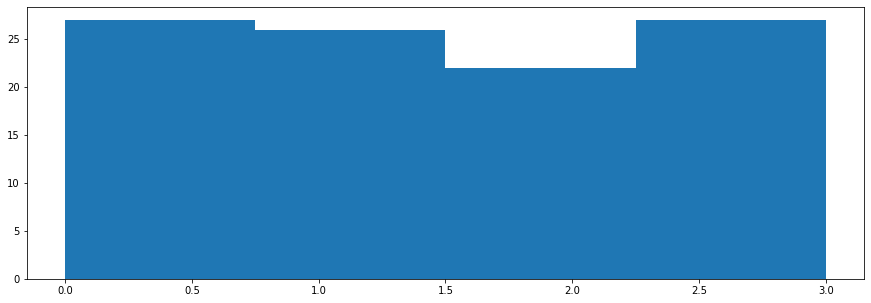

In [265]:
# сделаем кластеризацию на данных по апрель (обучающей выборке)
# подберем такое минимальное количество кластеров, чтобы std было не большим
k = 4
cl_data_T = reg_data_train_sc.T

BMKMeans = MiniBatchKMeans(n_clusters=k, batch_size=500, random_state=1001)
BMKMeans.fit(cl_data_T)
clusters_ = BMKMeans.labels_
#найдем центры кластеров
centers = BMKMeans.cluster_centers_
plt.hist(clusters_, bins=k)
# добавим в таблицу названия кластеров
cl_data_T['cluster'] = clusters_
print (np.std(cl_data_T['cluster'].value_counts()))
print (cl_data_T['cluster'].value_counts())

# сделаем сопоставление кластеров и регионов
# сопоставим полученные ряды с кластерами
mapping = pd.DataFrame([data_.columns, clusters_], index=['Reg_ID', 'cl']).T
mapping.head()

### Задание 4
В каждом кластере выберите наиболее типичный ряд (например, это может быть ряд, соответствующий центру кластера)

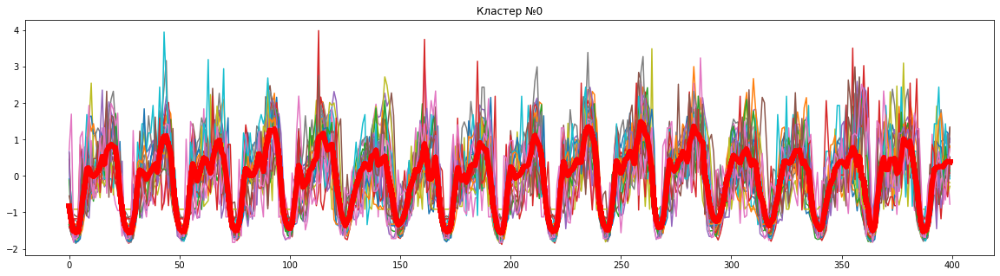

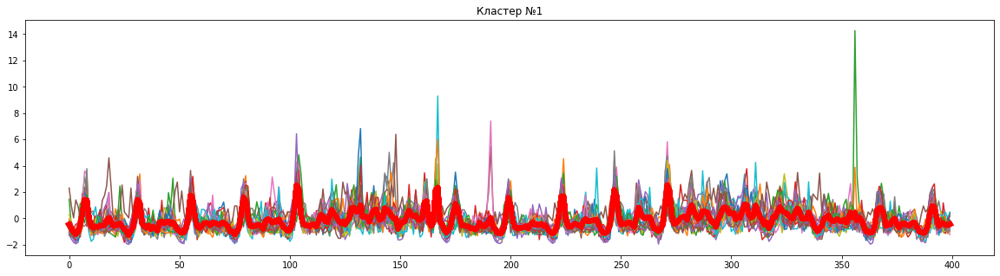

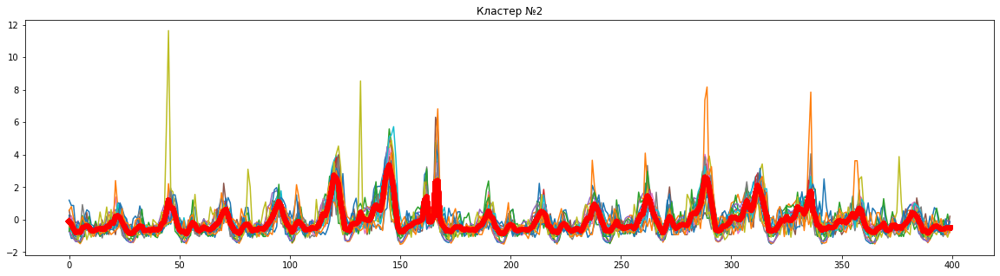

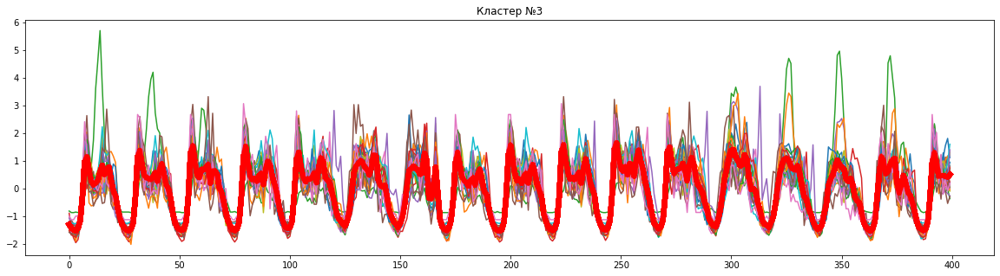

In [266]:
# визуализируем центры кластеров
x = np.arange(0, 400)
for i in np.unique(clusters_):
    plt.figure(figsize=(20, 5))
    for y in [a[1][:-1] for a in cl_data_T[cl_data_T['cluster'] == i].iterrows()]:
        plt.plot(x, y[:400]) 
        plt.plot(x, centers[i][:400], color='red', linewidth=6)
        plt.title('Кластер №' + str(i))
    plt.show()

In [267]:
# временные ряды центров кластеров объединим с признаками
cl_cent_data_train = pd.DataFrame(centers, columns=np.array(reg_data_train.index))
cl_df_comb_train = pd.concat([cl_cent_data_train.T, reg_feat_train_sc], axis=1)
cl_df_comb_train.head()

,0,1,2,3,0,1,2,3,4,5,...,200,201,202,203,204,205,206,207,208,209
2016-02-01 00:00:00,-0.832640,-0.476788,-0.115480,-1.299725,0.0,-1.493953,0.046399,1.431697,0.095356,1.418607,...,-0.410891,0.0,0.0,0.0,-0.410891,0.0,0.0,-0.410891,0.0,-0.392232
2016-02-01 01:00:00,-1.219843,-0.775130,-0.277184,-1.427938,0.0,-1.493953,0.099040,1.428722,0.200502,1.406771,...,-0.410891,0.0,0.0,0.0,-0.410891,0.0,0.0,-0.410891,0.0,-0.392232
2016-02-01 02:00:00,-1.508504,-1.029898,-0.539586,-1.492775,0.0,-1.493953,0.151533,1.423768,0.304469,1.387117,...,-0.410891,0.0,0.0,0.0,-0.410891,0.0,0.0,-0.410891,0.0,-0.392232
2016-02-01 03:00:00,-1.556172,-1.203369,-0.784256,-1.528458,0.0,-1.493953,0.203805,1.416842,0.406675,1.359756,...,-0.410891,0.0,0.0,0.0,-0.410891,0.0,0.0,-0.410891,0.0,-0.392232
2016-02-01 04:00:00,-1.537251,-0.982779,-0.754652,-1.433968,0.0,-1.493953,0.255783,1.407954,0.506549,1.324841,...,-0.410891,0.0,0.0,0.0,-0.410891,0.0,0.0,-0.410891,0.0,-0.392232


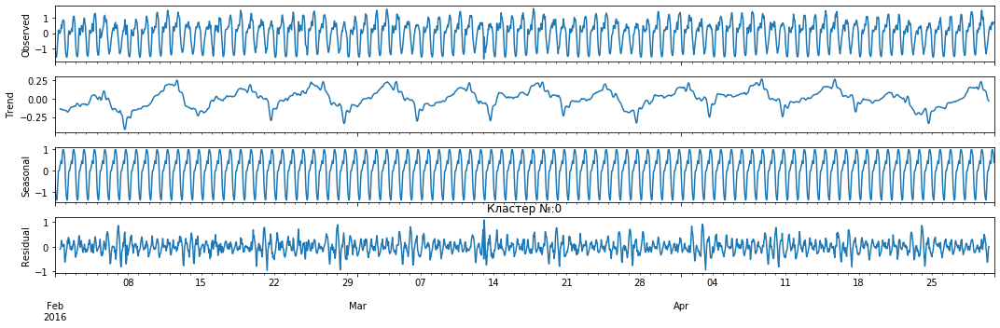

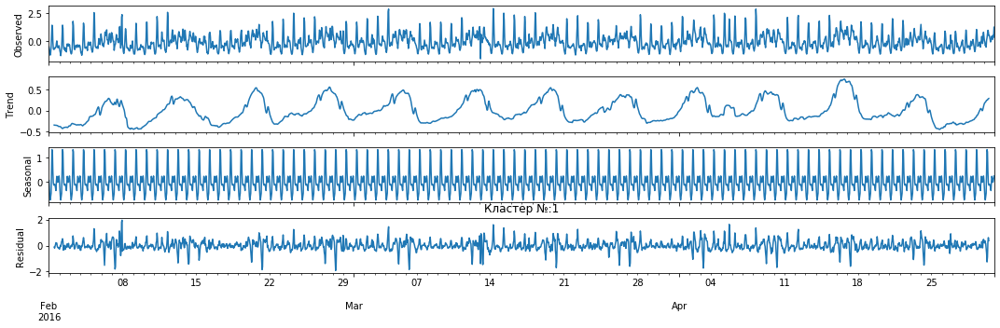

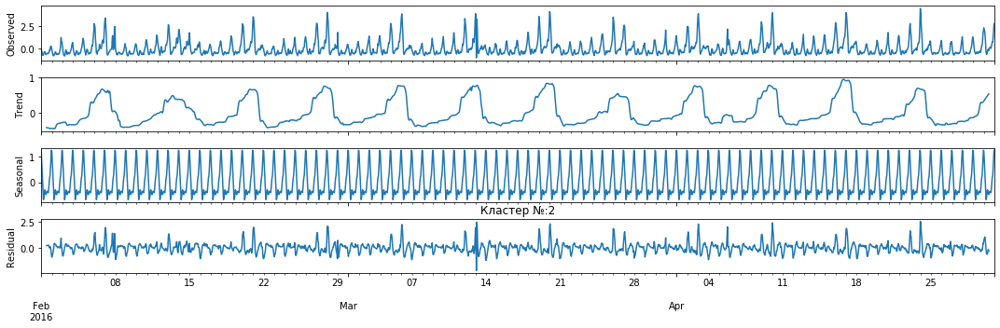

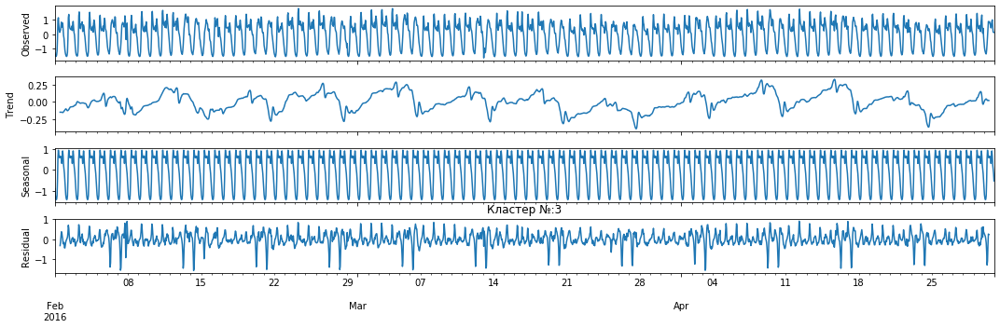

In [268]:
# построим декомпозицию
for index in cl_cent_data_train.index:
    time_s_decompose(cl_cent_data_train.loc[index, :])
    plt.title('Кластер №:' + str(index)) 

### Построим регрессии для каждого кластера
#### Одновременно с этим проведем отбор регрессионных признаков

In [279]:
# построим регрессию на основе данных по апрель и посчитаем остатки
# сохраним отобранные с помощью регуляризации признаки
data_resid=[]
selected_features=[]
for ind, val in enumerate(cl_cent_data_train.index):
    print ('Кластер №' + str(val))
    temp_df_comb = 
    .iloc[:, [ind] + list(range(k, len(cl_df_comb_train.columns)))]
    temp_df_comb.columns = ['count'] + ['x_' + str(n) for n, i in enumerate(temp_df_comb.columns[1:])]
    mod = auxilary_reg_residuals(X = temp_df_comb.iloc[:, 1:], 
                                 y = temp_df_comb.iloc[:, 0],
                                 alpha=.02)
    data_resid_ind = mod[0]
    data_resid.append(data_resid_ind) # таблица с остатками
    selected_feat = mod[1] # названия признаков
    selected_features.append(temp_df_comb.loc[:, ['count'] + list(selected_feat)]) # таблица с признаками
    

Кластер №0
Среднее значение R2: 0.806
Index(['x_32', 'x_86', 'x_100', 'x_114', 'x_116', 'x_126', 'x_140', 'x_149',
       'x_159', 'x_163', 'x_173', 'x_174'],
      dtype='object')
Кластер №1
Среднее значение R2: 0.238
Index(['x_1', 'x_20', 'x_32', 'x_49', 'x_66', 'x_80', 'x_81', 'x_86', 'x_100',
       'x_107', 'x_108', 'x_114', 'x_134', 'x_174', 'x_175'],
      dtype='object')
Кластер №2
Среднее значение R2: 0.73
Index(['x_18', 'x_20', 'x_37', 'x_67', 'x_86', 'x_96', 'x_100', 'x_121',
       'x_126', 'x_128', 'x_138', 'x_152', 'x_160', 'x_164', 'x_174', 'x_180',
       'x_188', 'x_207'],
      dtype='object')
Кластер №3
Среднее значение R2: 0.72
Index(['x_32', 'x_49', 'x_80', 'x_86', 'x_100', 'x_107', 'x_114', 'x_140',
       'x_149', 'x_159', 'x_163', 'x_169', 'x_174', 'x_175', 'x_187'],
      dtype='object')


### Найдем оптимальные гиперпараметры для ARIMA (зная остатки регрессии)

Populating the interactive namespace from numpy and matplotlib
Критерий Дики-Фуллера: p=0.000001
Критерий Дики-Фуллера: p=0.000000


<Figure size 1080x360 with 0 Axes>

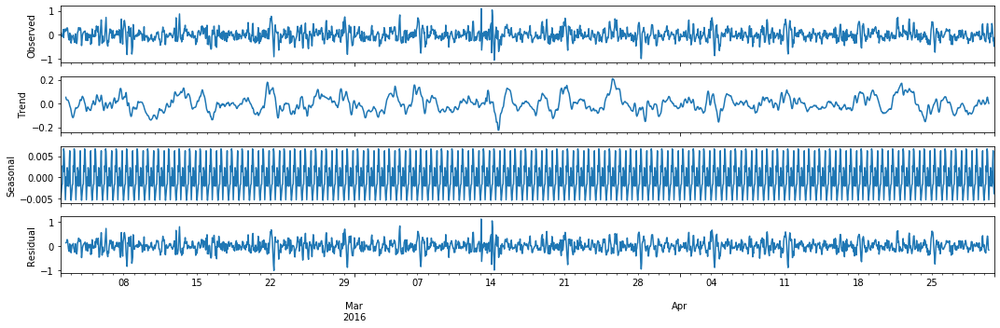

Populating the interactive namespace from numpy and matplotlib
Критерий Дики-Фуллера: p=0.000005
Критерий Дики-Фуллера: p=0.000000


<Figure size 1080x360 with 0 Axes>

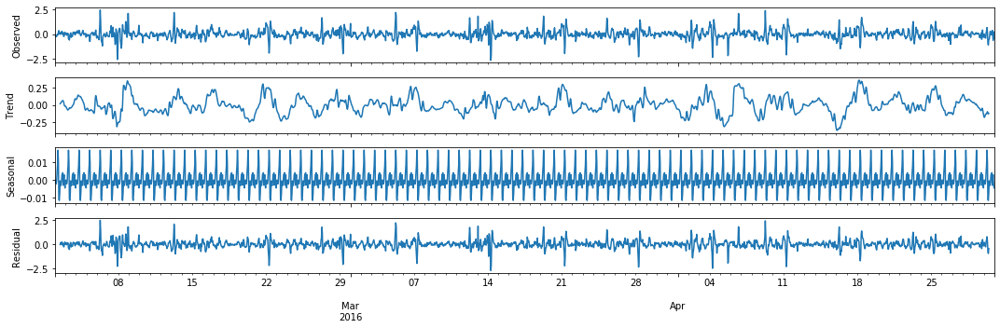

Populating the interactive namespace from numpy and matplotlib
Критерий Дики-Фуллера: p=0.000000
Критерий Дики-Фуллера: p=0.000000


<Figure size 1080x360 with 0 Axes>

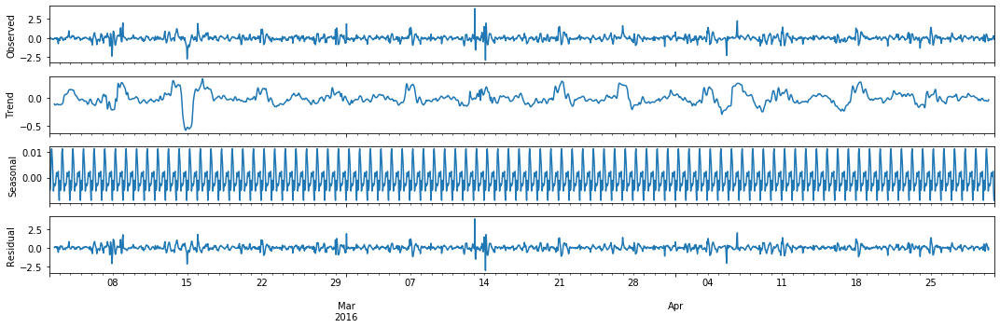

Populating the interactive namespace from numpy and matplotlib
Критерий Дики-Фуллера: p=0.000018
Критерий Дики-Фуллера: p=0.000000


<Figure size 1080x360 with 0 Axes>

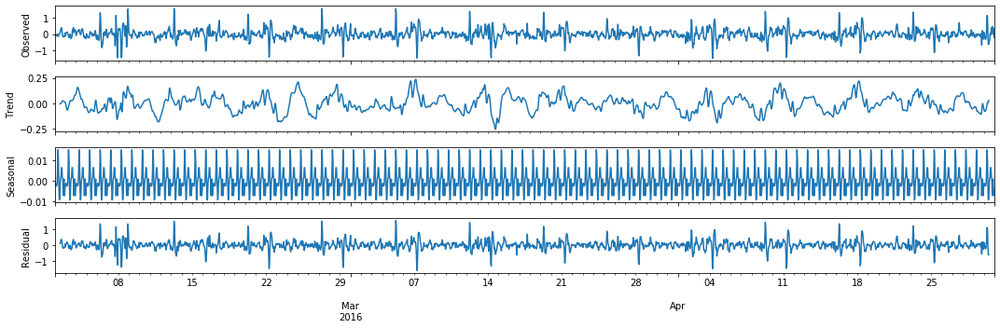

In [280]:
# сделаем сезонное дифференцирование с периодом 24 для каждого кластера
data_dif1=[]
for ind, val in enumerate(cl_cent_data_train.index):
    temp_data_r = dif_seas_plot(data_resid[ind], col_current='resid', col_dif='resid_dif', period=24)
    plt.show()
    data_dif1.append(temp_data_r)

Populating the interactive namespace from numpy and matplotlib
Критерий Дики-Фуллера: p=0.000000
Критерий Дики-Фуллера: p=0.000000


<Figure size 1080x360 with 0 Axes>

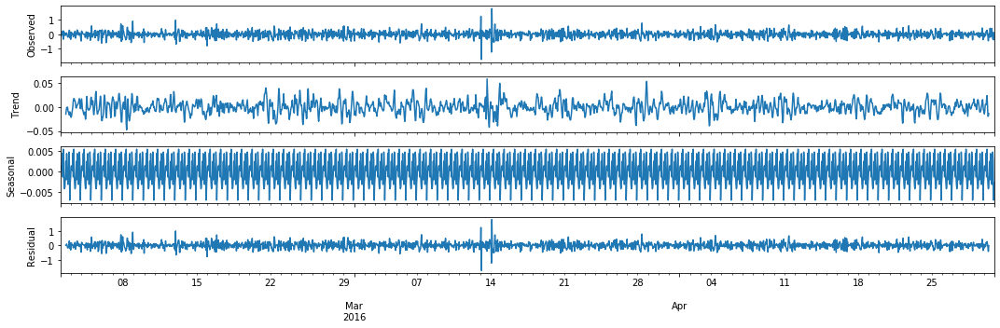

Populating the interactive namespace from numpy and matplotlib
Критерий Дики-Фуллера: p=0.000000
Критерий Дики-Фуллера: p=0.000000


<Figure size 1080x360 with 0 Axes>

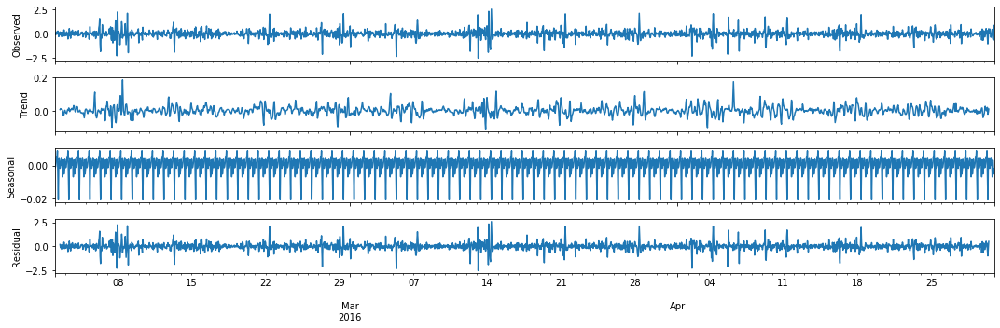

Populating the interactive namespace from numpy and matplotlib
Критерий Дики-Фуллера: p=0.000000
Критерий Дики-Фуллера: p=0.000000


<Figure size 1080x360 with 0 Axes>

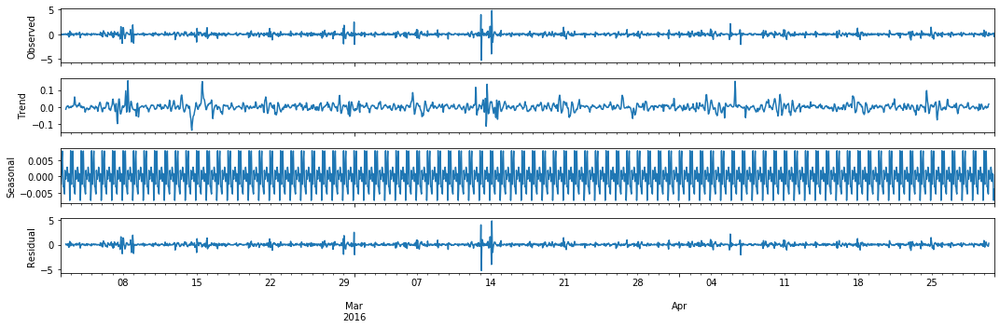

Populating the interactive namespace from numpy and matplotlib
Критерий Дики-Фуллера: p=0.000000
Критерий Дики-Фуллера: p=0.000000


<Figure size 1080x360 with 0 Axes>

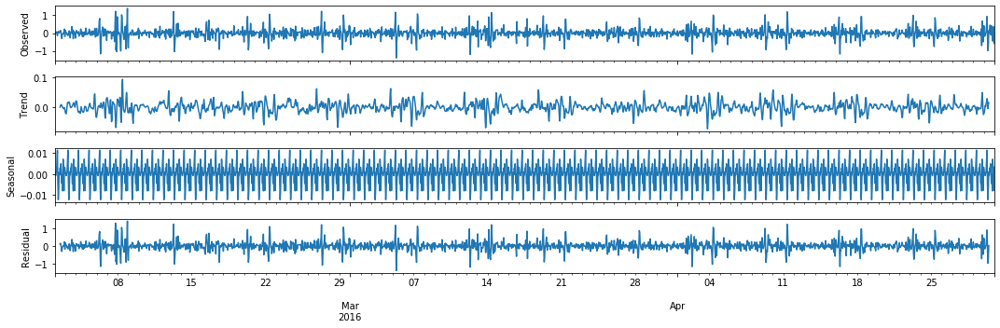

In [281]:
# сделаем еще раз обычное дифференцирование
indices = np.array(range(0, k))
data_dif2=[]
for ind in indices:
    temp_data_r = dif_seas_plot(data_dif1[ind], col_current='resid_dif', col_dif='resid_dif2', period=1, period_prev=24)
    plt.show()
    data_dif2.append(temp_data_r)

#### Выберем векторы начальных приближений

Кластер: №0


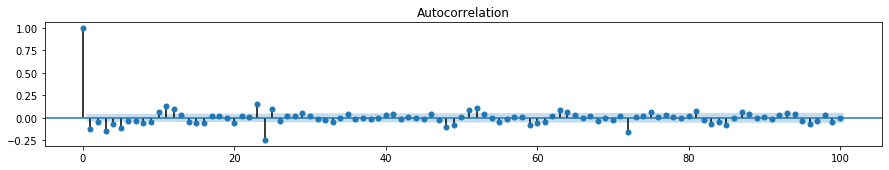

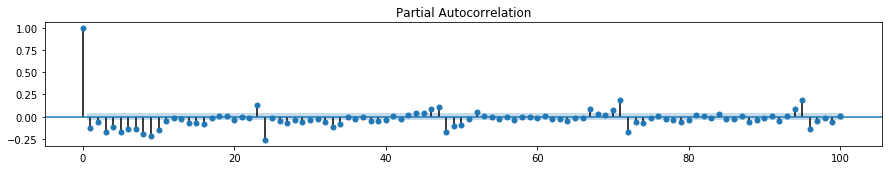

Кластер: №1


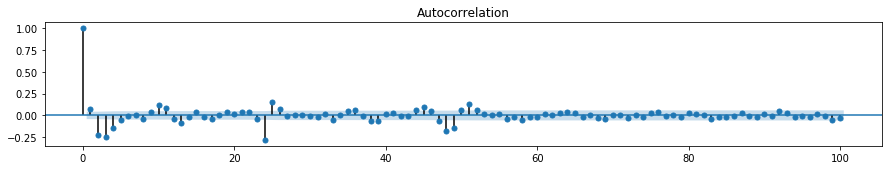

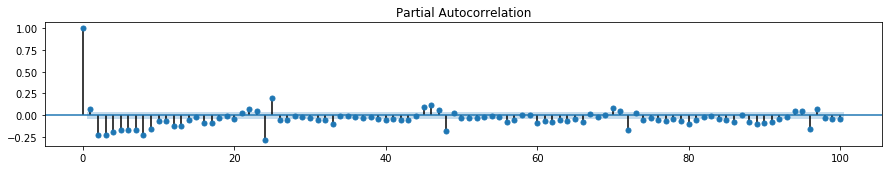

Кластер: №2


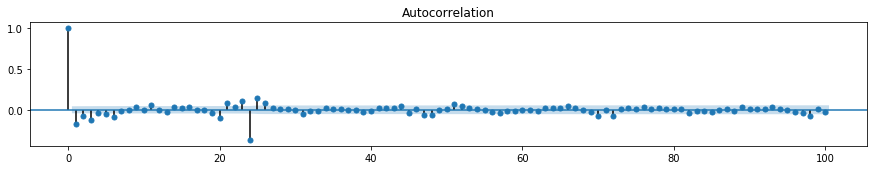

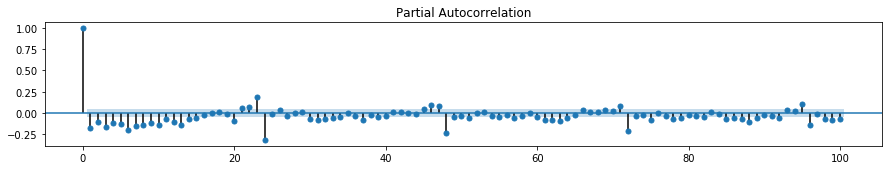

Кластер: №3


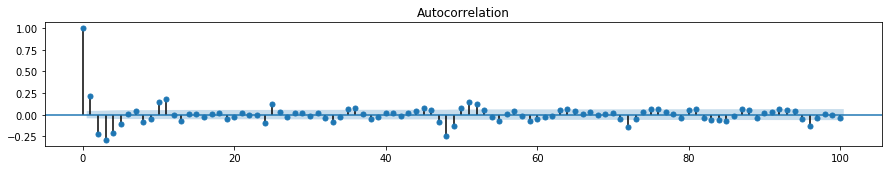

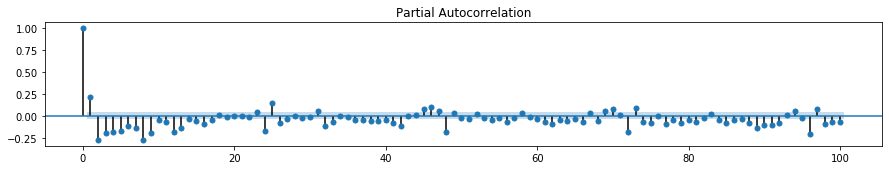

In [283]:
# построим автокоррелограмы для подбора начальных гиперпараметров
for ind, val in enumerate(cl_cent_data_train.index):
    print ('Кластер: №' +  str(val))
    ax = plt.subplot(212)
    sm.graphics.tsa.plot_acf(data_dif2[ind].resid_dif2[24+1:].values.squeeze(), lags=100, ax=ax)
    pylab.show()

    ax = plt.subplot(212)
    sm.graphics.tsa.plot_pacf(data_dif2[ind].resid_dif2[24+1:].values.squeeze(), lags=100, ax=ax)
    pylab.show()

### Задание 5
Для выбранных географических зон подберите на исходных рядах оптимальную структуру моделей — набор регрессионных признаков и значения гиперпараметров p,d,q,P,D,Q

In [367]:
#Выберем начальные приближения
Q = [3, 2, 1, 5] 
q = [1, 3, 3, 4] 
P = [5, 2, 1, 0] 
p = [3, 2, 1, 0] 

In [285]:
from itertools import product
parameters = []
for n in range(k):
    param = param_comb(p[n], q[n], P[n], Q[n])
    parameters.append(param)

Количетво комбинаций параметров: 192
Количетво комбинаций параметров: 108
Количетво комбинаций параметров: 32
Количетво комбинаций параметров: 30


#### Для каждого прогнозируемого кластера подготовим таблицу с признаками

In [286]:
# для каждого кластера сделаем таблицу с целевым значением центра этого кластера и 
# набором признаков, который был ранее отобран для соответствующего кластера
k=4
cl_data_for_SARIMAX = []
for ind, reg in enumerate(cl_cent_data_train.index):
    cl_df = cl_df_comb_train.iloc[:, [ind] + list(range(k, len(cl_df_comb_train.columns)))]
    cl_df.columns = ['count'] + ['x_' + str(n) for n, i in enumerate(cl_df.columns[1:])]
    
    cl_df = cl_df.loc[:, selected_features[ind].columns]
    cl_data_for_SARIMAX.append(cl_df)
    
print (cl_data_for_SARIMAX[0].shape)
print (cl_data_for_SARIMAX[1].shape)
print (cl_data_for_SARIMAX[2].shape)
print (cl_data_for_SARIMAX[3].shape)

(2160, 13)
(2160, 16)
(2160, 19)
(2160, 16)


#### Найдем оптимальные гиперпараметры модели, которые будем использовать для прогнозирования рядов

In [359]:
result_for_clusters=[]
min_result_for_clusters=[]
for n in list(range(k)):
    result = SARIMAX_calc(cl_data_for_SARIMAX[n], parameters=parameters[n], s=24)
    result_min = result[np.argmin([x[1] for x in result])]
    result_for_clusters.append([n, result])
    min_result_for_clusters.append([n] + result_min)
min_result_for_clusters

In [368]:
# запишем лучшие результаты в отдельную переменную значения гиперпараметров p,d,q,P,D,Q
best_results = [(0, 1, 5, 3), 
                (1, 2, 0, 1), 
                (1, 3, 1, 1), 
                (0, 4, 0, 5)] 

d = 1
D = 1

### Перейдем к прогнозированию рядов географических зон
#### Для каждого прогнозируемого ряда подготовим таблицу с признаками

In [362]:
# для каждого ряда сделаем таблицу с целевым значением этого ряда и 
# набором признаков, который был ранее отобран для соответствующего кластера
# за все даты до конца истории июне
R=102
data_for_SARIMAX = []
for ind, reg in enumerate(data_.columns):
    reg_df = reg_comv_df.iloc[:, [ind] + list(range(R, len(reg_comv_df.columns)))]
    reg_df.columns = ['count'] + ['x_' + str(n) for n, i in enumerate(reg_df.columns[1:])]
    
    clust_ind = int(mapping.loc[mapping['Reg_ID'] == reg, 'cl'])
    
    reg_df = reg_df.loc[:, selected_features[clust_ind].columns]
    data_for_SARIMAX.append(reg_df)

#### Для каждого ряда построим прогнозы на май и на июнь

17377.789390717302
Критерий Стьюдента: p=0.915206
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.03230892009371647


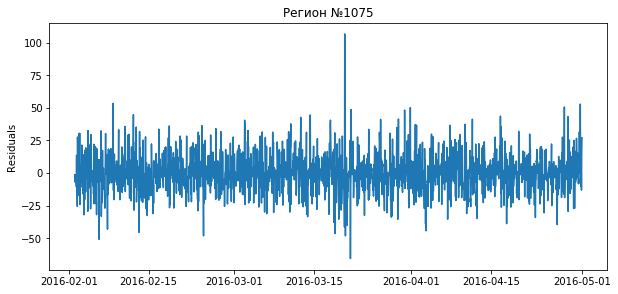

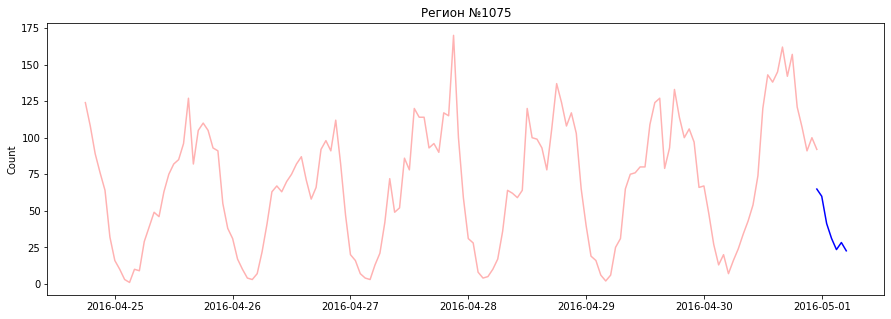

Success_reg: 1075
20149.152224045585
Критерий Стьюдента: p=0.944367
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: 0.04046061216547875


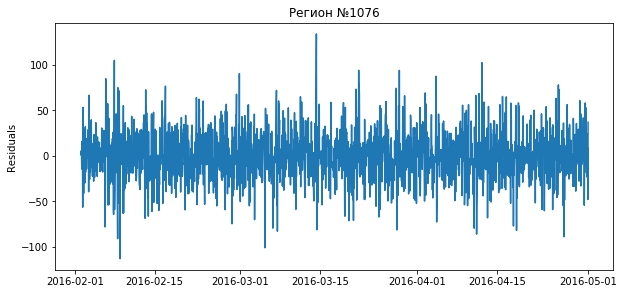

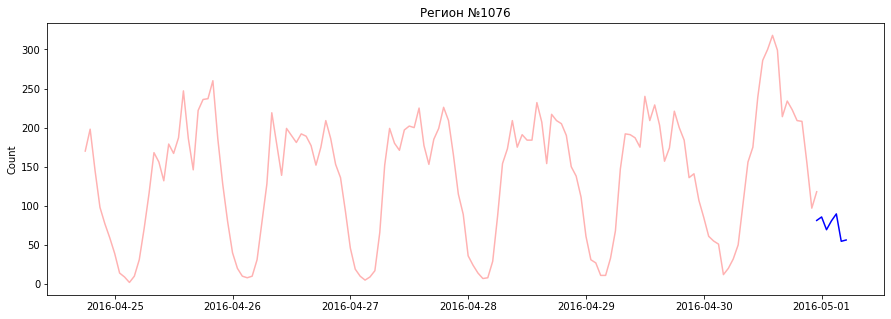

Success_reg: 1076
19486.07579618243
Критерий Стьюдента: p=0.782699
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: 0.13687967459492636


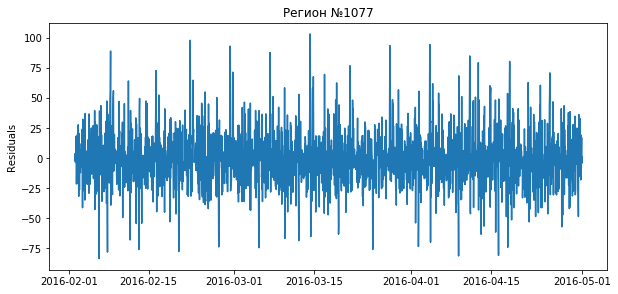

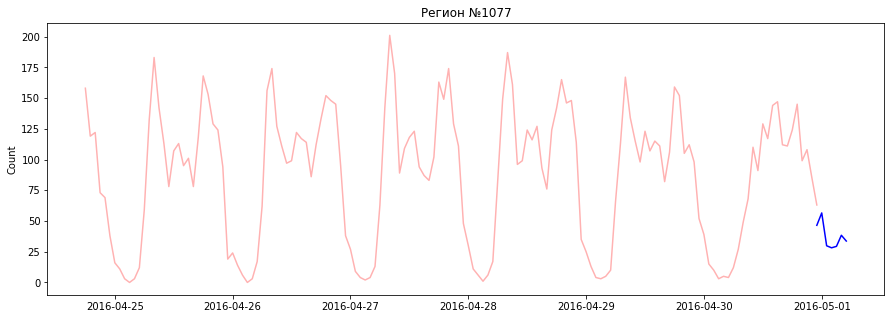

Success_reg: 1077
17874.798955977098
Критерий Стьюдента: p=0.808631
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.08250935338944958


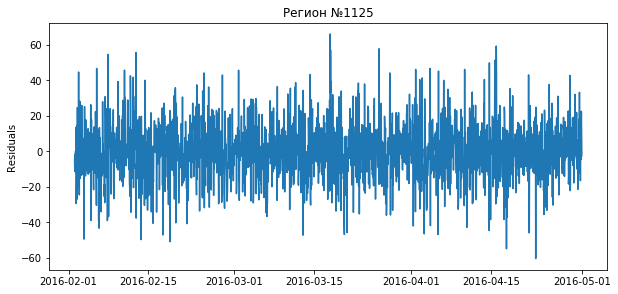

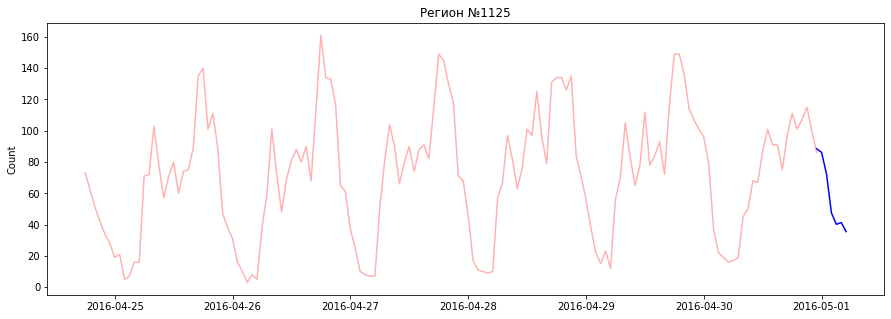

Success_reg: 1125
20457.3764712813
Критерий Стьюдента: p=0.386465
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.5404213350249102


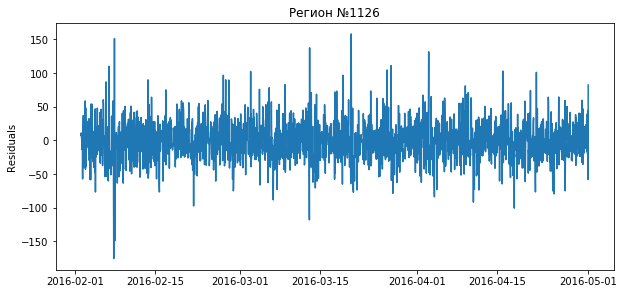

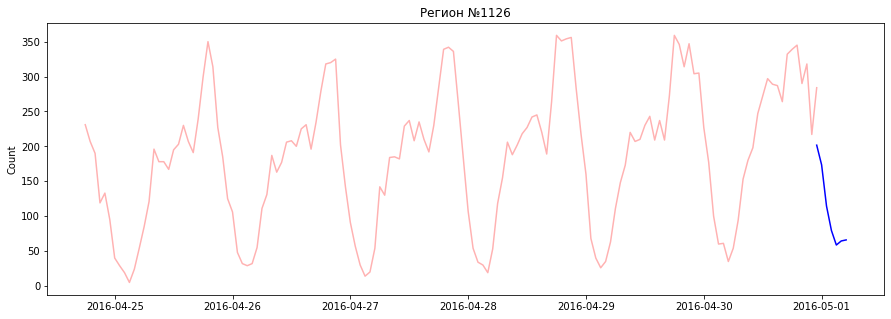

Success_reg: 1126
22143.871595079596
Критерий Стьюдента: p=0.297724
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.9632968881014289


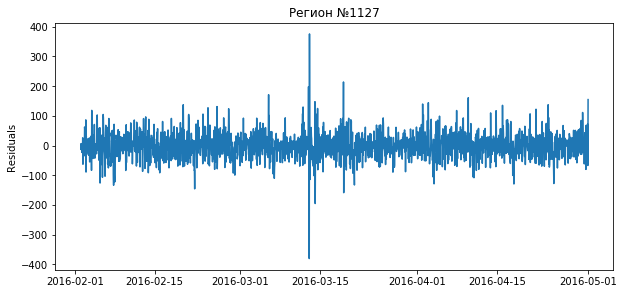

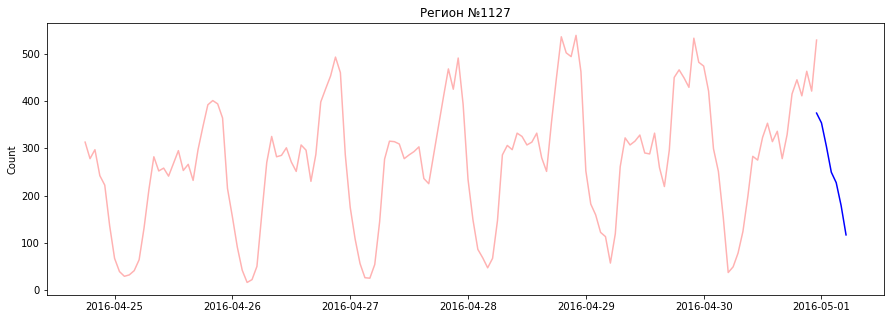

Success_reg: 1127
23170.067259333126
Критерий Стьюдента: p=0.962857
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.054791822717927825


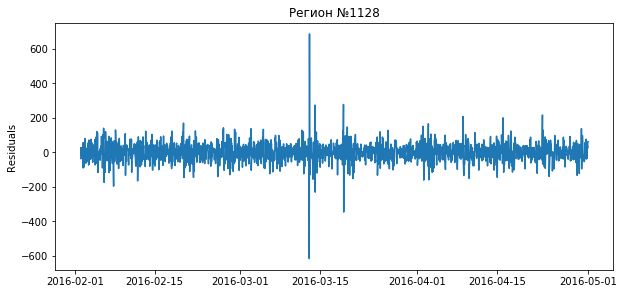

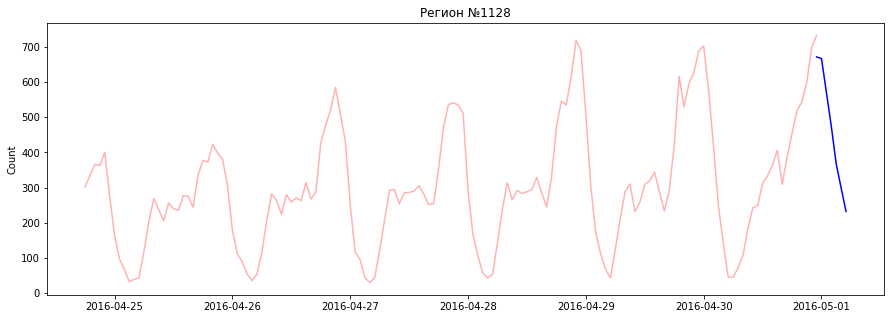

Success_reg: 1128
23910.617490386656
Критерий Стьюдента: p=0.453298
Критерий Дики-Фуллера: p=0.000021
Среднее по остаткам: -1.0461931992706412


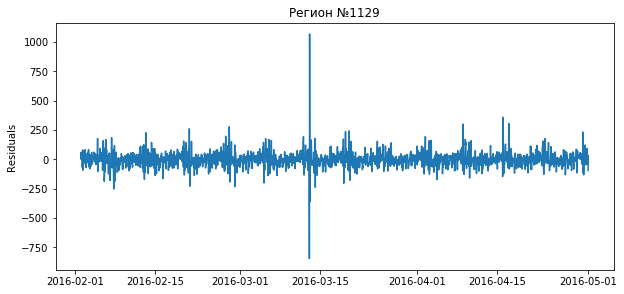

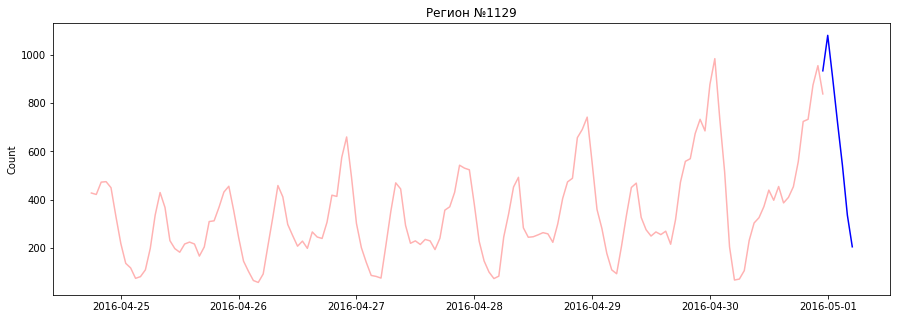

Success_reg: 1129
24648.185865104242
Критерий Стьюдента: p=0.840979
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: 0.332340429446051


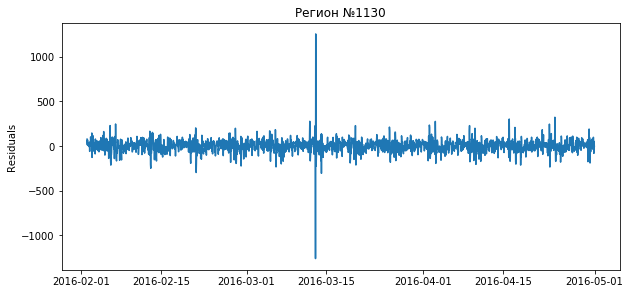

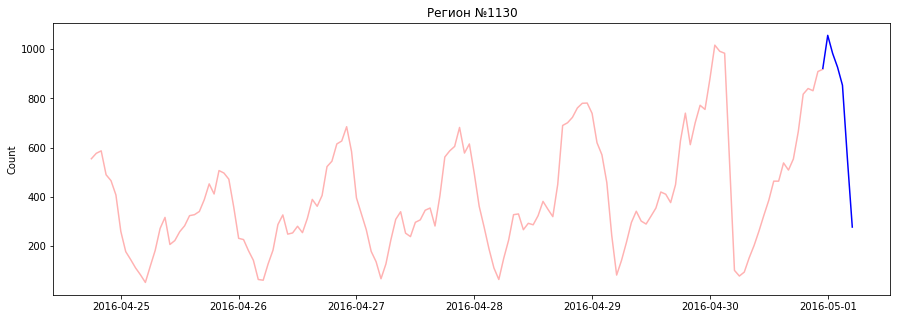

Success_reg: 1130
20862.589776970563
Критерий Стьюдента: p=0.705348
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.25905813723286714


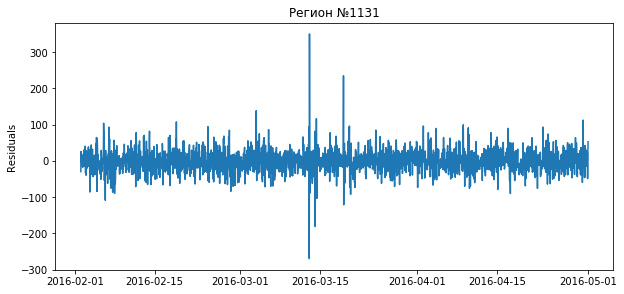

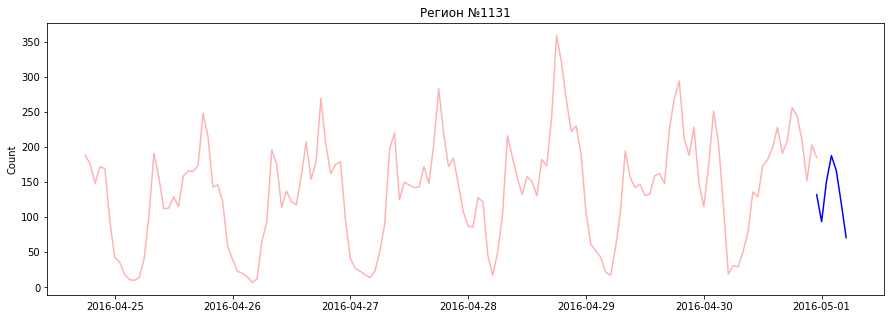

Success_reg: 1131
18696.597478158357
Критерий Стьюдента: p=0.612460
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: 0.20911814133160514


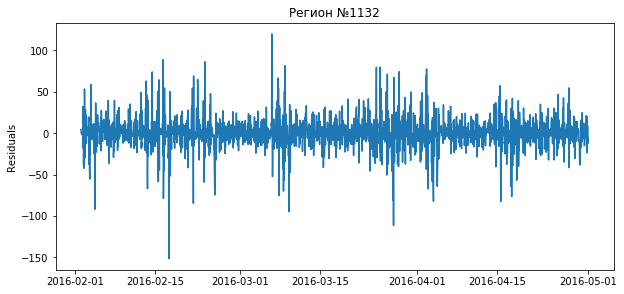

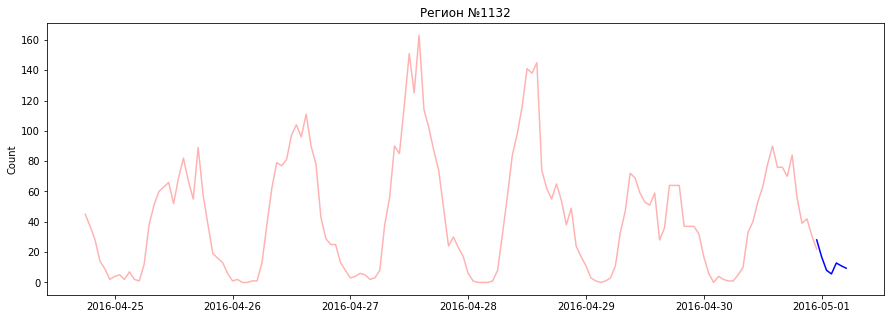

Success_reg: 1132
11273.781143151064
Критерий Стьюдента: p=0.934315
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: 0.00596562941690595


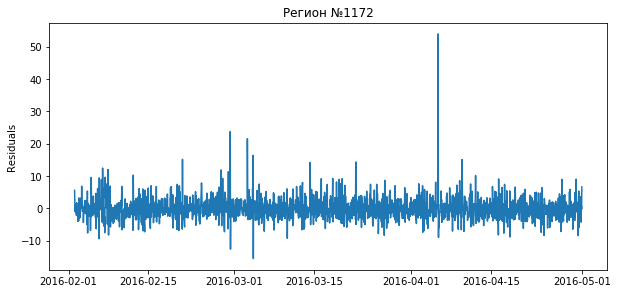

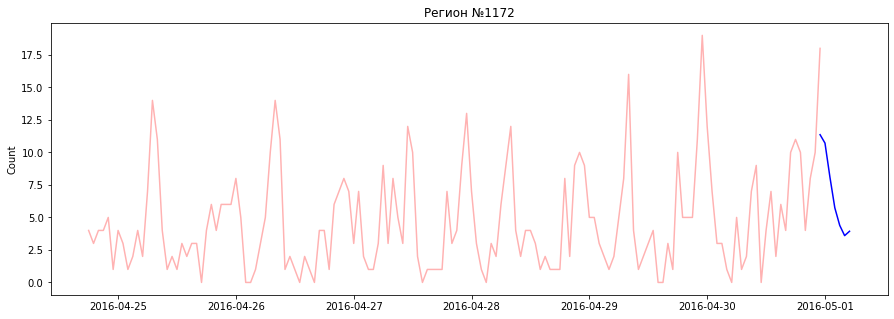

Success_reg: 1172
15209.097969891423
Критерий Стьюдента: p=0.673064
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.07702342423701256


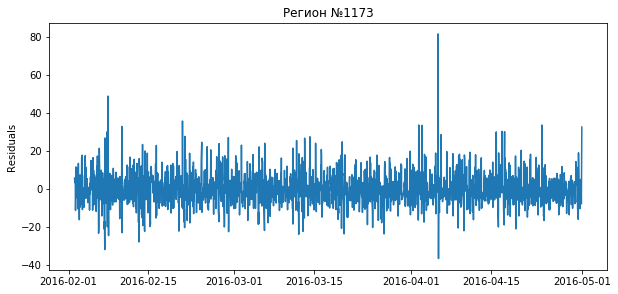

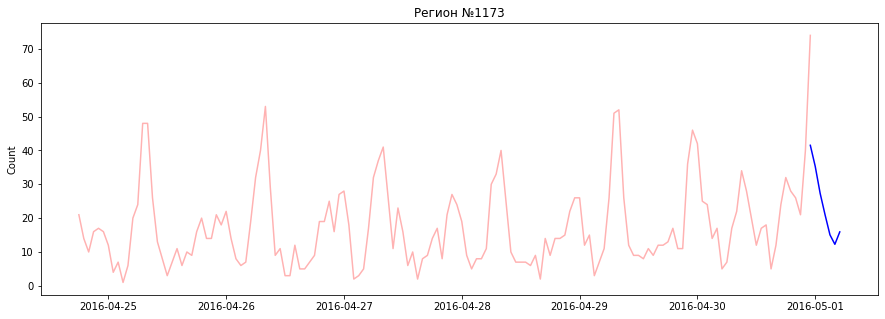

Success_reg: 1173
15412.064701782943
Критерий Стьюдента: p=0.468713
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.1384768519690712


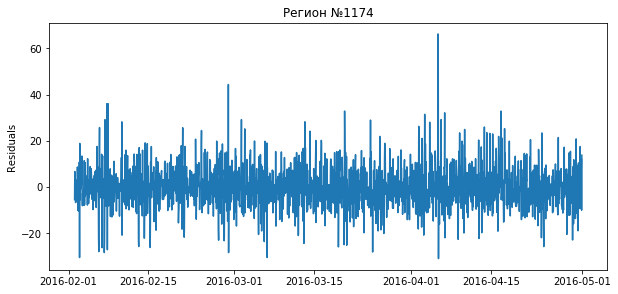

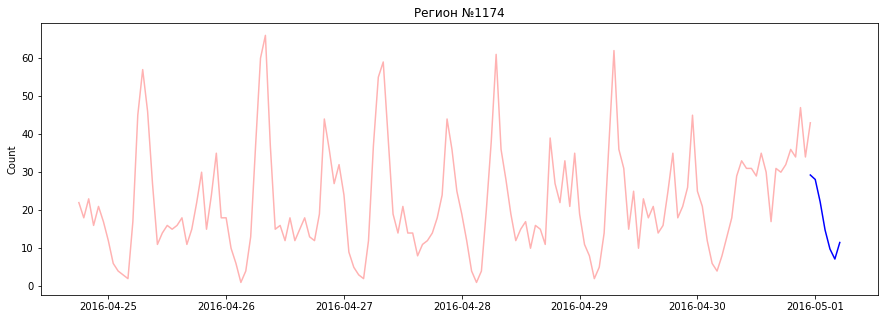

Success_reg: 1174
12939.683074604694
Критерий Стьюдента: p=0.632460
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.05128122734774804


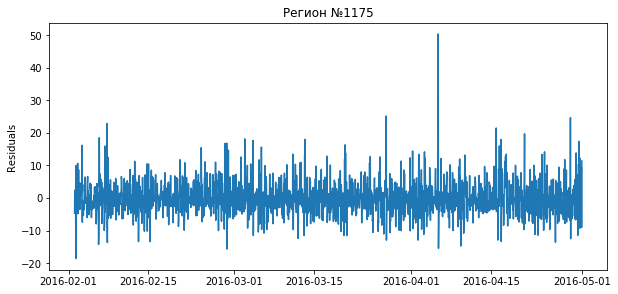

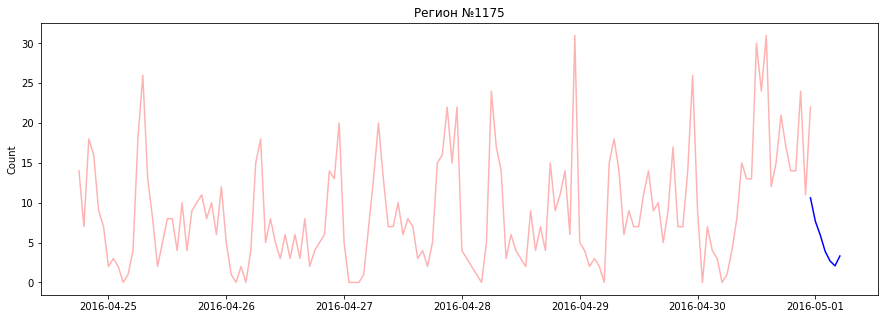

Success_reg: 1175
14388.174884166272
Критерий Стьюдента: p=0.963727
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.006842598597273997


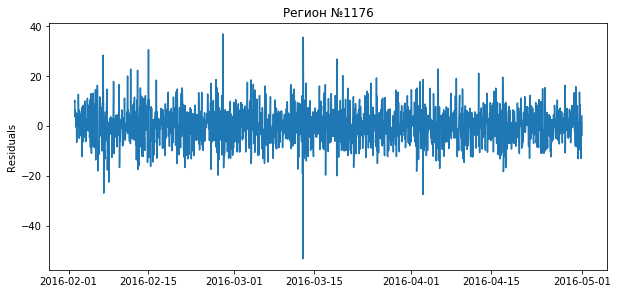

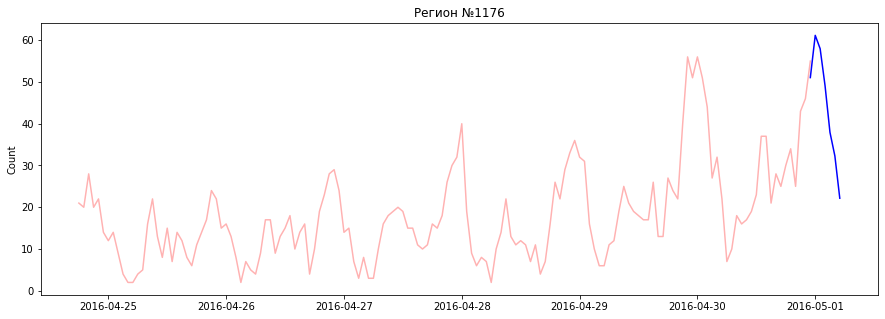

Success_reg: 1176
24686.995886757588
Критерий Стьюдента: p=0.901332
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.20704766492343005


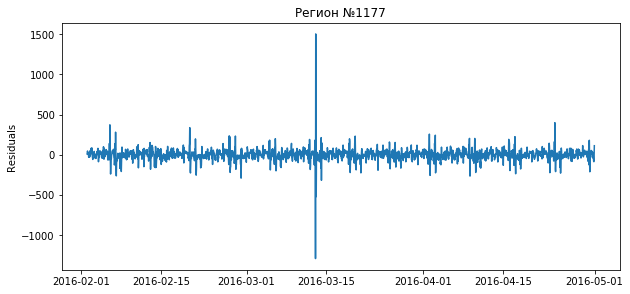

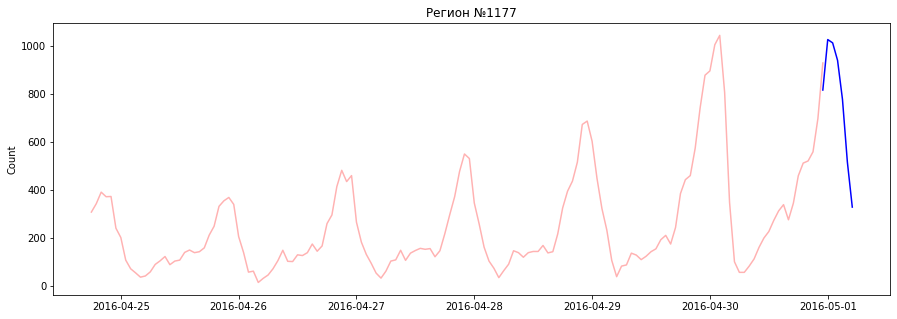

Success_reg: 1177
25165.02993062998
Критерий Стьюдента: p=0.957282
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: 0.1001269091951453


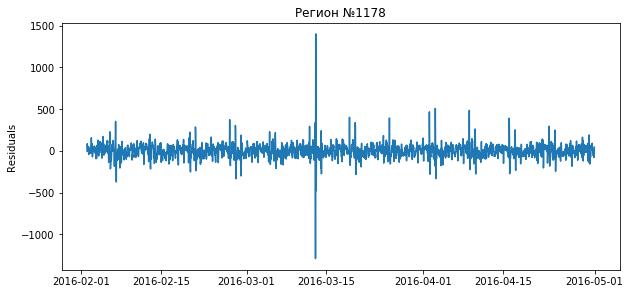

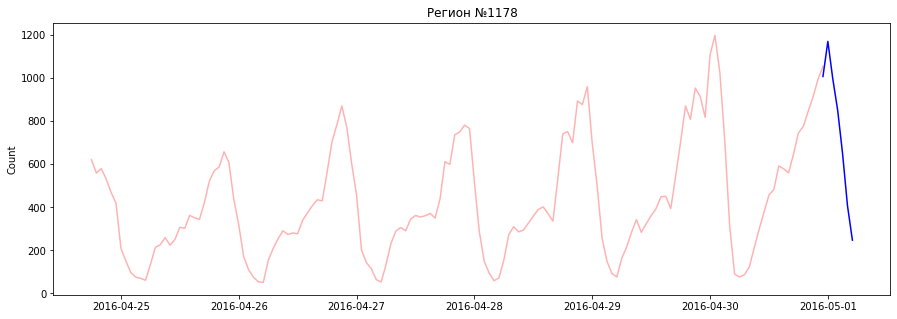

Success_reg: 1178
23973.191654312082
Критерий Стьюдента: p=0.267176
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -1.5746187309708146


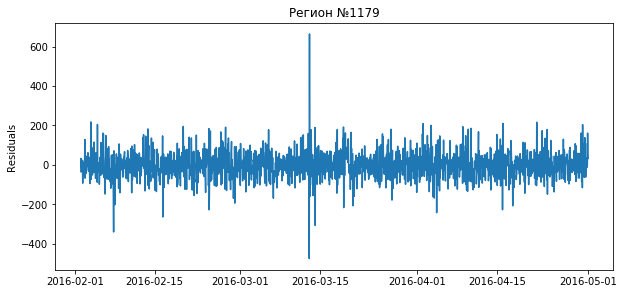

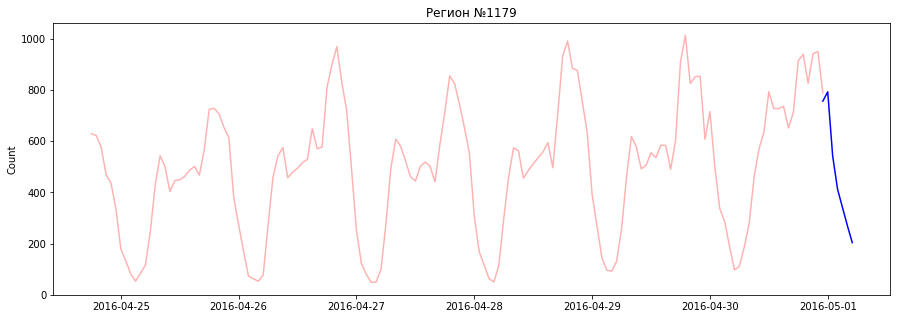

Success_reg: 1179
24331.52418577573
Критерий Стьюдента: p=0.398971
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -1.3002061013724129


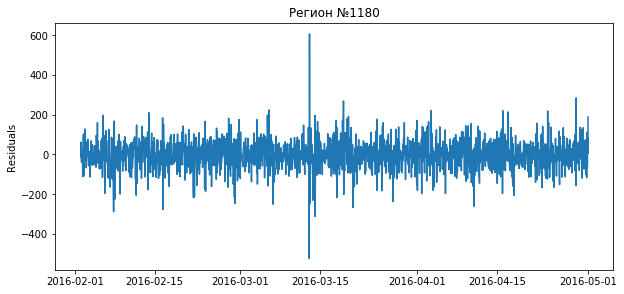

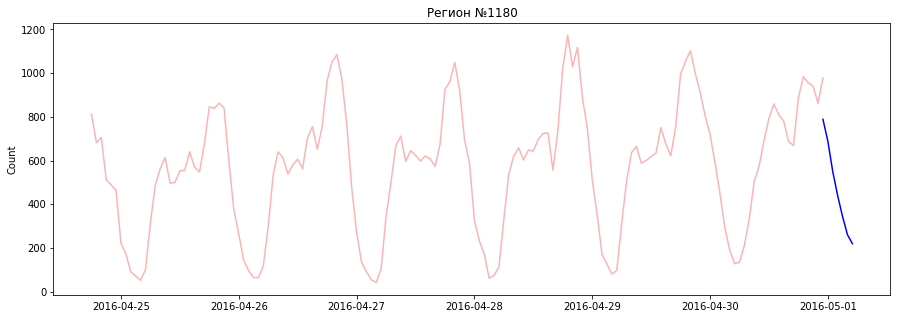

Success_reg: 1180
27289.784200592538
Критерий Стьюдента: p=0.879256
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: 0.46822777862255016


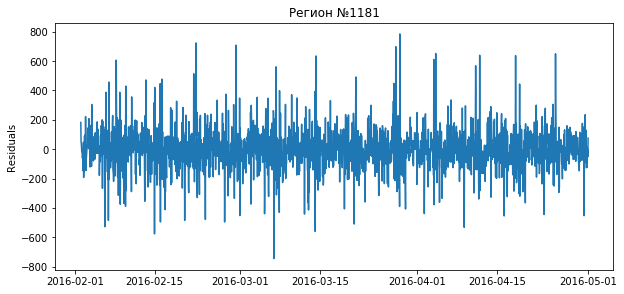

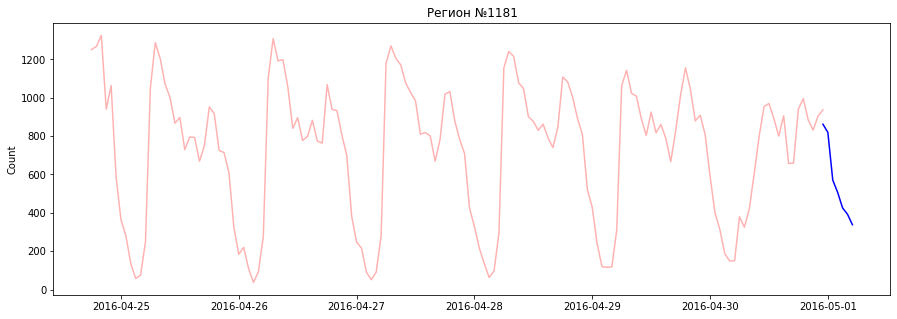

Success_reg: 1181
24205.703083697637
Критерий Стьюдента: p=0.377837
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -1.3226540267607216


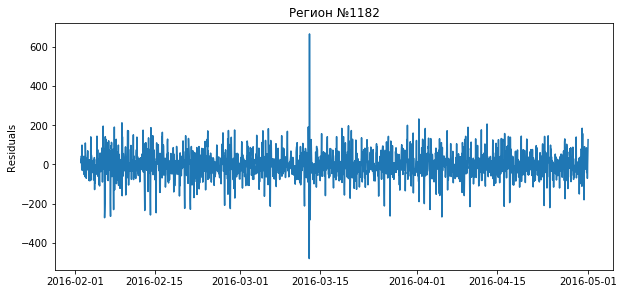

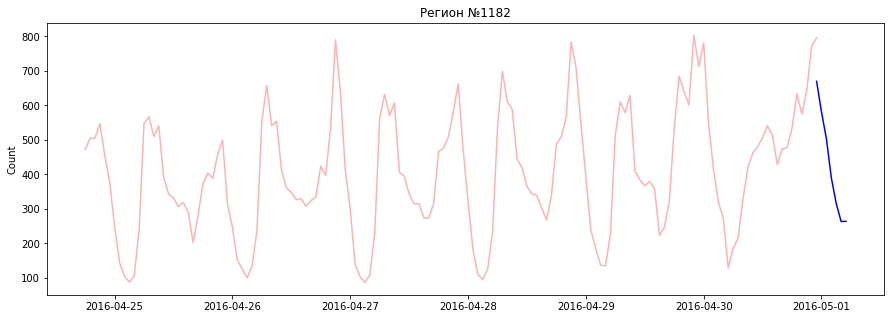

Success_reg: 1182
21915.119331613627
Критерий Стьюдента: p=0.981009
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: 0.02087066676723855


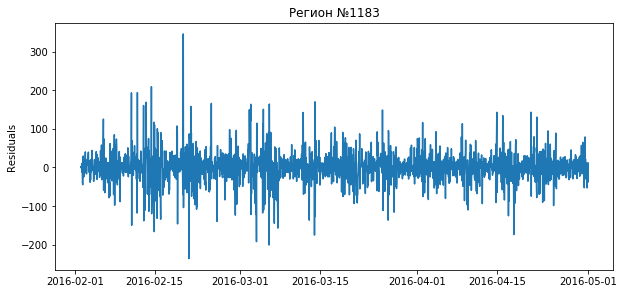

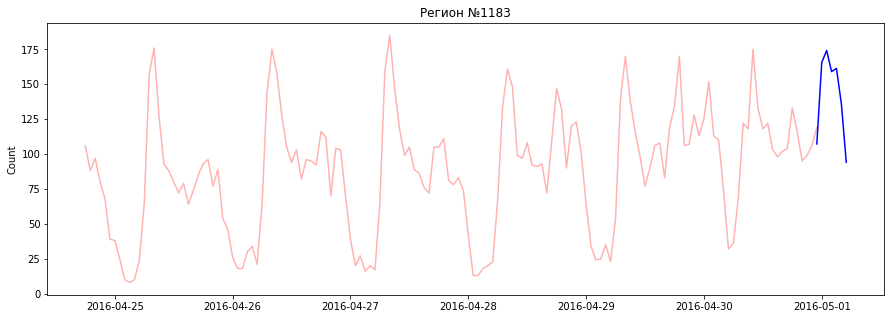

Success_reg: 1183
15002.614415975397
Критерий Стьюдента: p=0.782421
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.047963714504605175


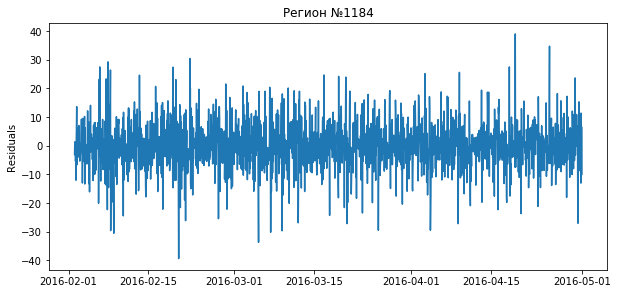

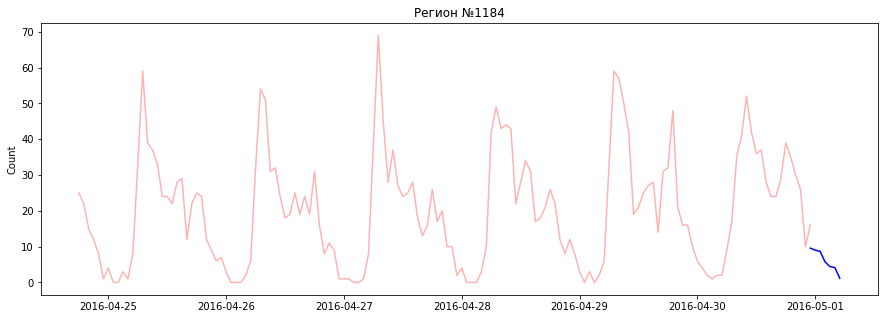

Success_reg: 1184
10837.577971763829
Критерий Стьюдента: p=0.680455
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.026891566257587717


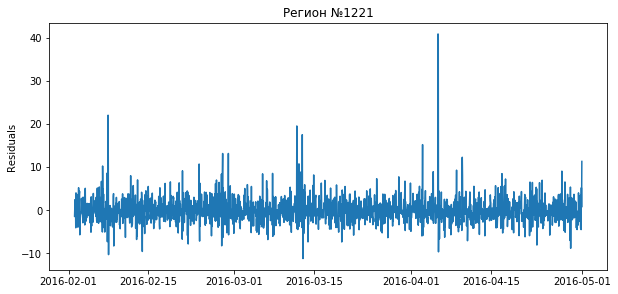

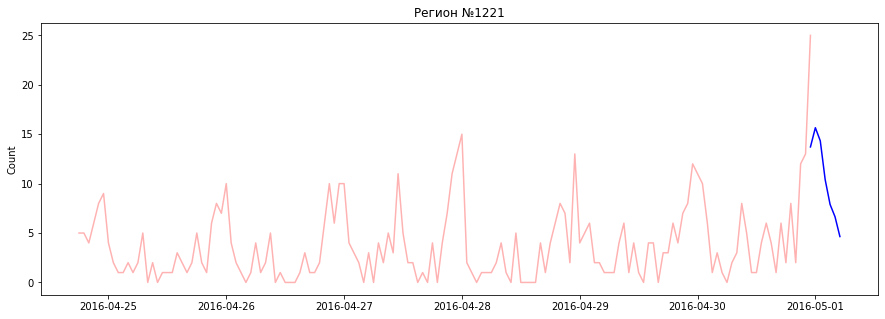

Success_reg: 1221
12991.925306364597
Критерий Стьюдента: p=0.851684
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.02021455021838764


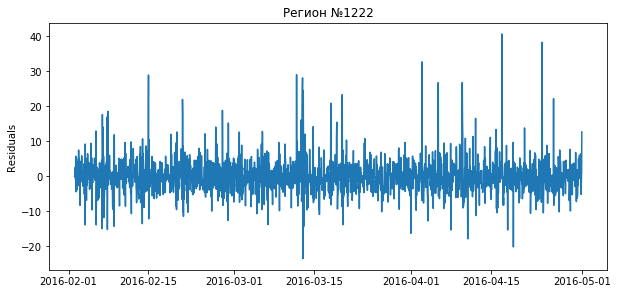

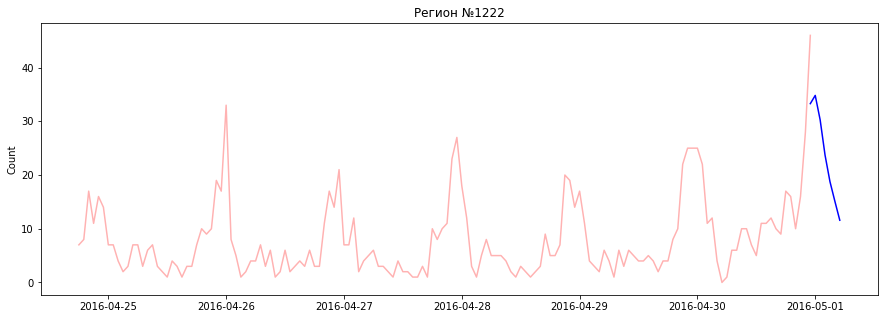

Success_reg: 1222
14690.447436251057
Критерий Стьюдента: p=0.287478
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.170665487495013


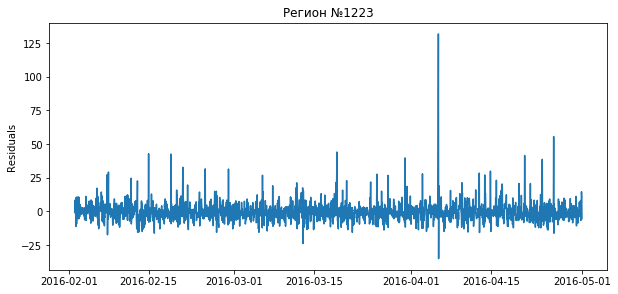

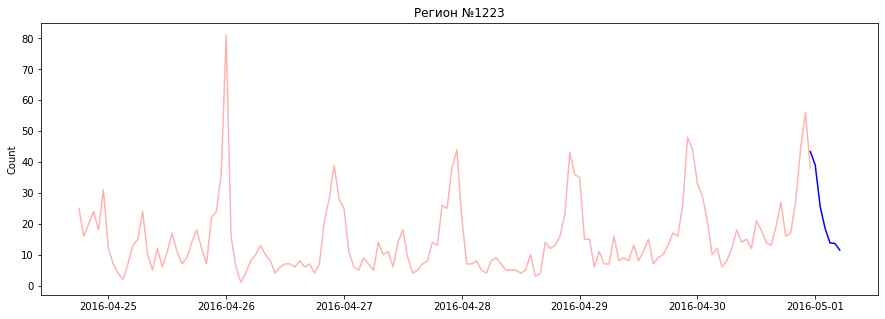

Success_reg: 1223
14834.26538872769
Критерий Стьюдента: p=0.037386
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.34780100126348046


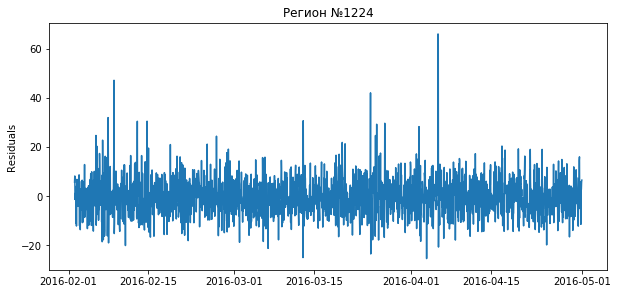

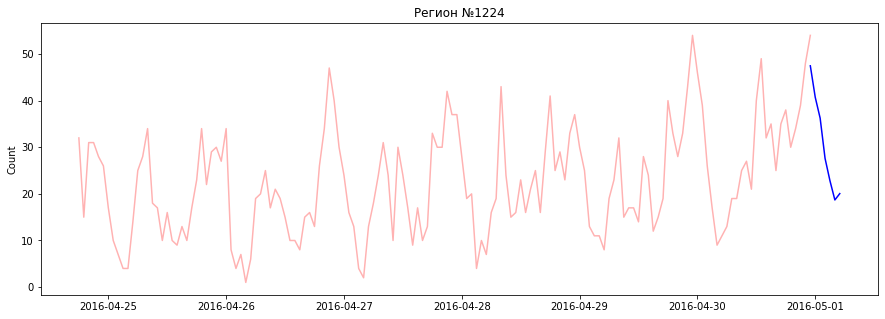

Success_reg: 1224
11114.479074435803
Критерий Стьюдента: p=0.449890
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.05277980476455157


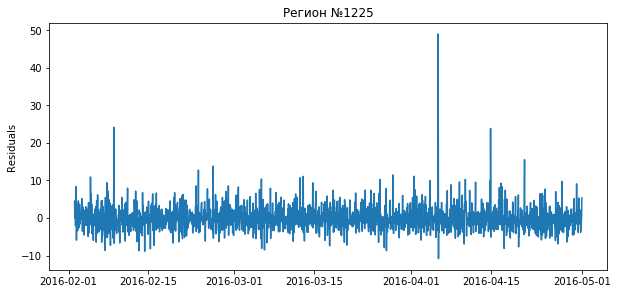

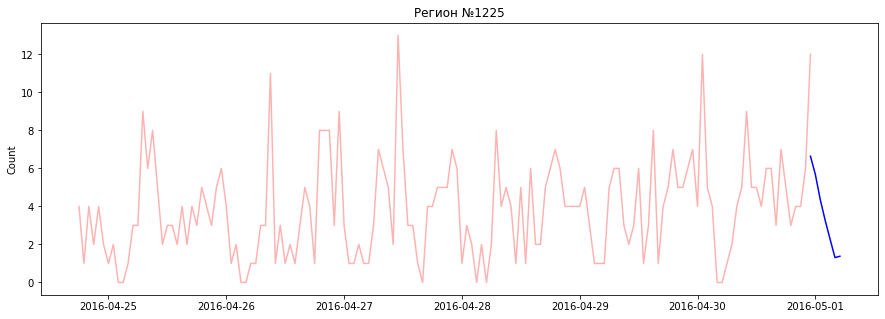

Success_reg: 1225
23392.679743546658
Критерий Стьюдента: p=0.928697
Критерий Дики-Фуллера: p=0.000001
Среднее по остаткам: -0.1104730629250313


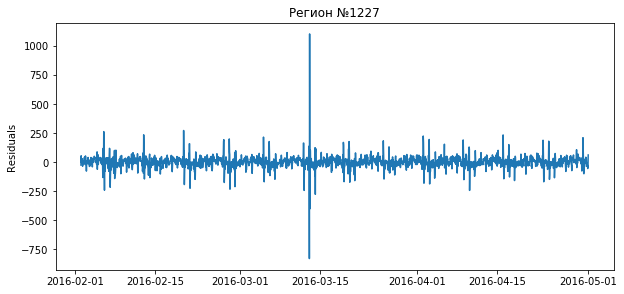

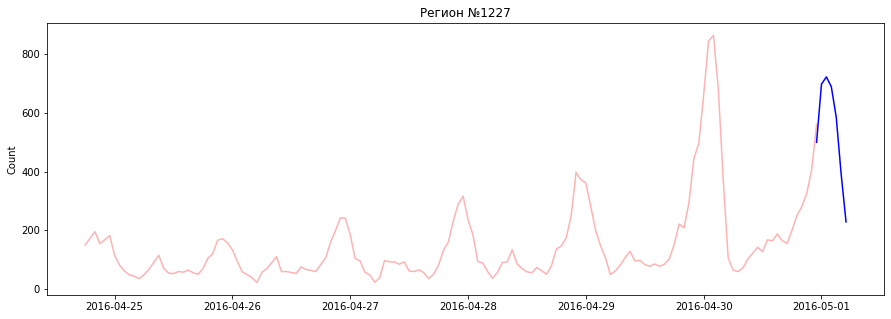

Success_reg: 1227
24748.46949006522
Критерий Стьюдента: p=0.906129
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: 0.19997057152509104


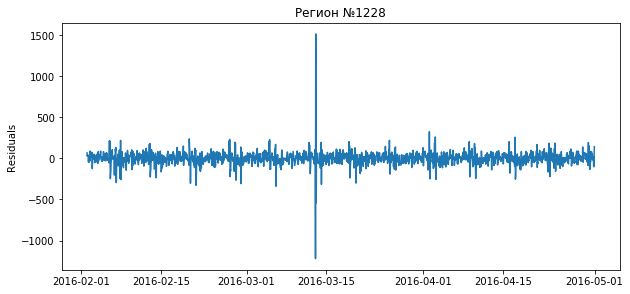

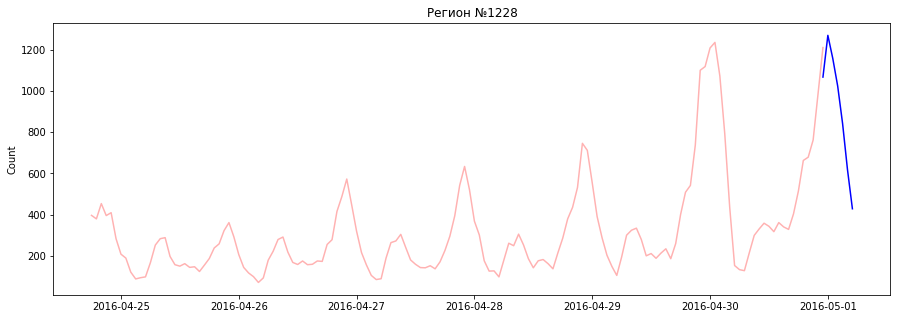

Success_reg: 1228
24540.85164846207
Критерий Стьюдента: p=0.222376
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -1.973849355269466


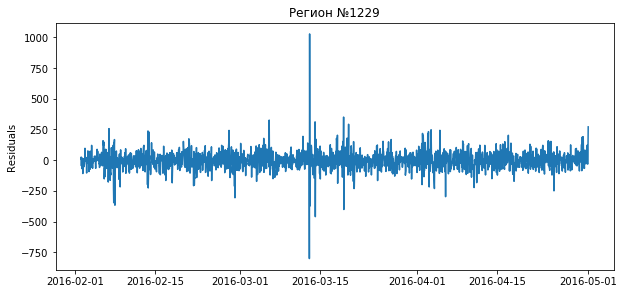

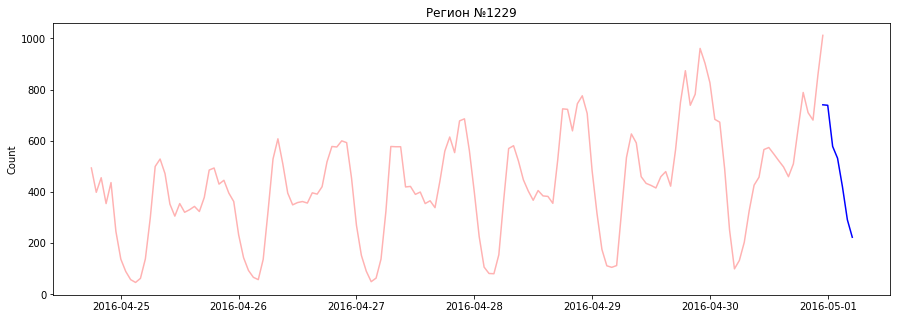

Success_reg: 1229
25553.78565244244
Критерий Стьюдента: p=0.522138
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -1.3166508538482098


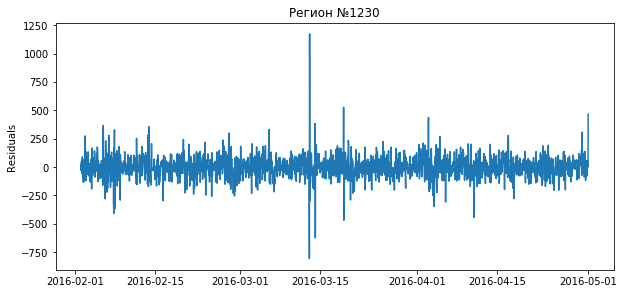

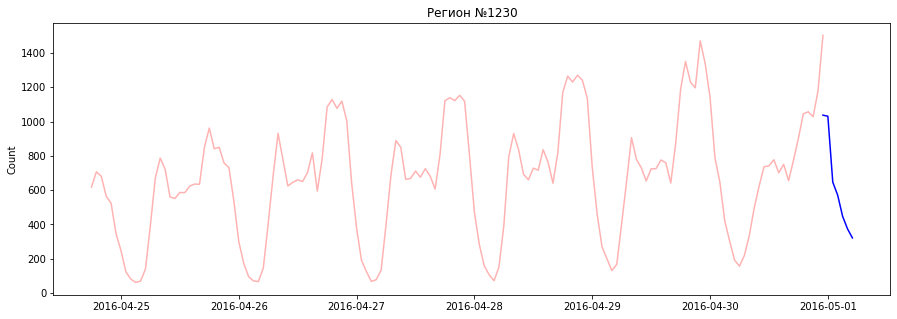

Success_reg: 1230
25094.01480859107
Критерий Стьюдента: p=0.575590
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -1.0339646735957477


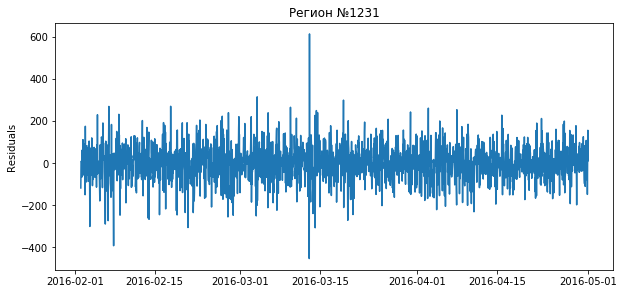

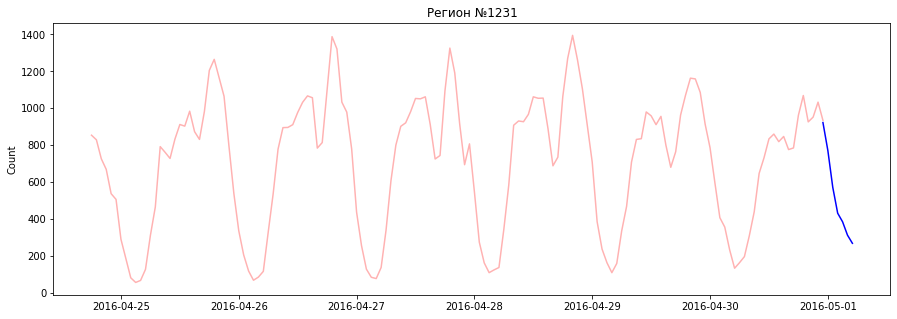

Success_reg: 1231
25855.830092129632
Критерий Стьюдента: p=0.222258
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -2.692035914444789


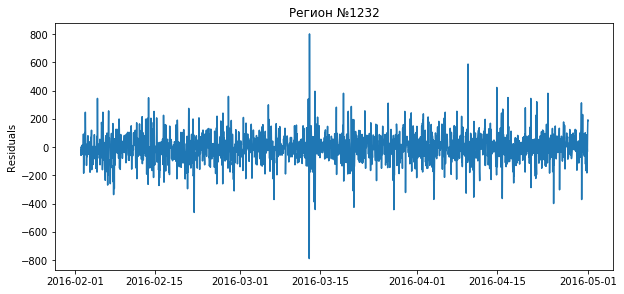

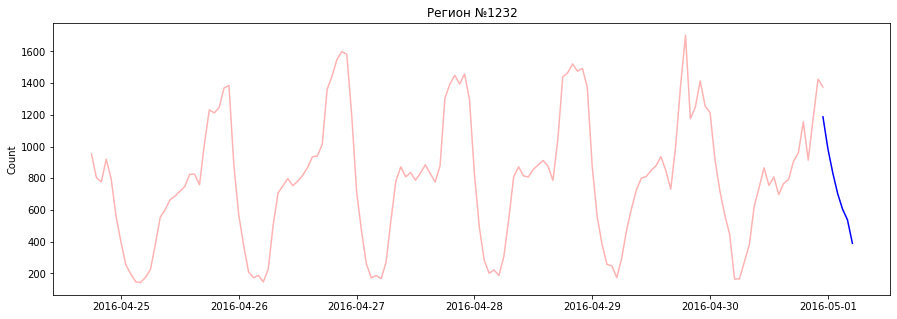

Success_reg: 1232
24826.13816934405
Критерий Стьюдента: p=0.300178
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -1.7966774615128136


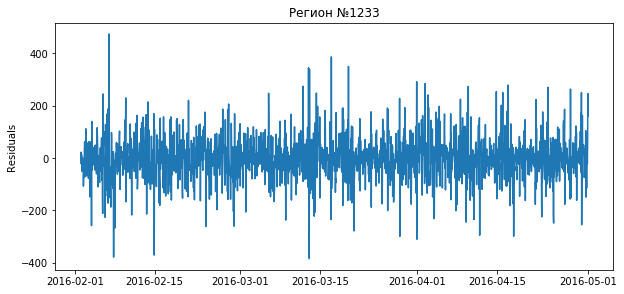

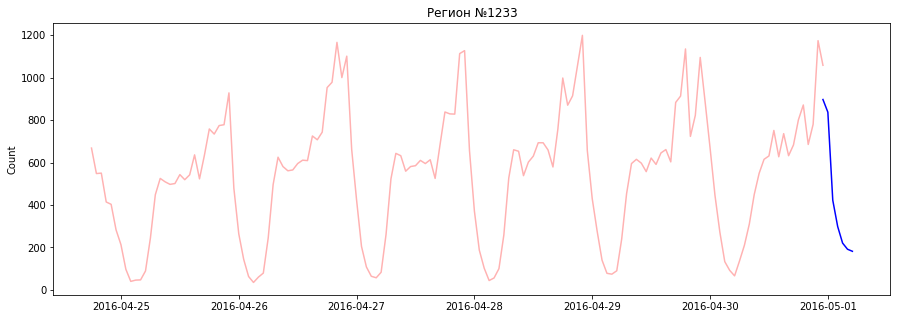

Success_reg: 1233
24294.291887741878
Критерий Стьюдента: p=0.807991
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.3714564179567028


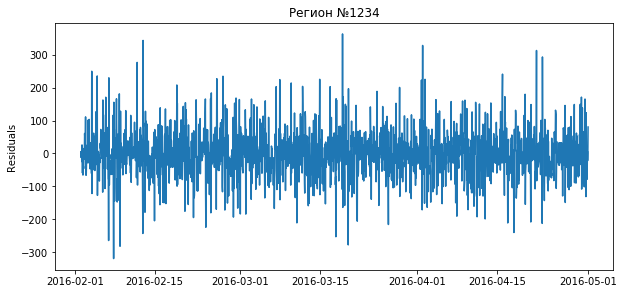

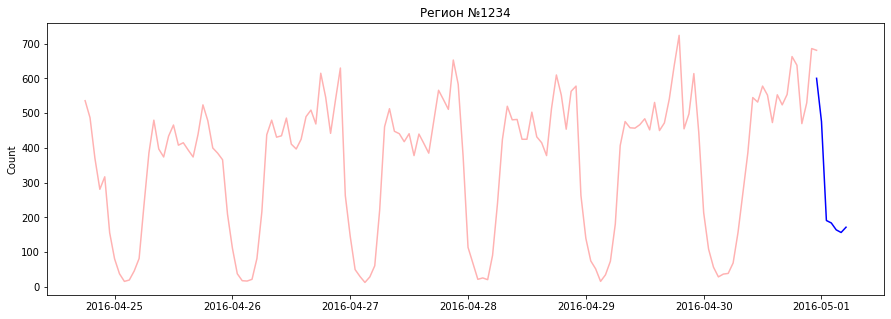

Success_reg: 1234
20693.154959598105
Критерий Стьюдента: p=0.765138
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.19665094584622836


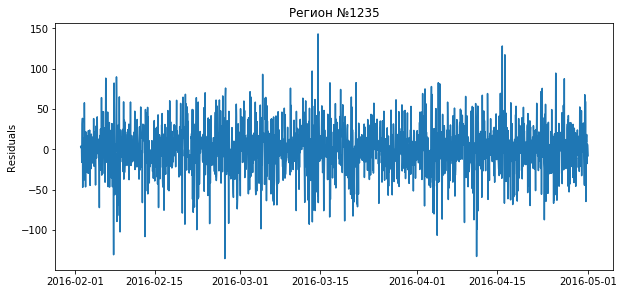

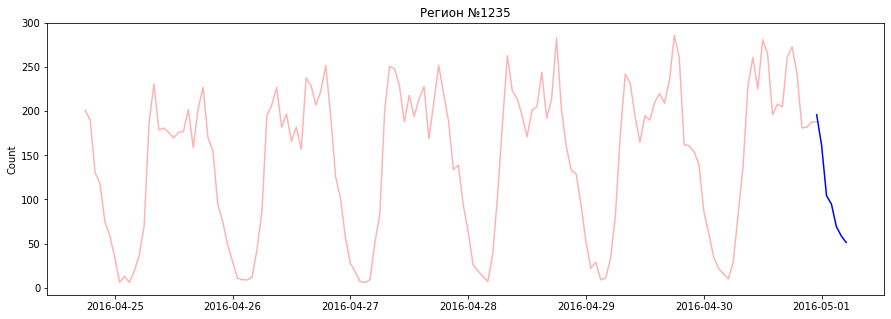

Success_reg: 1235
12386.178710481083
Критерий Стьюдента: p=0.360975
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.0857860495912275


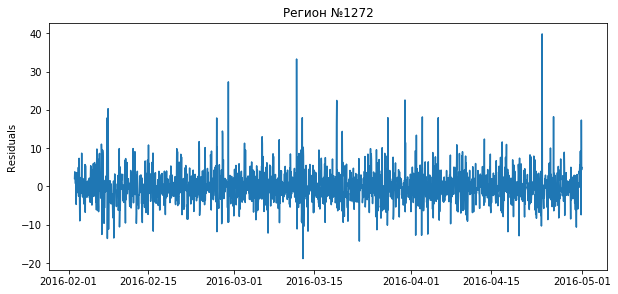

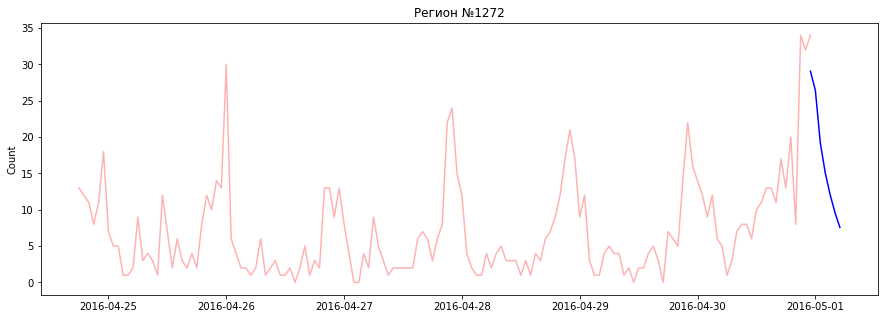

Success_reg: 1272
16212.10177583591
Критерий Стьюдента: p=0.332641
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.22171365962656697


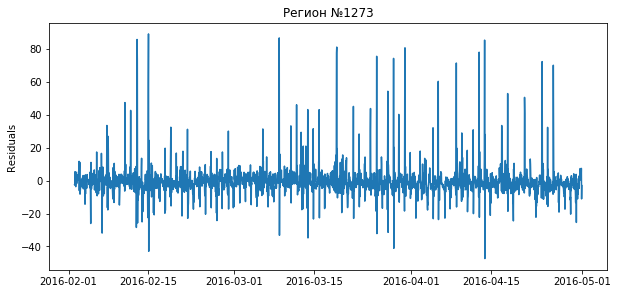

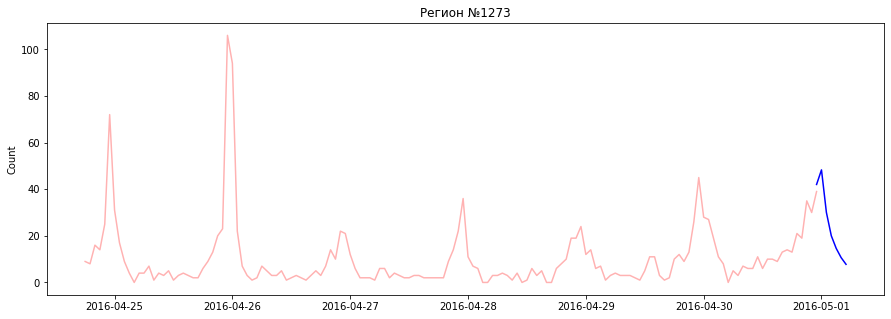

Success_reg: 1273
11590.251423677033
Критерий Стьюдента: p=0.485153
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.05451910156544344


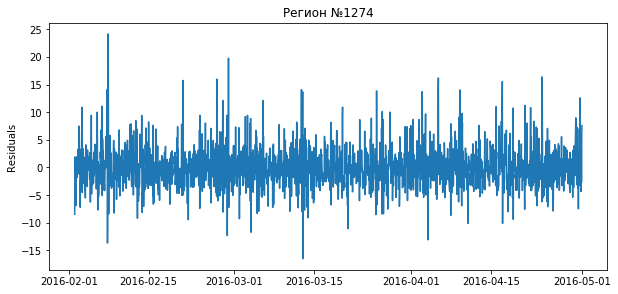

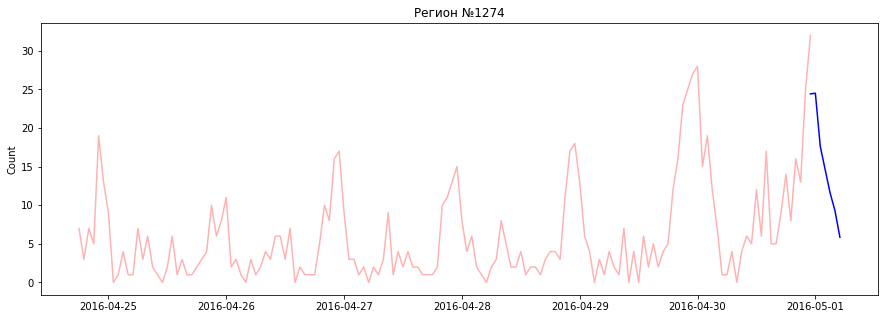

Success_reg: 1274
13473.35232847432
Критерий Стьюдента: p=0.400943
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.10232387634163796


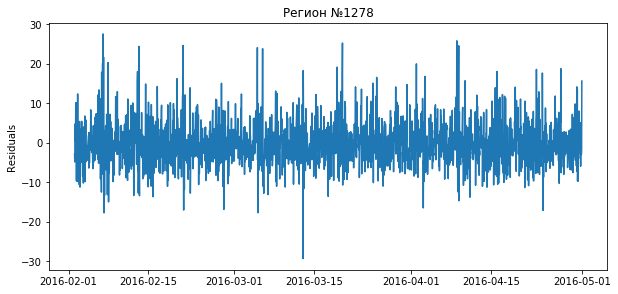

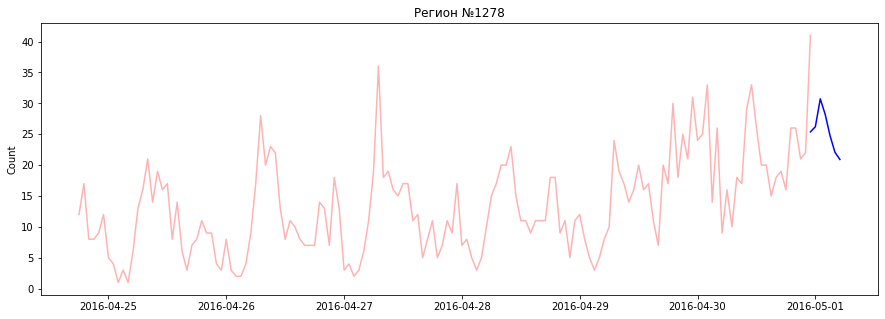

Success_reg: 1278
16191.995538465942
Критерий Стьюдента: p=0.961873
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.010970033040681292


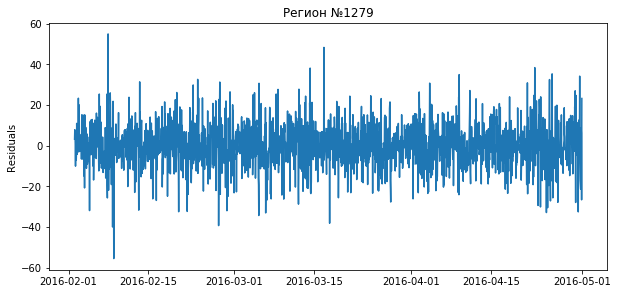

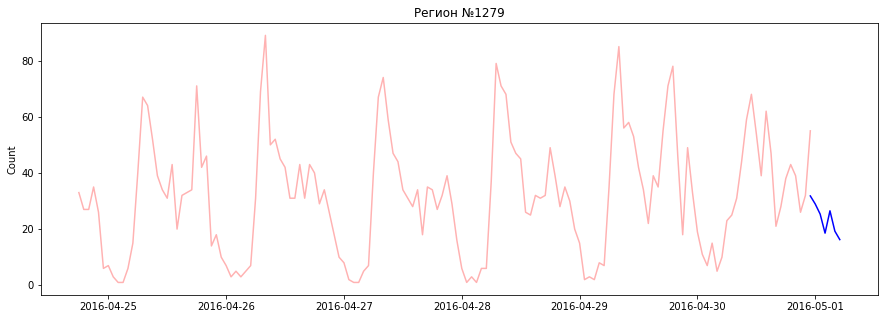

Success_reg: 1279
21417.67674572688
Критерий Стьюдента: p=0.806905
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.1904879942875545


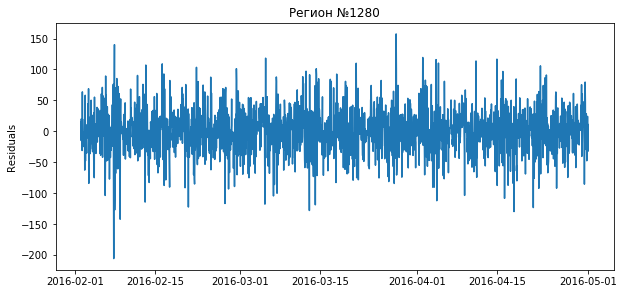

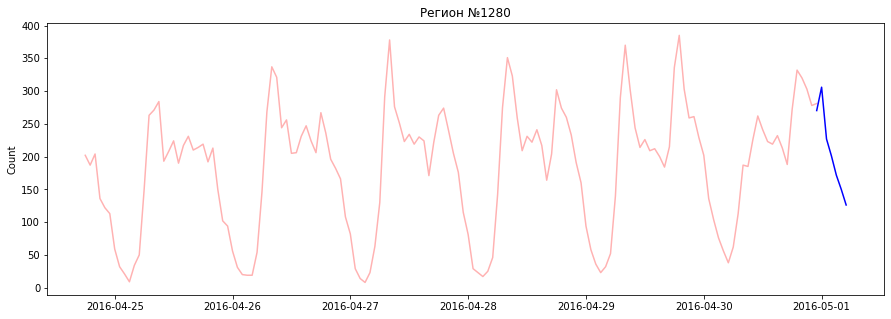

Success_reg: 1280
25118.420537993006
Критерий Стьюдента: p=0.745626
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.6051017682623127


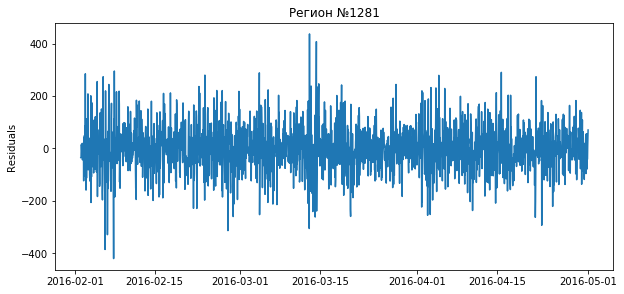

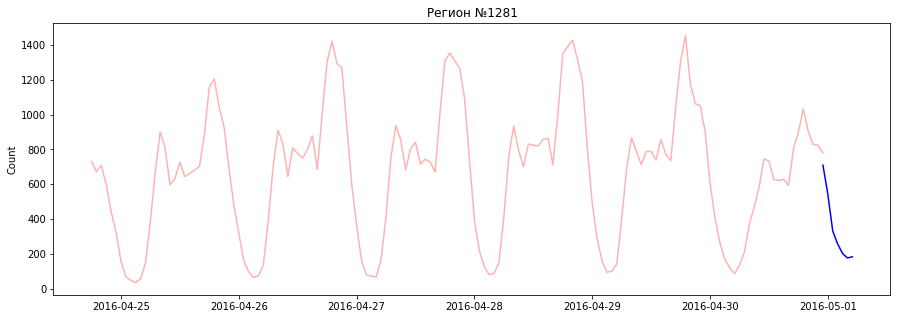

Success_reg: 1281
25951.246372486614
Критерий Стьюдента: p=0.927887
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.2051584063343632


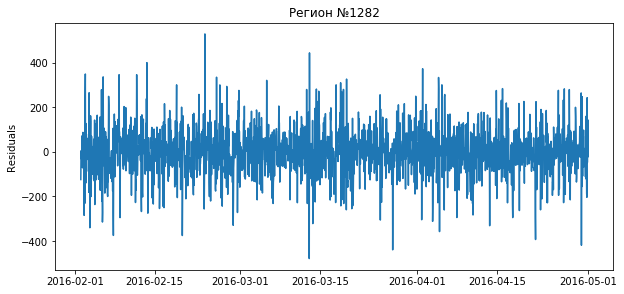

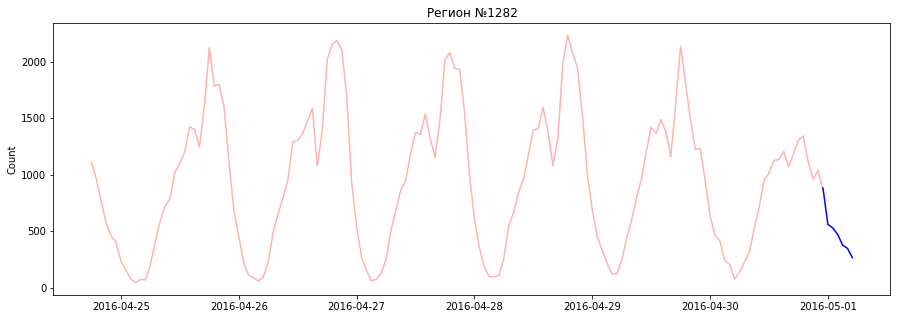

Success_reg: 1282
22017.29780747716
Критерий Стьюдента: p=0.674350
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: 0.3769509021967884


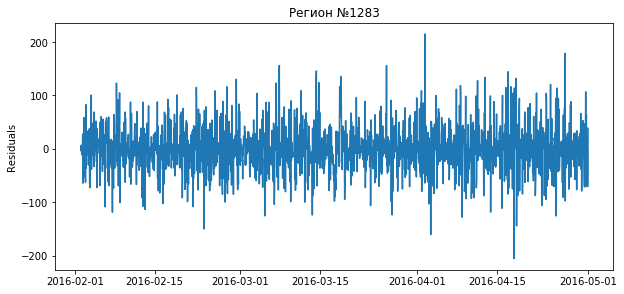

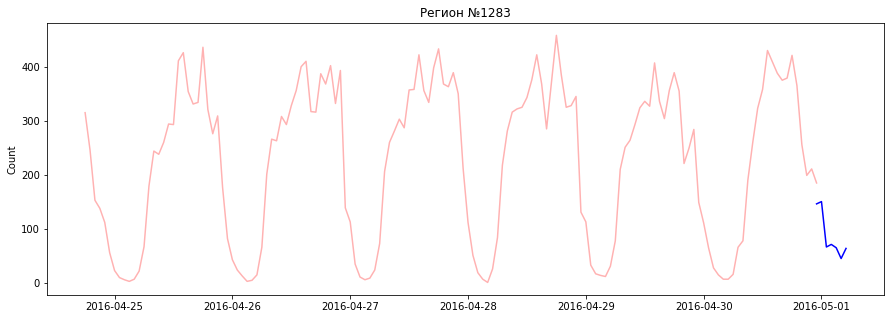

Success_reg: 1283
19734.626855353774
Критерий Стьюдента: p=0.663641
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.2286557160739321


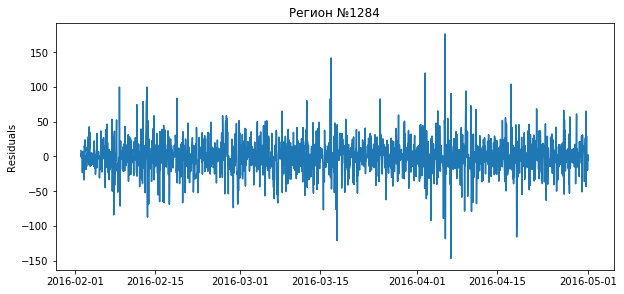

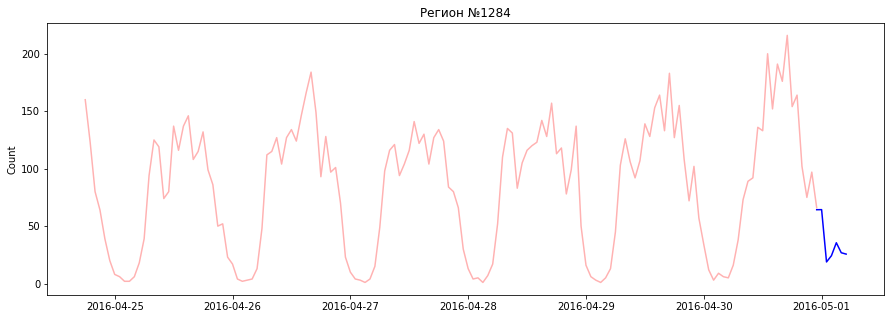

Success_reg: 1284
22458.09681294835
Критерий Стьюдента: p=0.728382
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.34527152574206416


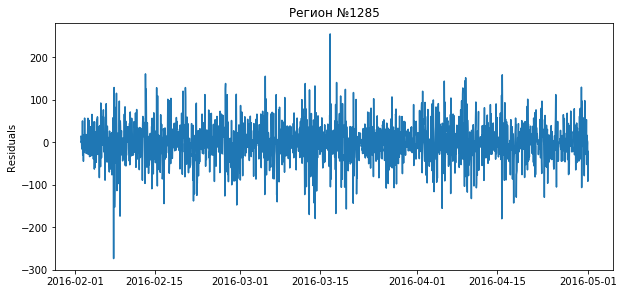

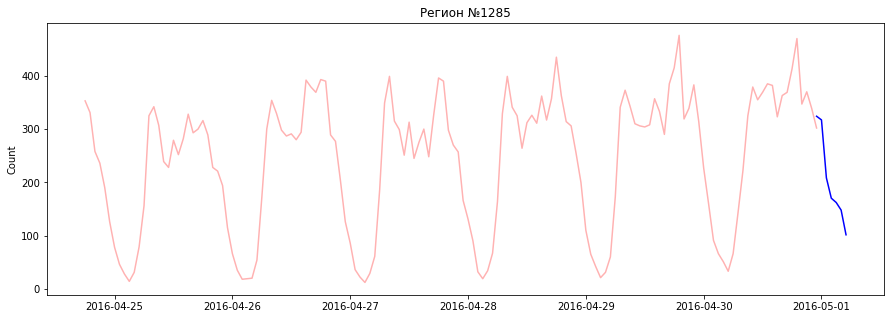

Success_reg: 1285
22289.81137655909
Критерий Стьюдента: p=0.646356
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.4389593464162227


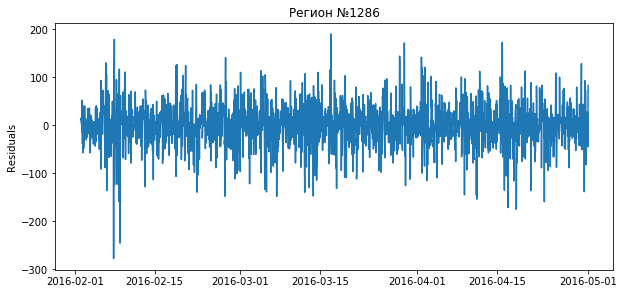

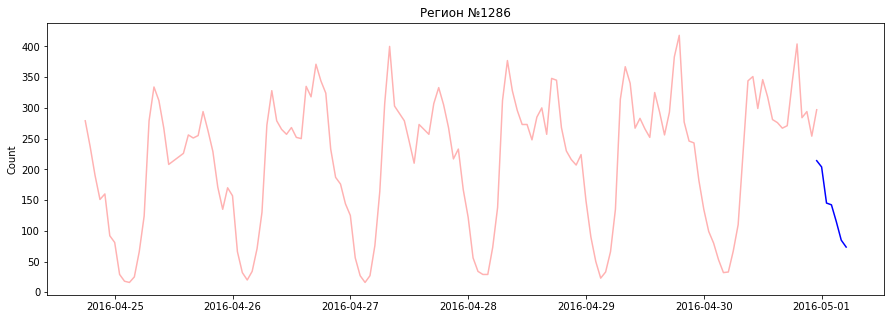

Success_reg: 1286
18790.86094717639
Критерий Стьюдента: p=0.715105
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.15390033820491686


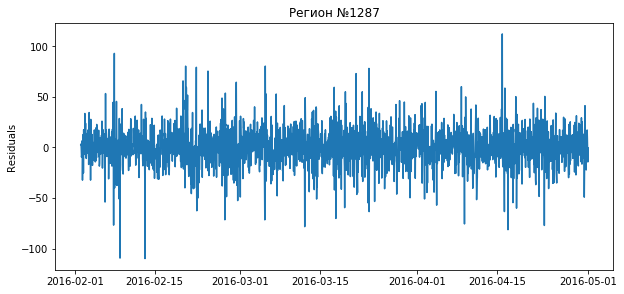

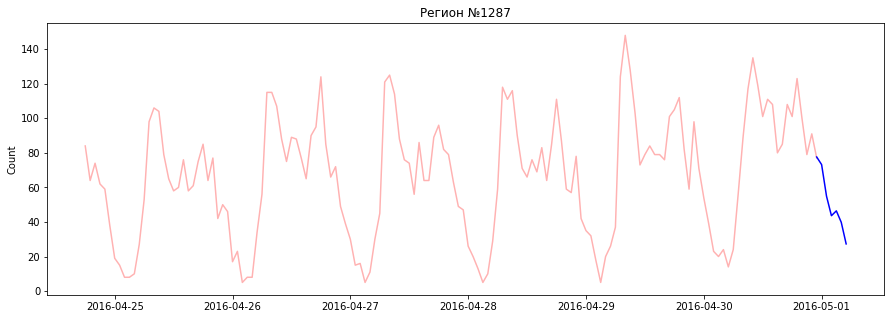

Success_reg: 1287
15842.608048394177
Критерий Стьюдента: p=0.653063
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.09464516740968038


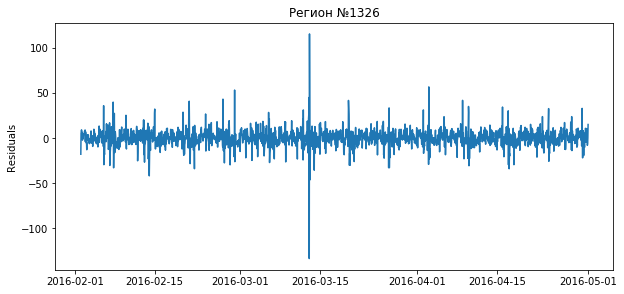

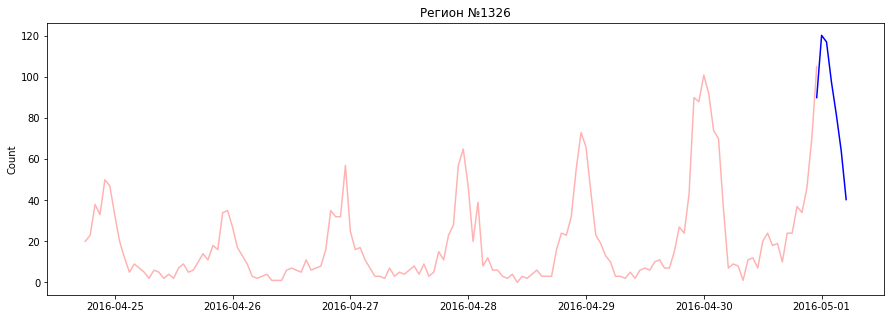

Success_reg: 1326
16731.951834961073
Критерий Стьюдента: p=0.731236
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.08894775366937481


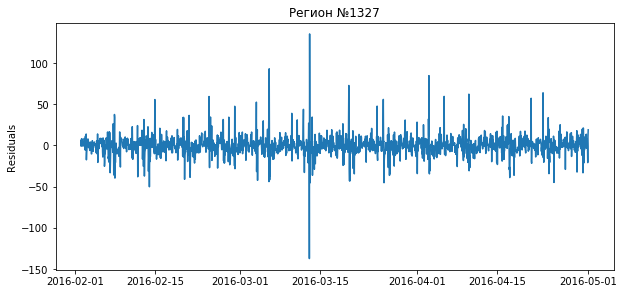

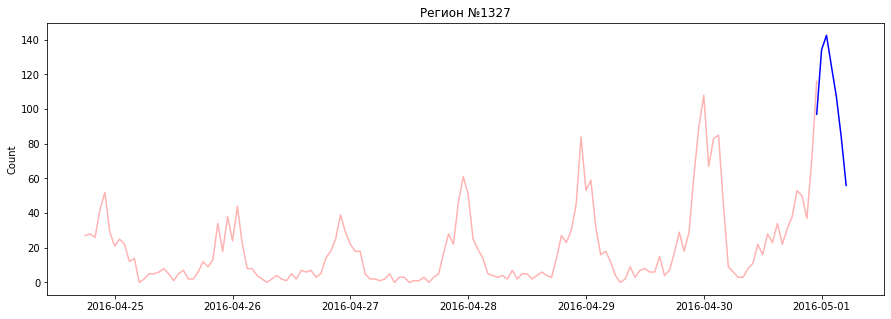

Success_reg: 1327
17308.02224978021
Критерий Стьюдента: p=0.922247
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: 0.029090640471130854


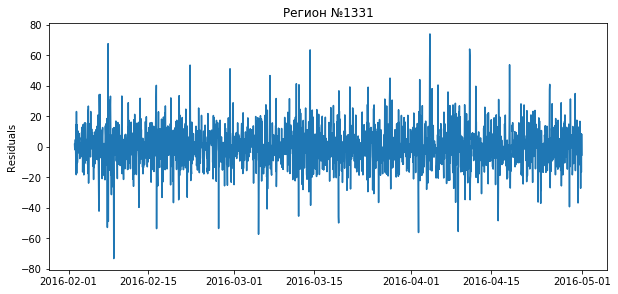

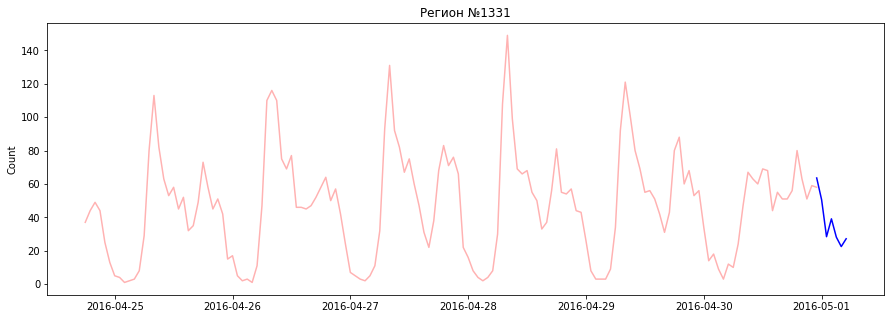

Success_reg: 1331
23670.84837001269
Критерий Стьюдента: p=0.999042
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.0015824662107350716


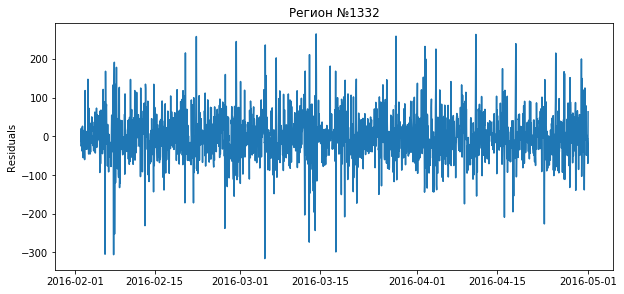

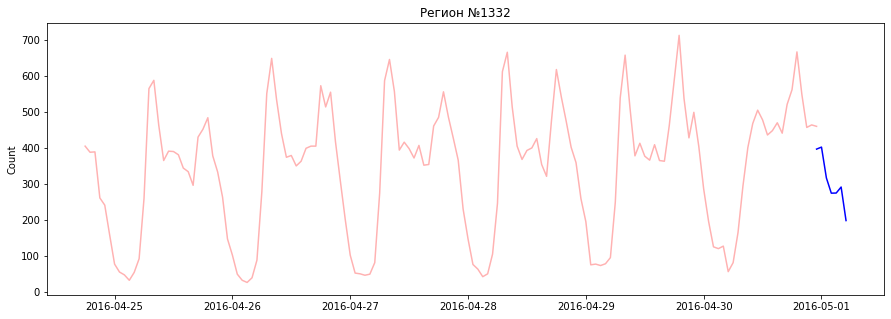

Success_reg: 1332
25008.77377716373
Критерий Стьюдента: p=0.757585
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: 0.5571260490110304


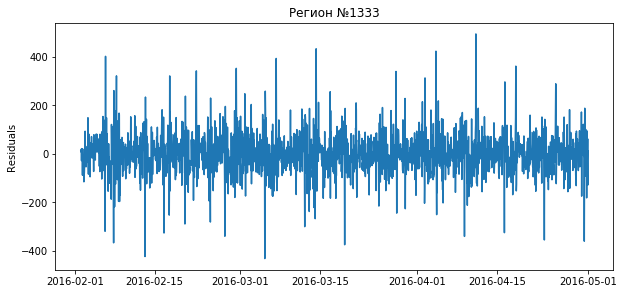

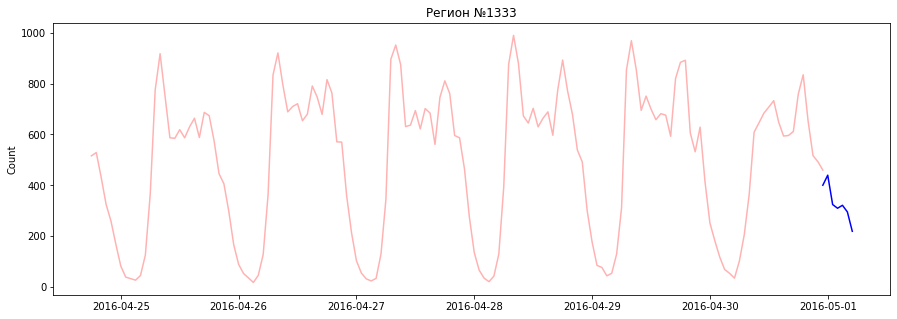

Success_reg: 1333
24469.30437030692
Критерий Стьюдента: p=0.709518
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: 0.5941139737203741


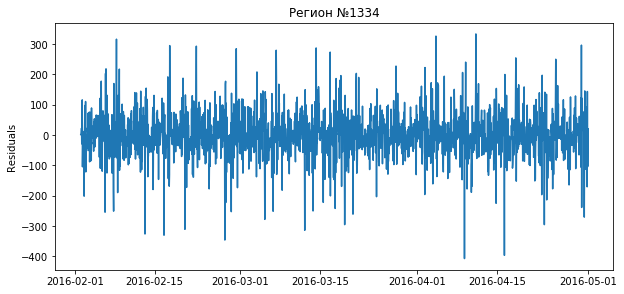

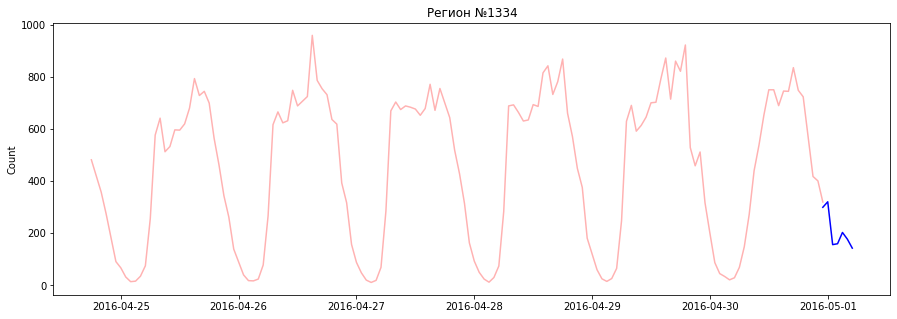

Success_reg: 1334
20287.33393816609
Критерий Стьюдента: p=0.927925
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.05417059038959025


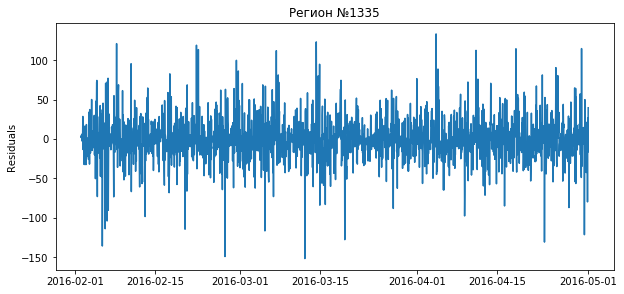

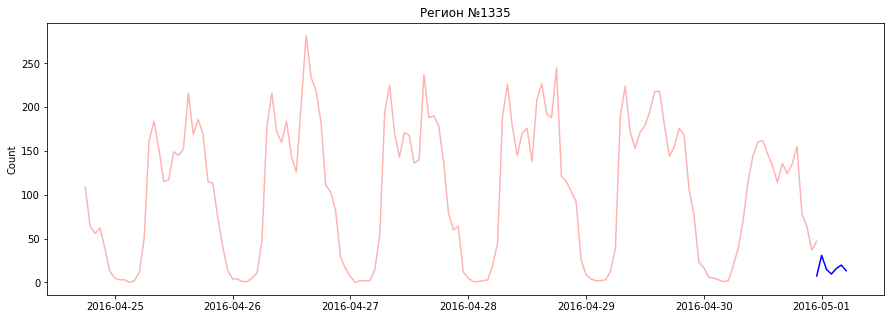

Success_reg: 1335
18213.26979156499
Критерий Стьюдента: p=0.839318
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.07465027183500839


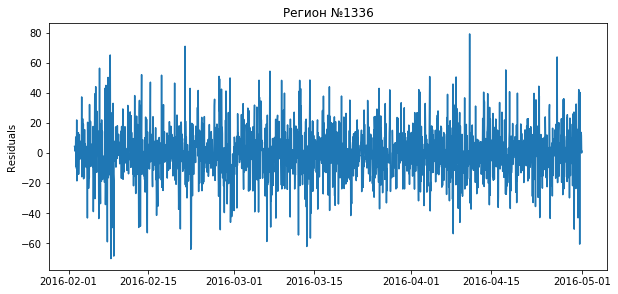

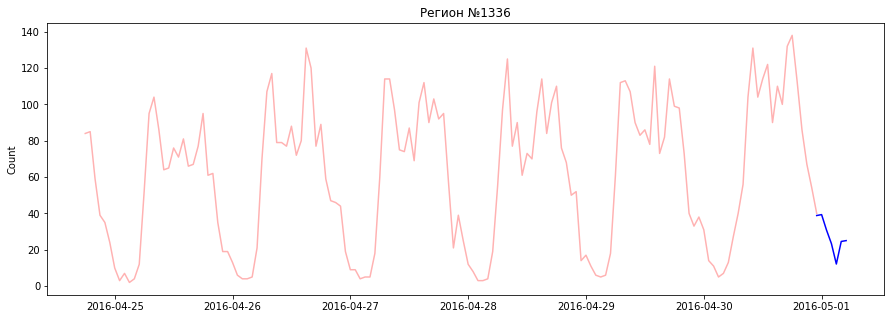

Success_reg: 1336
18873.255805862333
Критерий Стьюдента: p=0.970474
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.01591958372306694


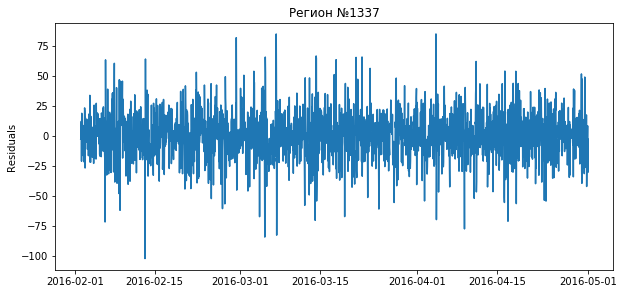

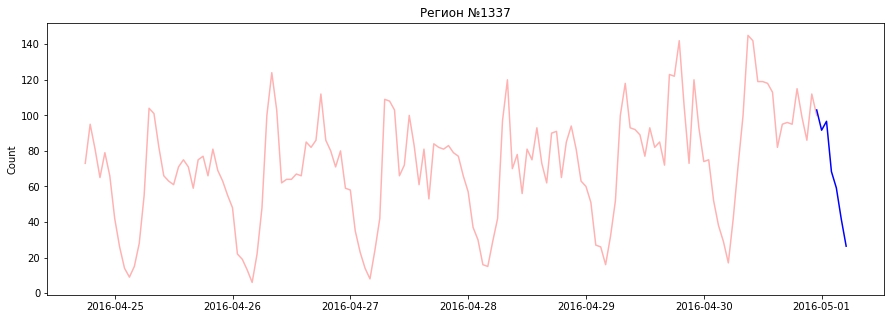

Success_reg: 1337
16872.691848186238
Критерий Стьюдента: p=0.891599
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.03668683449605539


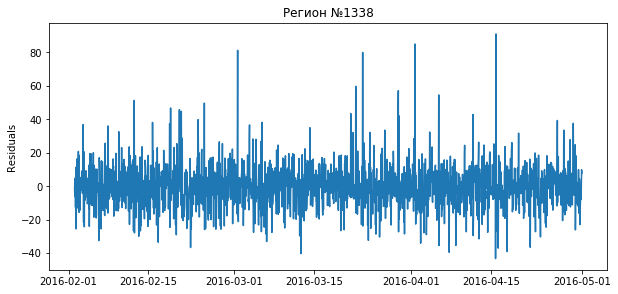

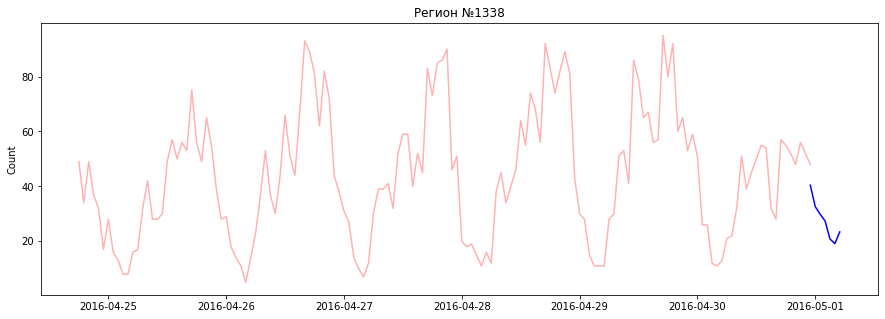

Success_reg: 1338
12610.481827388605
Критерий Стьюдента: p=0.635754
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.047018306811962673


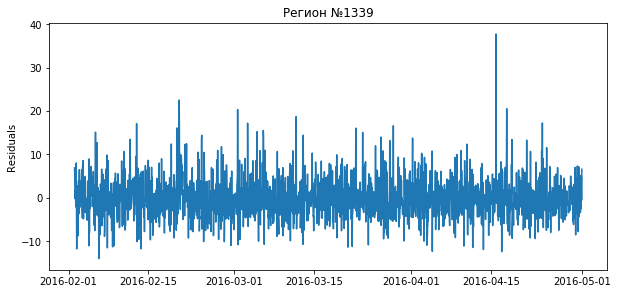

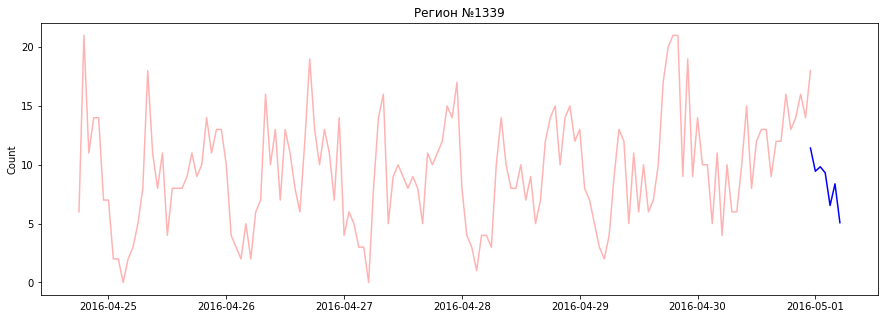

Success_reg: 1339
14617.895669248854
Критерий Стьюдента: p=0.645216
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.07273330201423966


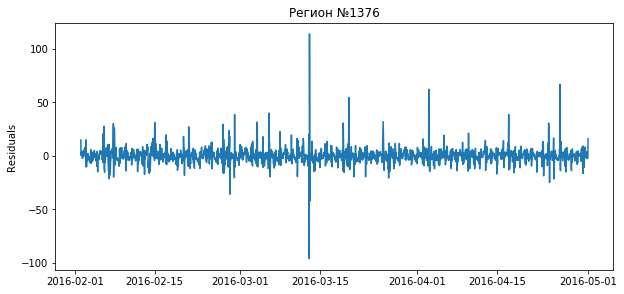

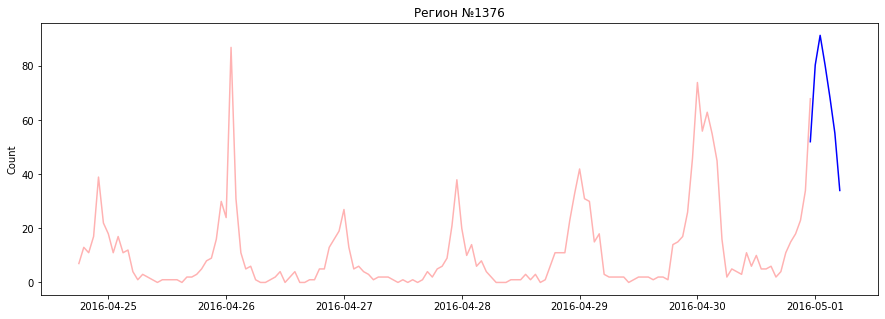

Success_reg: 1376
12788.02175011534
Критерий Стьюдента: p=0.758350
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.03168953197126633


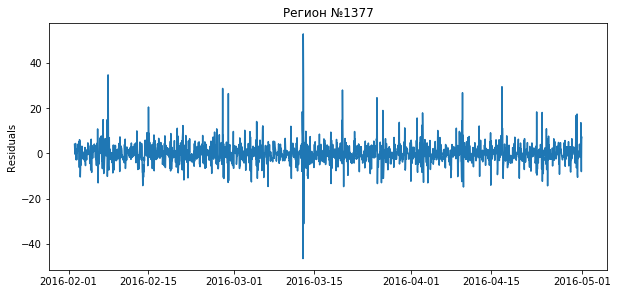

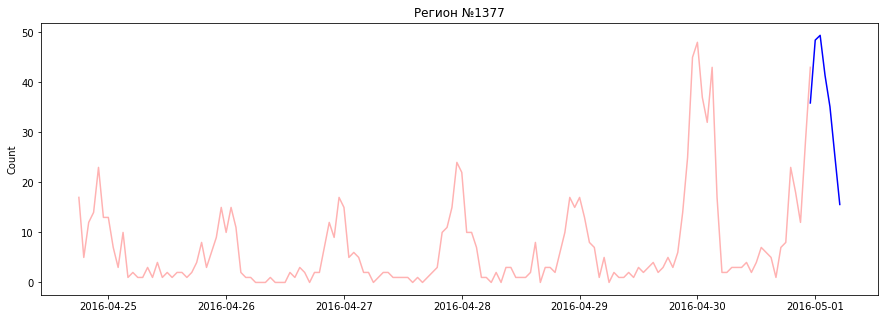

Success_reg: 1377
11907.714373545243
Критерий Стьюдента: p=0.473215
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.0604270696198439


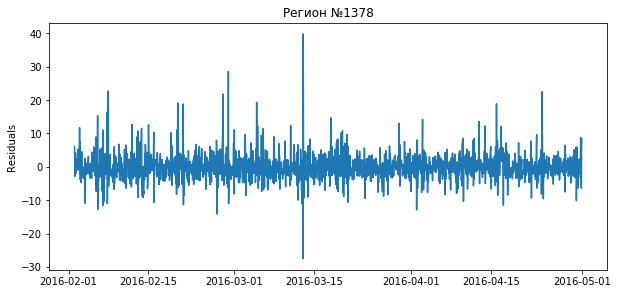

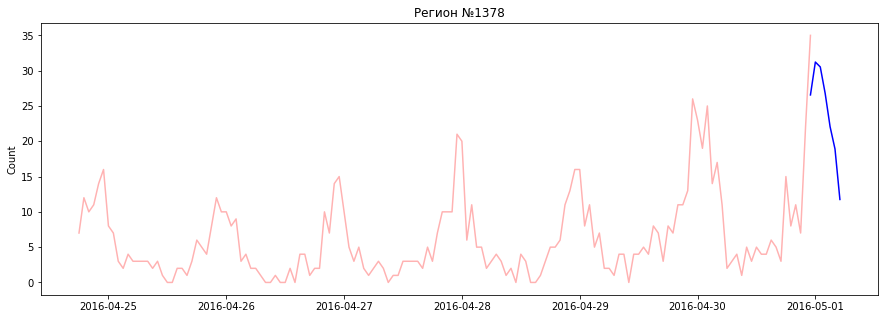

Success_reg: 1378
12772.771818687774
Критерий Стьюдента: p=0.617103
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.053439132385155345


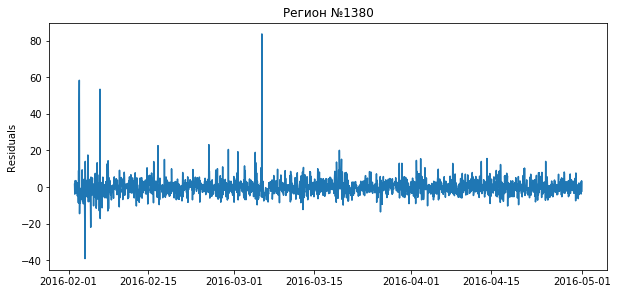

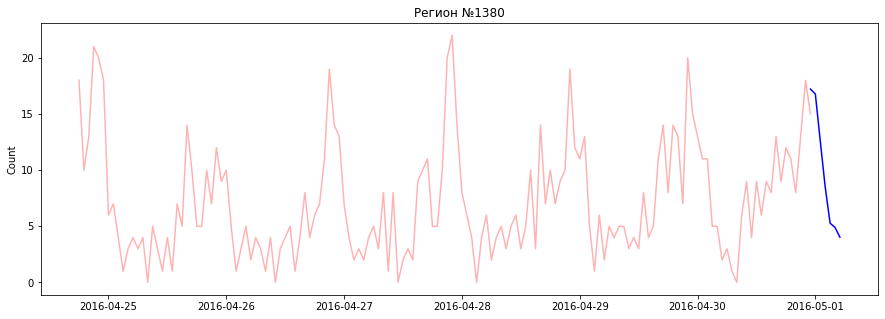

Success_reg: 1380
14803.94790115724
Критерий Стьюдента: p=0.785081
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.04525387326467581


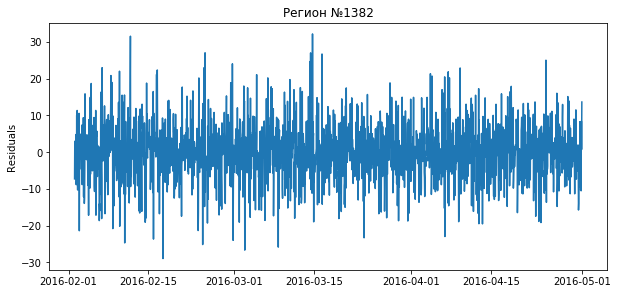

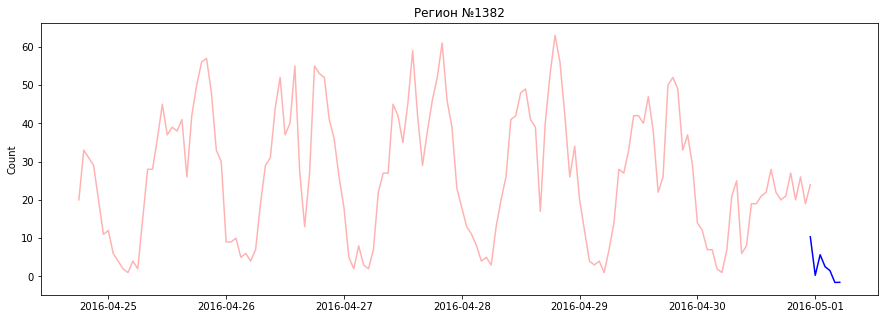

Success_reg: 1382
22642.629688080822
Критерий Стьюдента: p=0.927782
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.09421931980339648


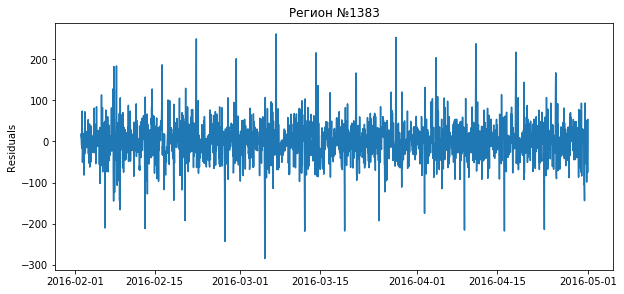

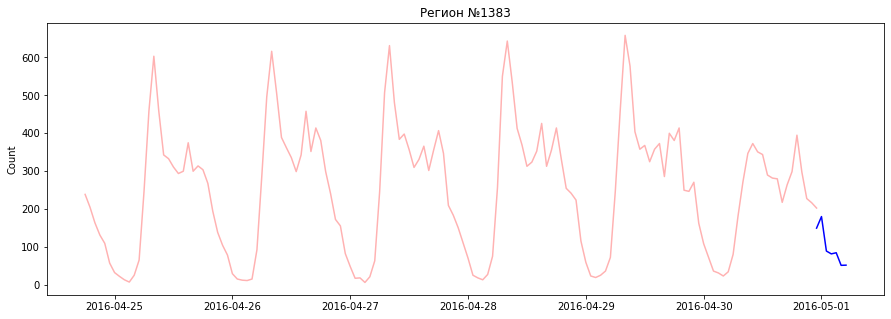

Success_reg: 1383
24699.500559452055
Критерий Стьюдента: p=0.731218
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.577509087734707


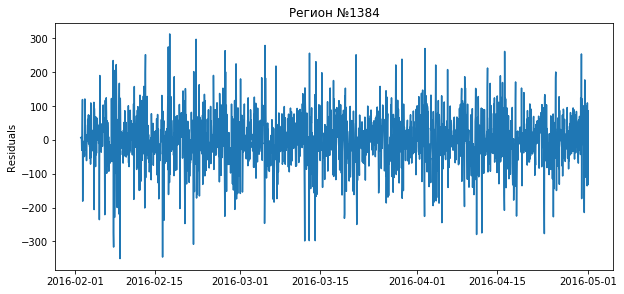

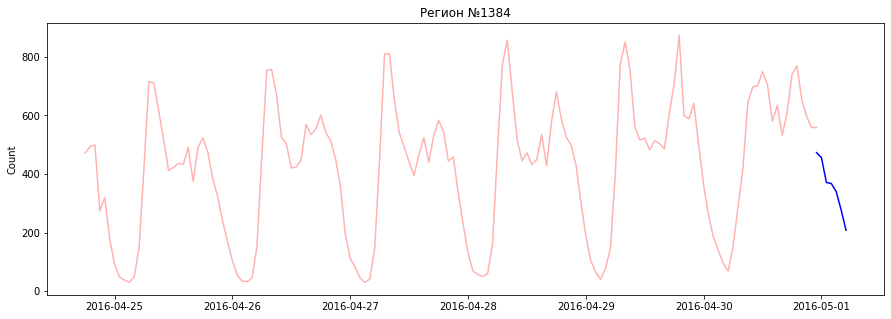

Success_reg: 1384
22659.81757038743
Критерий Стьюдента: p=0.941643
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: 0.07633497874814212


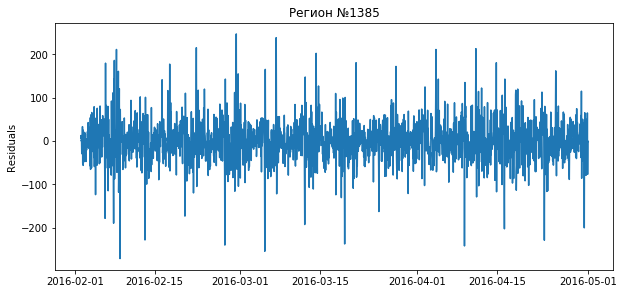

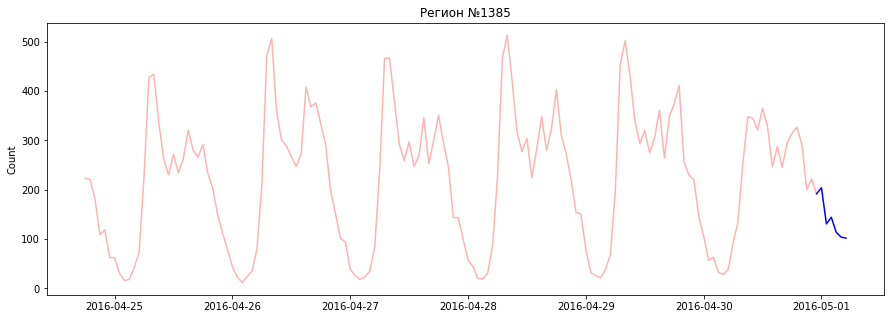

Success_reg: 1385
17068.009219378368
Критерий Стьюдента: p=0.720690
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.1007303108795428


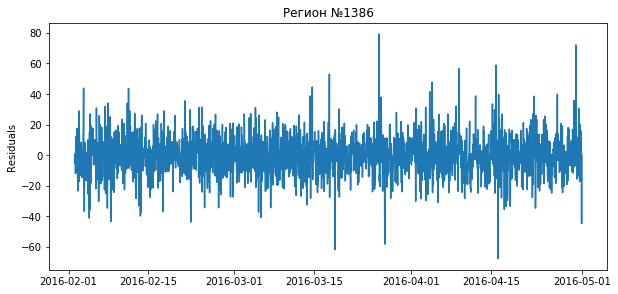

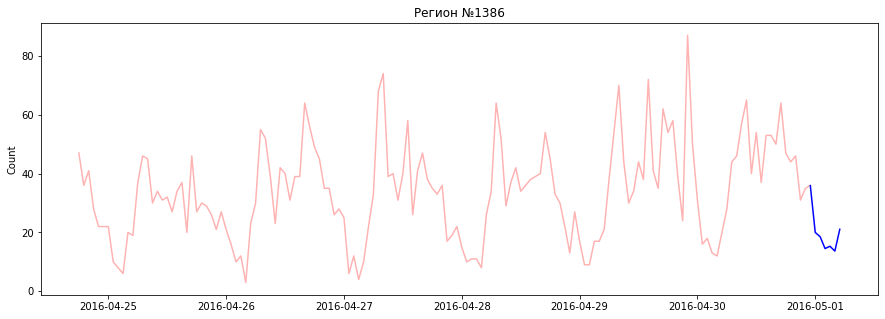

Success_reg: 1386
15663.850903980763
Критерий Стьюдента: p=0.236776
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.2399731639961821


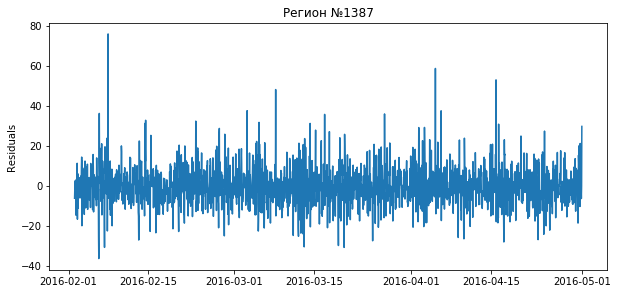

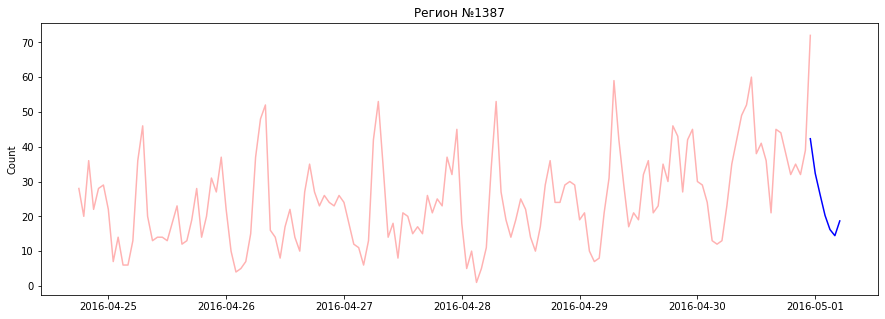

Success_reg: 1387
14327.64454743253
Критерий Стьюдента: p=0.199387
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.1903760122137066


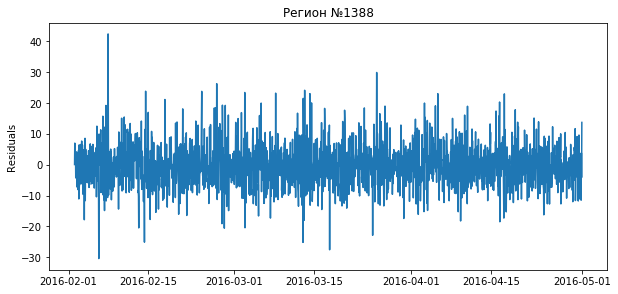

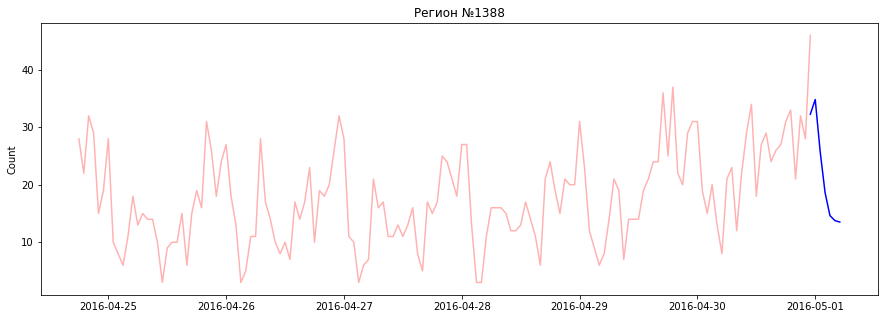

Success_reg: 1388
13347.311301641168
Критерий Стьюдента: p=0.284490
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.12609921674839356


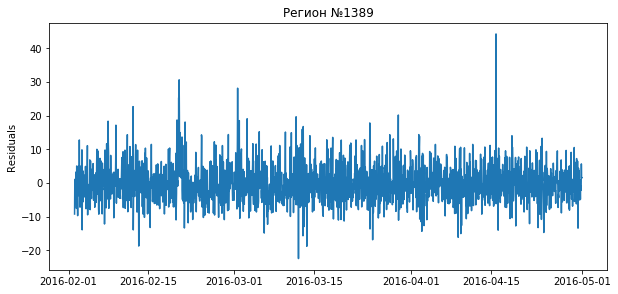

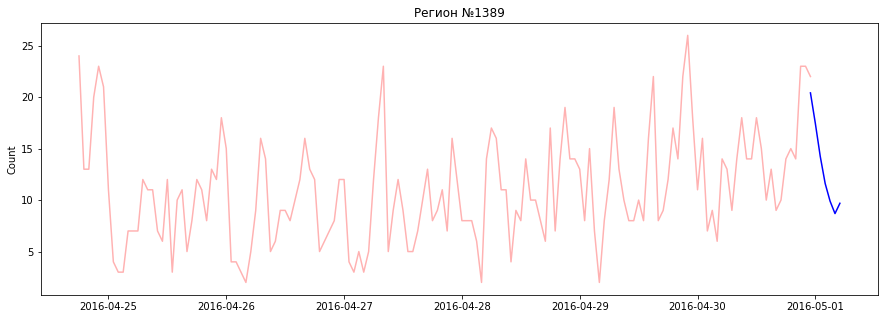

Success_reg: 1389
13410.615443269538
Критерий Стьюдента: p=0.102349
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.19528688164718452


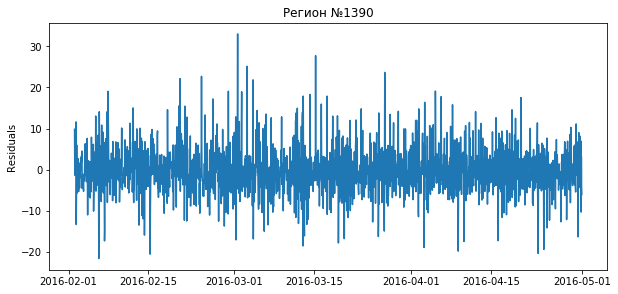

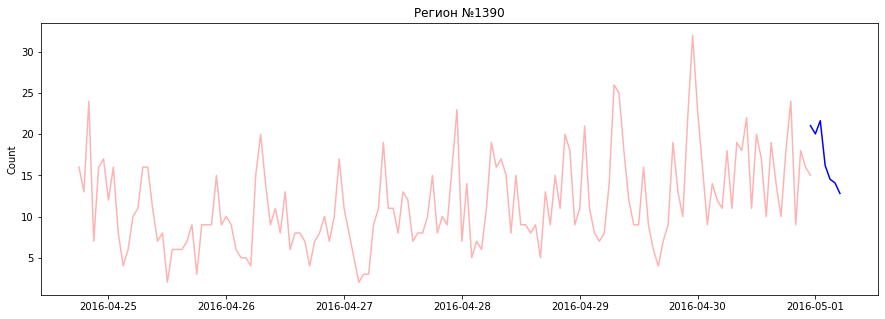

Success_reg: 1390
11318.097182782902
Критерий Стьюдента: p=0.325162
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.07201264713473321


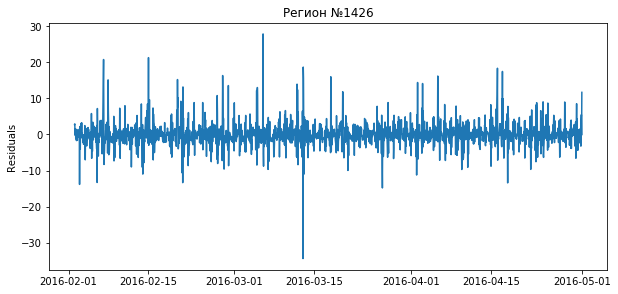

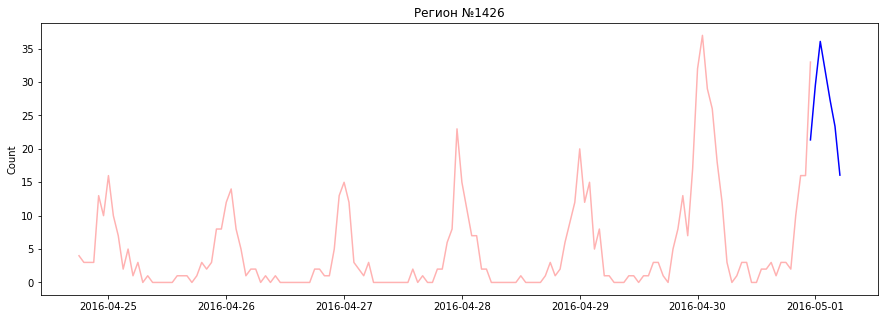

Success_reg: 1426
15193.785871004522
Критерий Стьюдента: p=0.648774
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: 0.08284542322823471


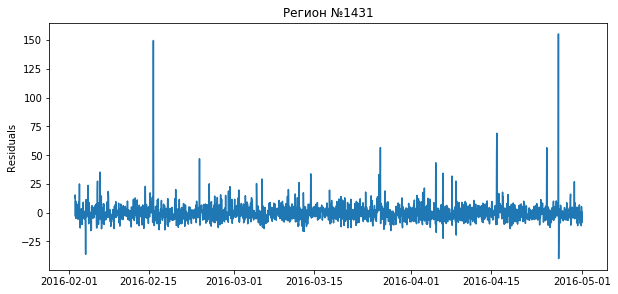

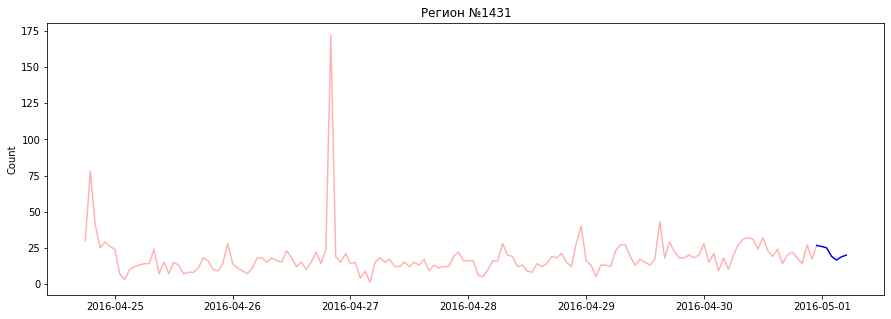

Success_reg: 1431
12826.025512268094
Критерий Стьюдента: p=0.939873
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: 0.007868384944840007


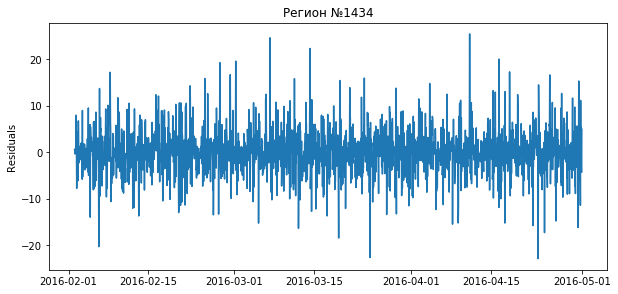

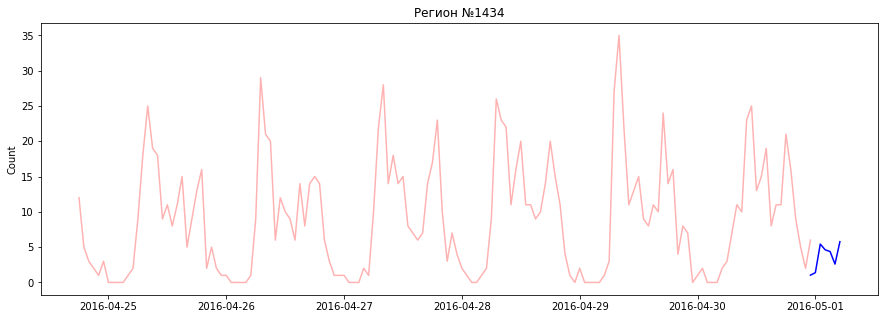

Success_reg: 1434
11457.093106058823
Критерий Стьюдента: p=0.396286
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.06456001626629398


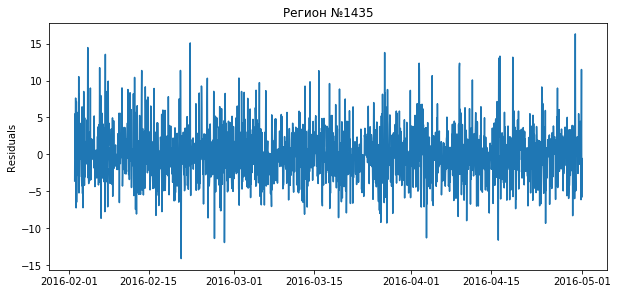

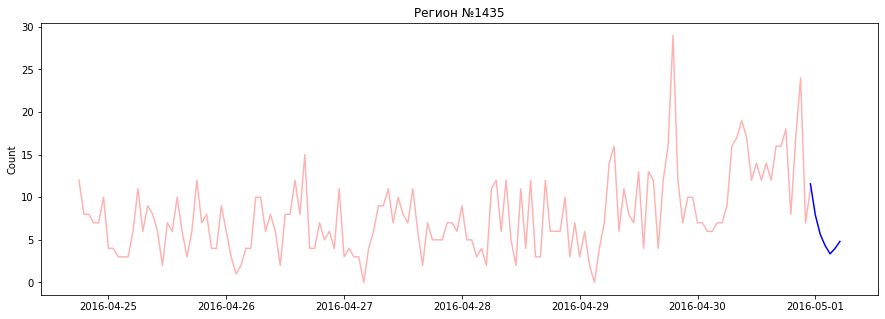

Success_reg: 1435
14973.655382327412
Критерий Стьюдента: p=0.127547
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.2633180982480657


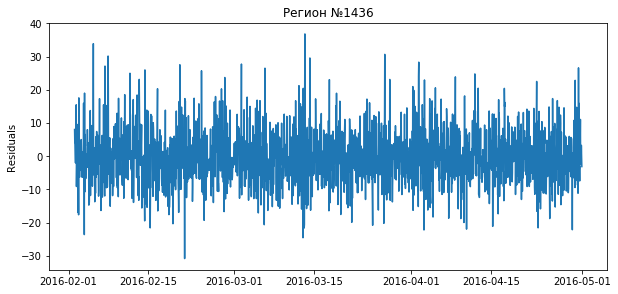

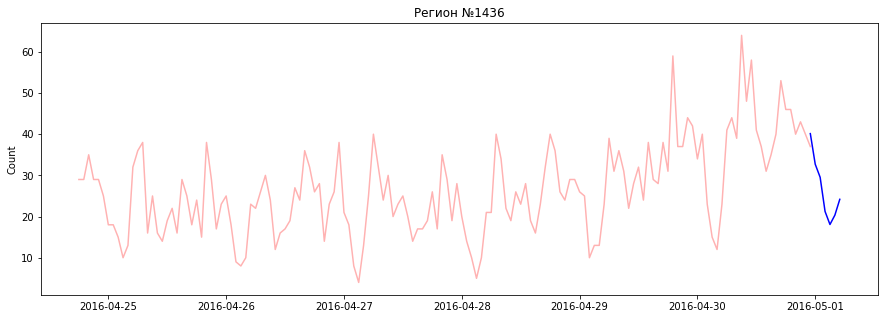

Success_reg: 1436
15688.87199479648
Критерий Стьюдента: p=0.957519
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: 0.01095530833905629


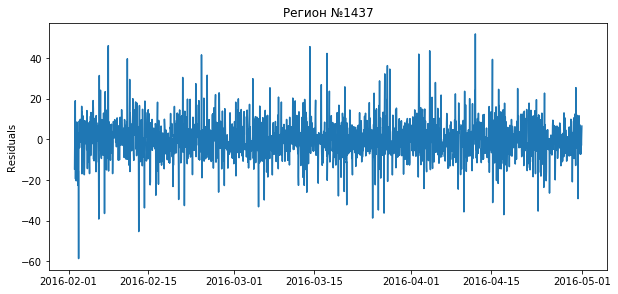

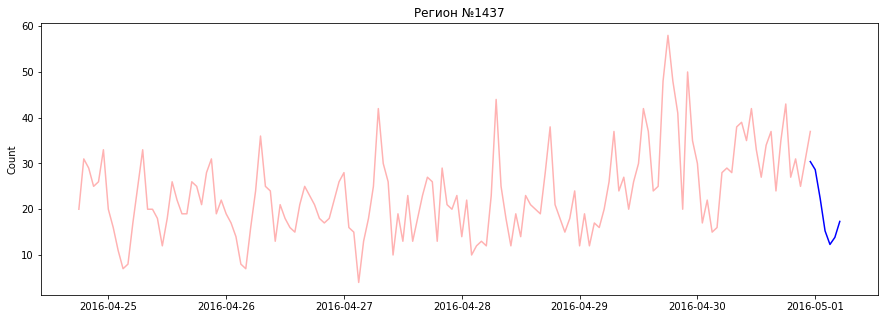

Success_reg: 1437
12807.485660062492
Критерий Стьюдента: p=0.099532
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.17184885005247422


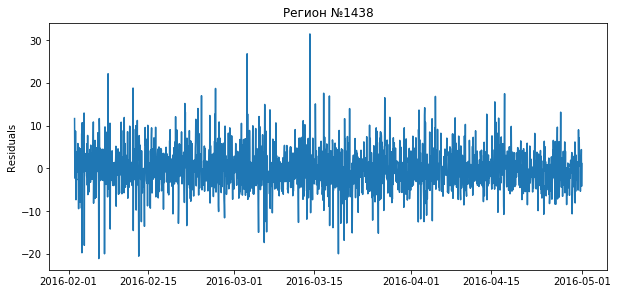

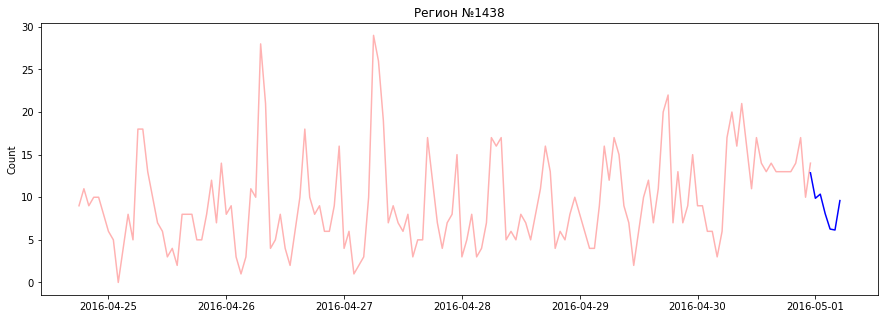

Success_reg: 1438
11889.90095656165
Критерий Стьюдента: p=0.066004
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.154461424543342


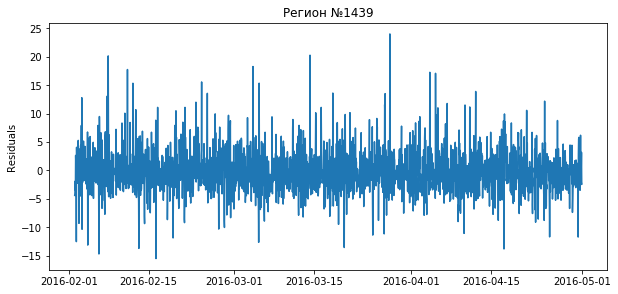

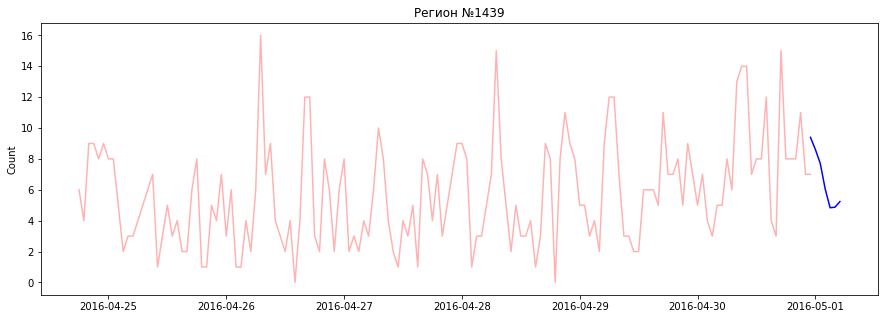

Success_reg: 1439
10514.519636661567
Критерий Стьюдента: p=0.692692
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.02394984721251898


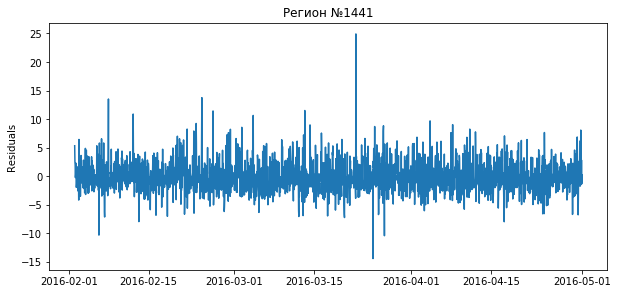

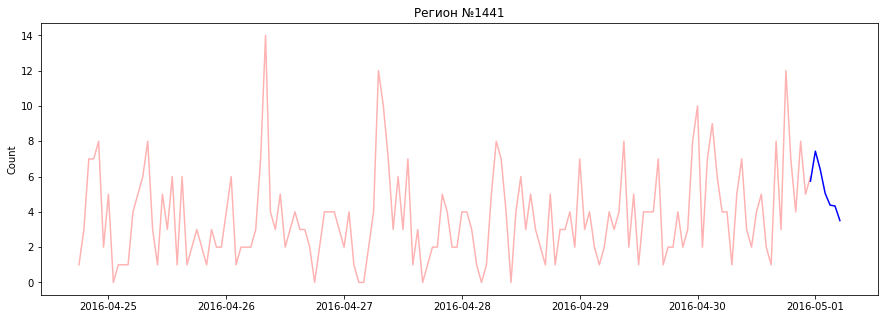

Success_reg: 1441
11821.798747770146
Критерий Стьюдента: p=0.350582
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.07710035973511561


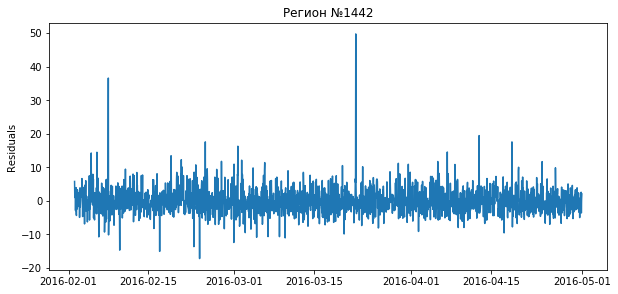

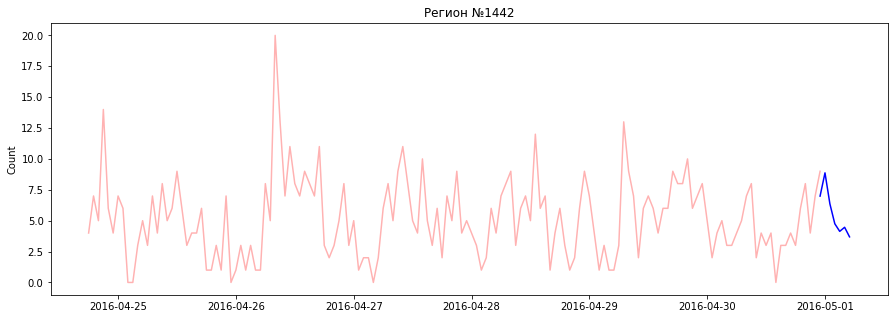

Success_reg: 1442
12897.353497238171
Критерий Стьюдента: p=0.752863
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.03353694481296812


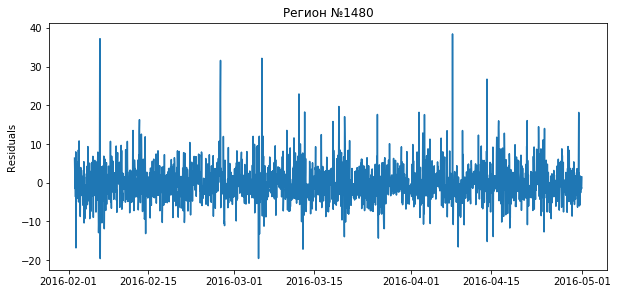

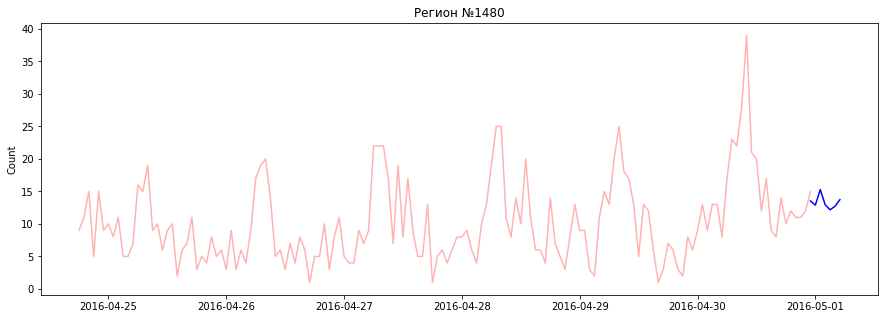

Success_reg: 1480
12864.394173404333
Критерий Стьюдента: p=0.205943
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.13302922428497466


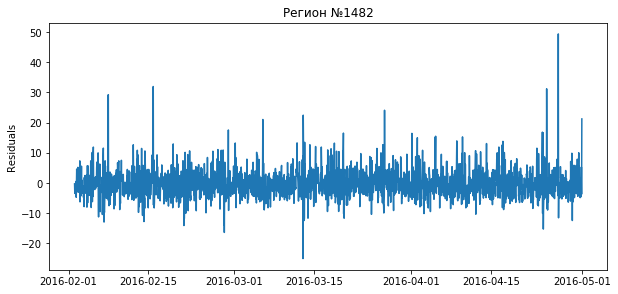

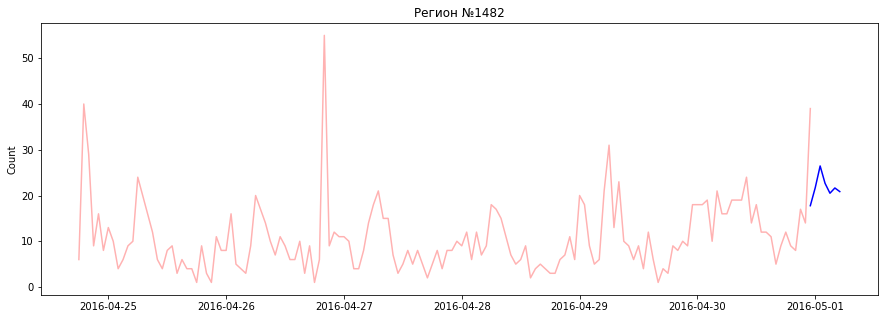

Success_reg: 1482
12265.536372319526
Критерий Стьюдента: p=0.163553
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.12795707319016603


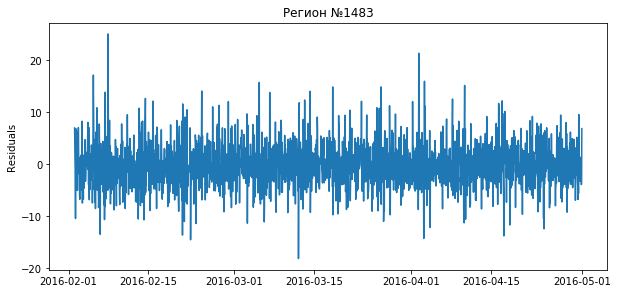

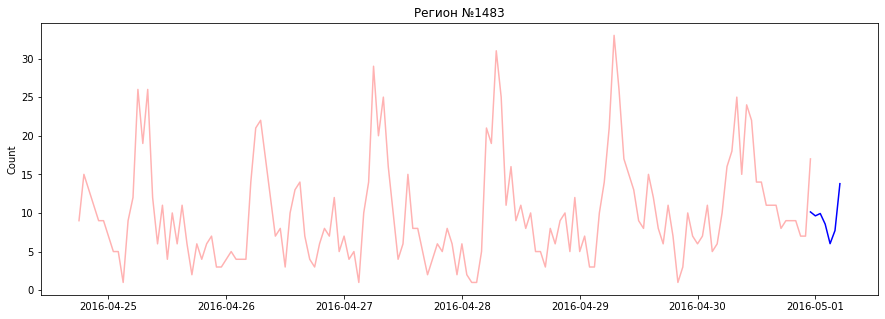

Success_reg: 1483
13456.818344541796
Критерий Стьюдента: p=0.659619
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.05333383189580496


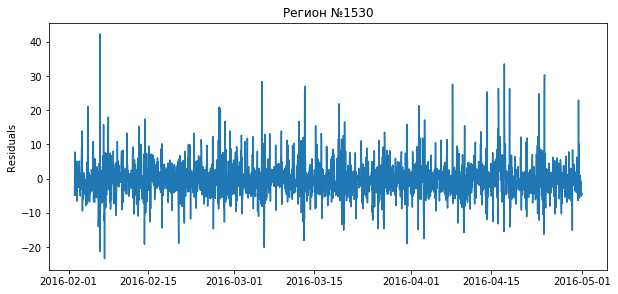

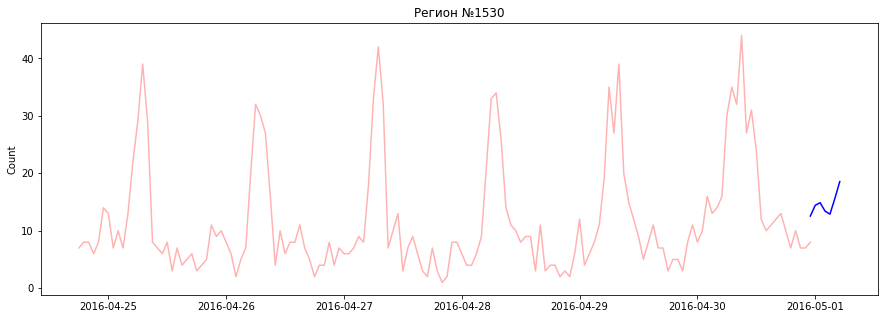

Success_reg: 1530
11710.47660352931
Критерий Стьюдента: p=0.967849
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.0032301427065567377


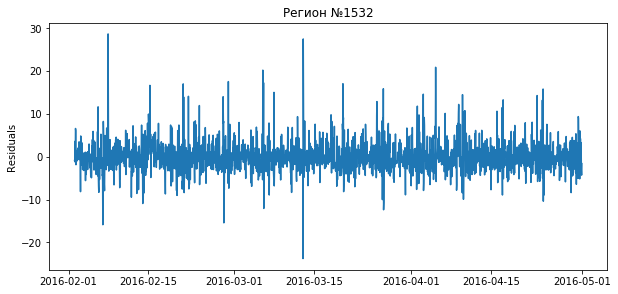

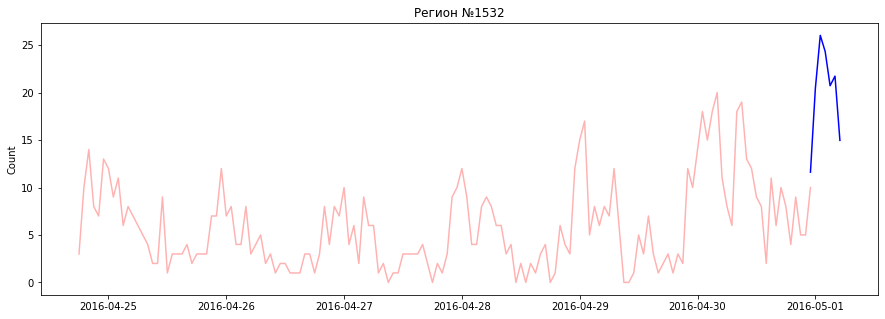

Success_reg: 1532
12923.964498327896
Критерий Стьюдента: p=0.328919
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.10404327924025183


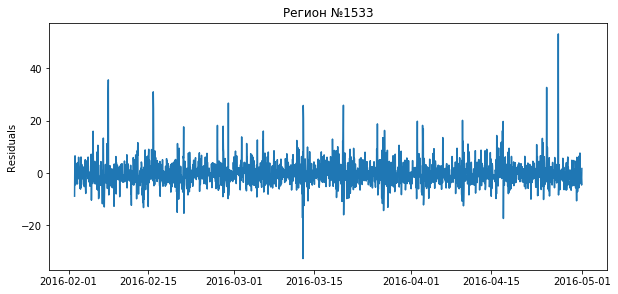

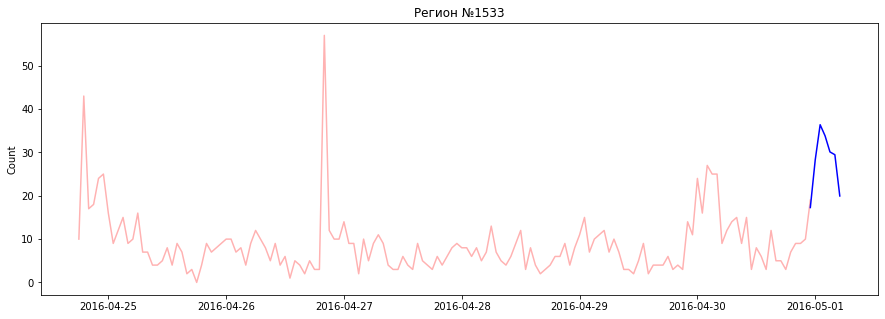

Success_reg: 1533
10918.634759102148
Критерий Стьюдента: p=0.374423
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.05929820010664321


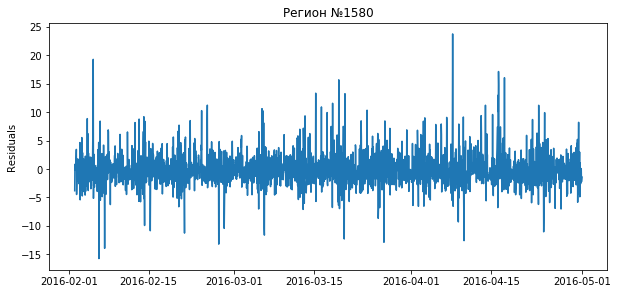

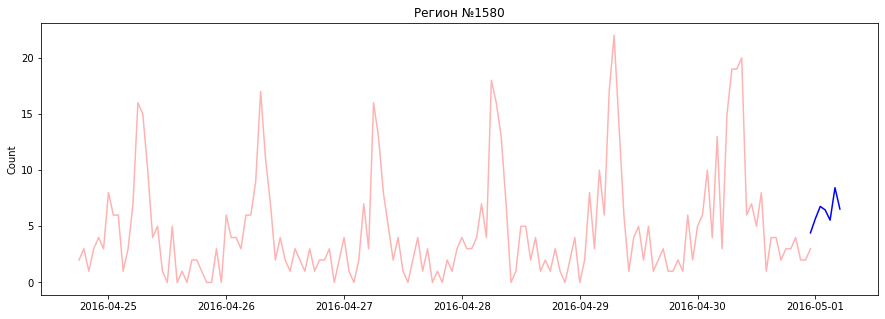

Success_reg: 1580
10672.751552032205
Критерий Стьюдента: p=0.624607
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: 0.03095089332042397


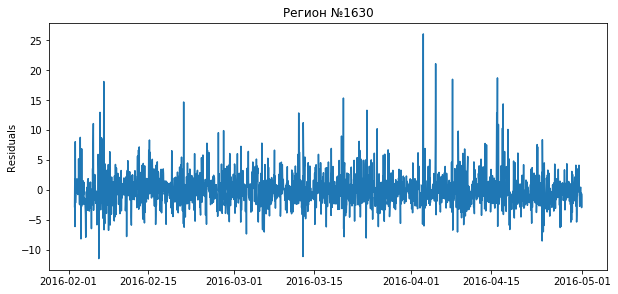

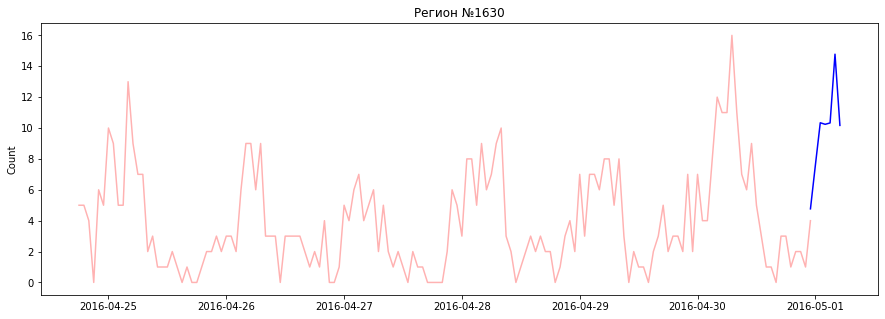

Success_reg: 1630
15811.98996520371
Критерий Стьюдента: p=0.816909
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: -0.048623659073238436


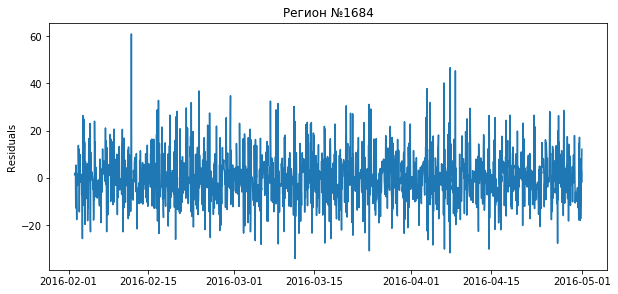

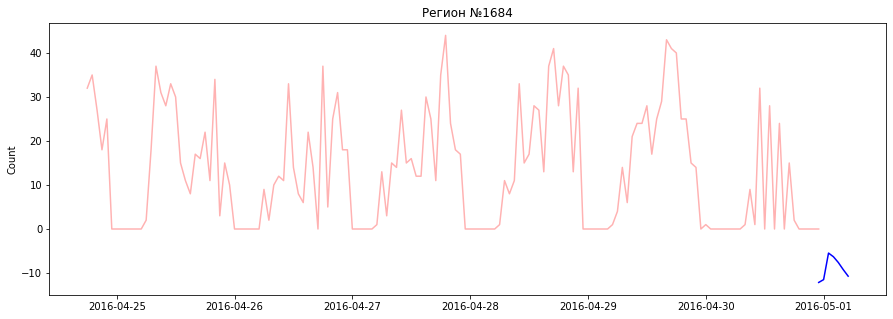

Success_reg: 1684
10695.848916789844
Критерий Стьюдента: p=0.797502
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: 0.016339373814922068


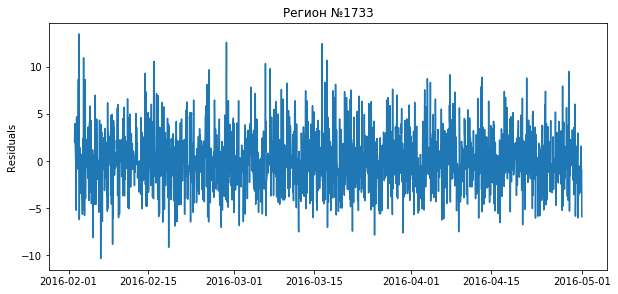

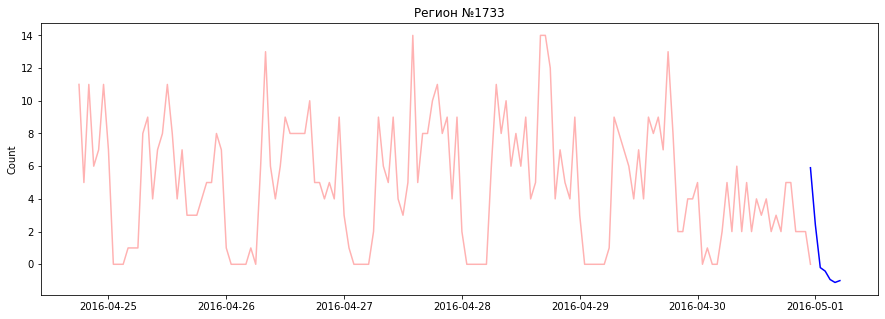

Success_reg: 1733
23989.82947775533
Критерий Стьюдента: p=0.336094
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: 1.379724243642949


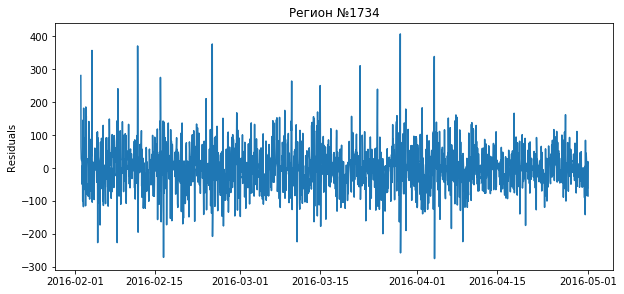

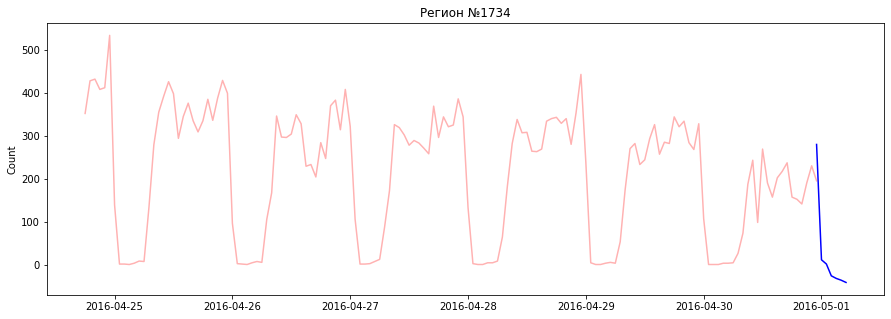

Success_reg: 1734
23318.907333158124
Критерий Стьюдента: p=0.711948
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: 0.4507242533407968


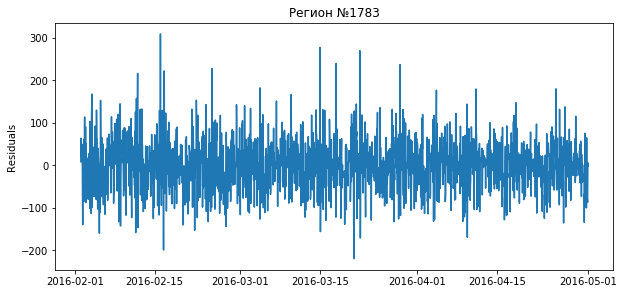

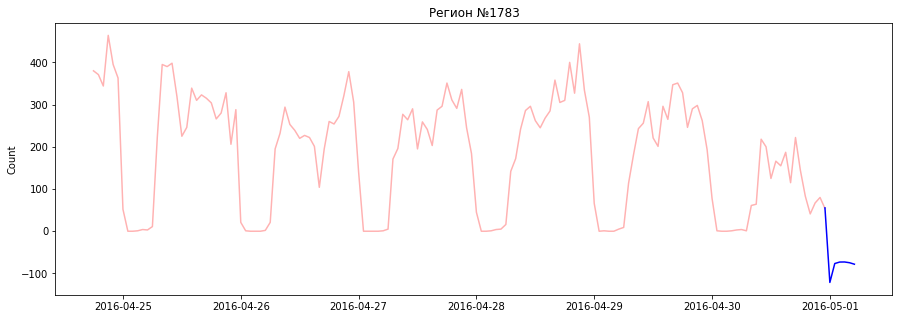

Success_reg: 1783
19454.28239308737
Критерий Стьюдента: p=0.414953
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: 0.40247534519252615


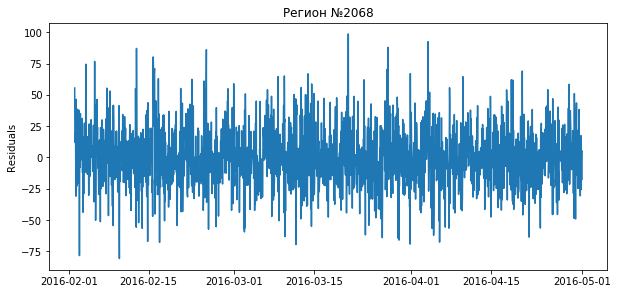

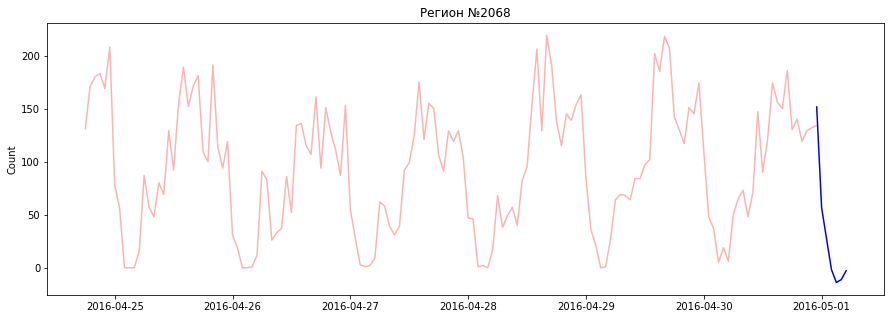

Success_reg: 2068
13621.281843070266
Критерий Стьюдента: p=0.799262
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: 0.031963272266526586


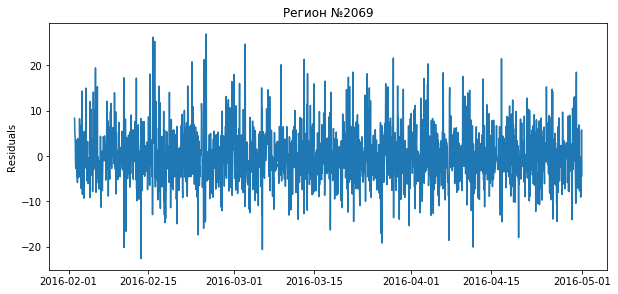

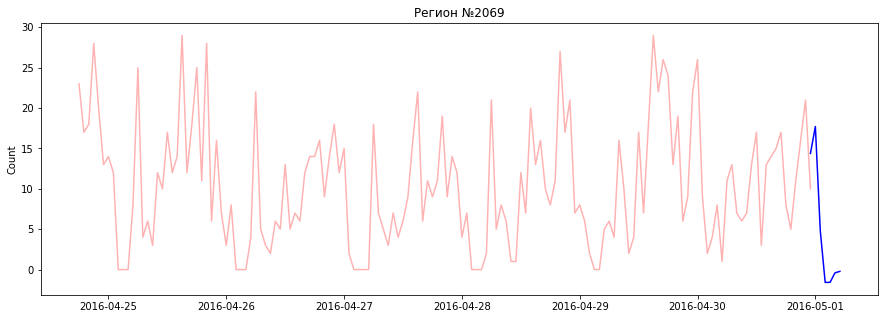

Success_reg: 2069
21080.946690062287
Критерий Стьюдента: p=0.778559
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: 0.20373672585526145


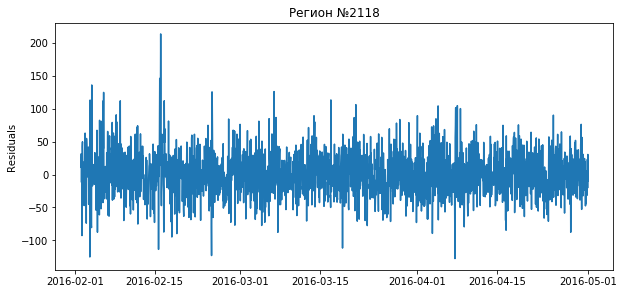

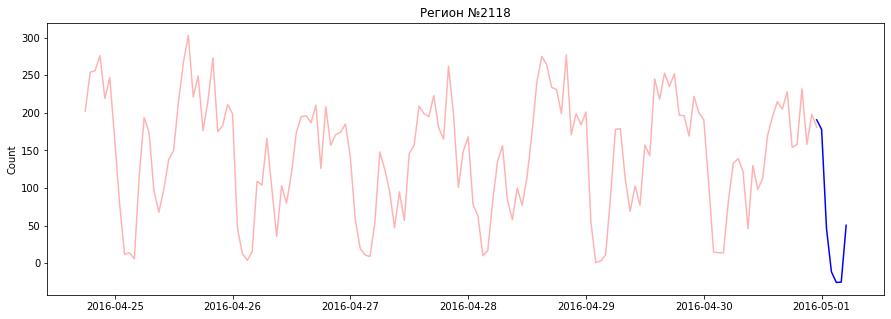

Success_reg: 2118
17638.64236189593
Критерий Стьюдента: p=0.398869
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: 0.27199653272639235


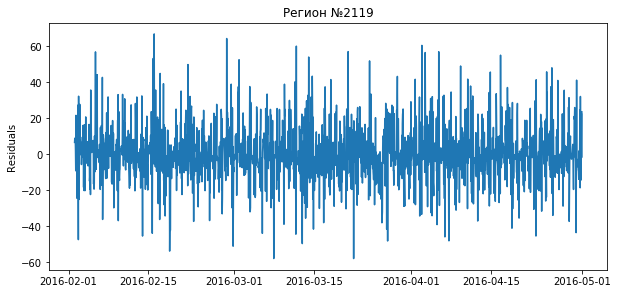

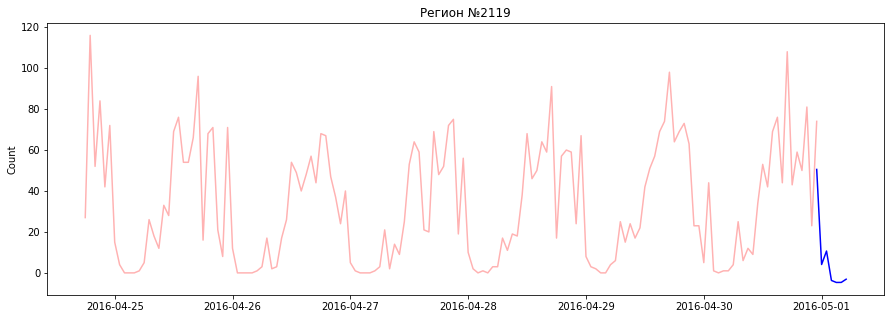

Success_reg: 2119
19400.764400529755
Критерий Стьюдента: p=0.140902
Критерий Дики-Фуллера: p=0.000000
Среднее по остаткам: 0.7214778825861123


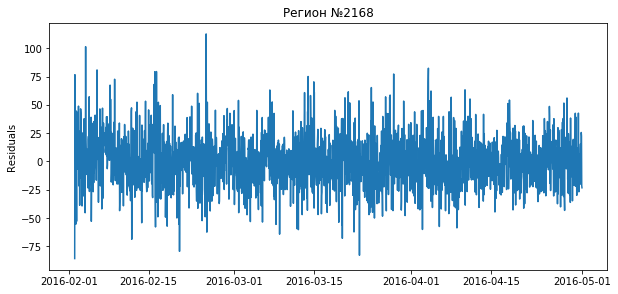

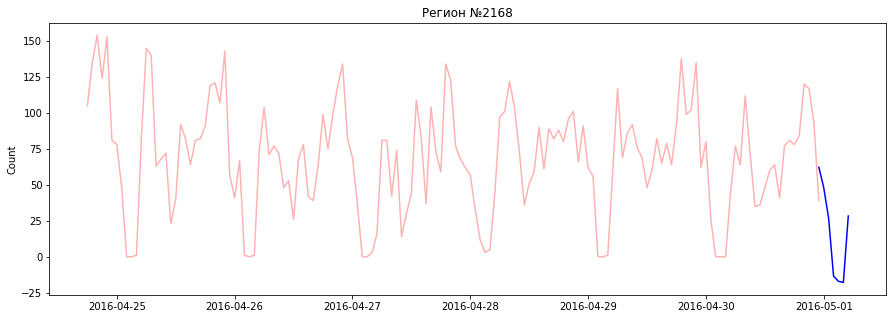

Success_reg: 2168


In [313]:
# для каждого ряда посчитаем модель на основе данных по апрель, с выбранными в соответствии с кластером гиперпараметрами
# с помощью релевантной модели построим прогноз с мая на 6 часов для каждого часа каждого ряда
predictions_may = []
predictions_jun = []
datelist_ = data_for_SARIMAX[0].index
warnings.filterwarnings('ignore')

for ind, reg in enumerate(reg_ids):
    train_data = data_for_SARIMAX[ind].iloc[:-(31*24+30*24), :] 
    test_data = data_for_SARIMAX[ind]
    skip = 25

    clust = int(mapping.loc[mapping['Reg_ID'] == reg, 'cl'])
    clust_ind = np.arange(k)[np.array(cl_cent_data_train.index==clust)][0]
    param = best_results[clust_ind]

    # сделаем прогнозы для каждого ряда 
    cl_regids = list(mapping.loc[mapping.cl==clust, 'Reg_ID'])
    regids_origin_ind = np.where(np.isin(reg_ids, reg_ids_ord))[0]
    
    try: 
        model_train=sm.tsa.statespace.SARIMAX(train_data.iloc[:, 0], 
                                    exog = train_data.iloc[:, 1:],
                                    order=(param[0], d, param[1]), 
                                    seasonal_order=(param[2], D, param[3], 24)).fit(disp=-1)
        print (model_train.aic)


        # проверим остатки на предмет несмещенности, стационарности и отсутствия автокоррелированности:
        print("Критерий Стьюдента: p=%f" % stats.ttest_1samp(model_train.resid[skip:], 0)[1])
        print("Критерий Дики-Фуллера: p=%f" % sm.tsa.stattools.adfuller(model_train.resid[skip:])[1])
        print ('Среднее по остаткам: ' + str(model_train.resid[skip:].mean()))

        plt.figure(figsize(10,10))
        plt.subplot(211)
        plt.plot(model_train.resid[skip:])
        plt.ylabel(u'Residuals')
        plt.title('Регион №' + str(reg))
        plt.show()
        
        if (stats.ttest_1samp(model_train.resid[skip:], 0)[1] < .9) & (model_train.resid[skip:].mean() > 5):
            coerc = model_train.resid[skip:].mean()
        else: 
            coerc = 0

        # построим прогноз на 6 часов вперед и отобразим его на графике:
        prediction_ = model_train.predict(start=2159, end=2159+6, dynamic = True, exog = test_data.iloc[2159:2159+6, 1:])
        prediction_.index = datelist_[2159:2159+6+1]

        plt.figure(figsize(15,5))
        plt.plot(train_data[['count']][-150:], color='r', alpha = .3)
        plt.plot(prediction_[-150:], color = 'b')

        plt.ylabel('Count')
        plt.title('Регион №' + str(reg))
        pylab.show()

        # построим модель для прогнозов на май и июнь с параметрами как в обучающей модели
        model_test = sm.tsa.statespace.SARIMAX(
        test_data.iloc[:, 0], exog = test_data.iloc[:, 1:], order=(param[0], d, param[1]),
            seasonal_order=(param[2], D, param[3], 24))
        model_test_res = model_test.filter(model_train.params)

        # построим прогнозы на май с плавающим концом истории и запишем прогнозы:
        x=2159 # индекс соответствующий 30 апреля 23 ч
        for y in np.arange(0, 31*24-6+1):
            prediction_may = model_test_res.predict(start=x+y+1, end=x+y+6, 
                                               exog = test_data.iloc[x:x+y+6, 1:], dynamic=True)
            prediction_may = prediction_may + coerc
            predictions_may.append([reg] + [datelist_[x+y]] + list(prediction_may))           
        
        # построим прогнозы на июнь с плавающим концом истории и запишем прогнозы:
        x=2903 # индекс соответствующий 31 мая 23 ч
        for y in np.arange(0, 30*24-6+1):
            prediction_jun = model_test_res.predict(start=x+y+1, end=x+y+6, 
                                               exog = test_data.iloc[x:x+y+6, 1:], dynamic=True)
            prediction_jun = prediction_jun + coerc
            predictions_jun.append([reg] + [datelist_[x+y]] + list(prediction_jun))           
        print('Success_reg:', reg)
    
    # при ошибке записываем прогноз, пропускаем прогноз этого ряда:
    except ValueError:
        print('ValueError_reg:', reg)
        continue
    except LinAlgError:
        print('LinAlgError_reg:', reg)
        continue


In [316]:
# преобразуем прогноз в таблицу и сохраним его
predictions_test = pd.DataFrame(predictions_may, columns=np.array(['Reg_ID', 
                                                                   'tpep_pickup_hour'] + list(np.arange(1, 7))))
predictions_test.head()

,Reg_ID,tpep_pickup_hour,1,2,3,4,5,6
0,1075,2016-04-30 23:00:00,69.653230,51.231108,37.588398,27.237721,30.120604,23.115830
1,1075,2016-05-01 00:00:00,51.913017,37.989502,27.503707,30.292545,23.228887,35.376788
2,1075,2016-05-01 01:00:00,30.438599,23.062213,27.347236,21.324957,34.124895,41.430555
3,1075,2016-05-01 02:00:00,12.713545,21.260077,17.288350,31.515520,39.714809,52.917380
4,1075,2016-05-01 03:00:00,21.911447,17.671491,31.769594,39.879049,53.025373,56.216273


In [317]:
predictions_test.to_csv('predictions_test.csv', index=False)

### Задание 6
Для каждой из R географических зон настройте на данных до апреля 2016 включительно модель ARIMA с гиперпараметрами, соответствующими кластеру этой зоны. Для каждого конца истории от 2016.04.30 23:00 до 2016.05.31 17:00 постройте прогноз на 6 часов вперёд и посчитайте в ноутбуке ошибку прогноза.
Прогноз построен выше. Ниже - расчет ошибки.

#### На данных за май расчитаем ошибку (out_of_sample error)

In [320]:
# переименуем колонки в таблице y_test с целевыми значениями
y_test.rename(columns={'targ_0': '1', 'targ_1': '2', 'targ_2': '3', 'targ_3': '4', 'targ_4': '5', 'targ_5': '6', }, inplace=True)

# удалим колонку с данными на конец истории  в каждой таблице
#predictions_test.drop(['count'], axis=1, inplace=True)
#y_test.drop(['count'], axis=1, inplace=True)

# сделаем плоскую таблицу
predictions_test_melt = predictions_test.melt(id_vars=['Reg_ID', 'tpep_pickup_hour'])
predictions_test_melt.rename(columns={'variable': 'step', 'value':'prediction'}, inplace=True)
y_test_melt = y_test.melt(id_vars=['Reg_ID', 'tpep_pickup_hour'])
y_test_melt.rename(columns={'variable': 'step', 'value':'target'}, inplace=True)

# объеденим таблицы
data_final_test = y_test_melt.merge(predictions_test_melt, on=['Reg_ID', 'tpep_pickup_hour', 'step'])

# посчитаем ошибку
data_final_test['delta'] = np.absolute(data_final_test.prediction - data_final_test.target)
MAE_test = data_final_test[['delta']].mean(axis=0)
MAE_test

delta    38.828818
dtype: float64

### Задание 7
Для каждой из RR географических зон настройте на данных до мая 2016 включительно модель ARIMA с гиперпараметрами, соответствующими кластеру этой зоны. Для каждого конца истории от 2016.05.31 23:00 до 2016.06.30 17:00 постройте прогноз на 6 часов вперёд и запишите все прогнозы в файл в формате id,y, где столбец id состоит из склеенных через подчёркивание идентификатора географической зоны, даты конца истории, часа конца истории и номера отсчёта, на который делается предсказание (1-6); столбец y — ваш прогноз.

Прогноз построен выше. Ниже форматирование файла для выполнения задания.

####  Запишем прогнозы на июнь в файл

In [357]:
from datetime import datetime
# преобразуем прогноз на июнь в таблицу и сохраним его
predictions_jun = pd.DataFrame(predictions_jun, columns=np.array(['Reg_ID', 
                                                                   'tpep_pickup_hour'] + list(np.arange(1, 7))))
predictions_jun.to_csv('predictions_jun.csv', index=False)

# приведем таблицу к формату для отправки задания
predictions_jun_melt = predictions_jun.melt(id_vars=['Reg_ID', 'tpep_pickup_hour'])

id_ = predictions_jun_melt['Reg_ID'].astype(str)
date_ = predictions_jun_melt['tpep_pickup_hour'].apply(lambda x: datetime.strftime(x, '%Y-%m-%d')).astype(str)
hour_ = predictions_jun_melt['tpep_pickup_hour'].apply(lambda x: datetime.strftime(x, '%H')).astype(int).astype(str)
step_ = predictions_jun_melt['variable'].astype(str)
y_ = predictions_jun_melt['value']

predictions_jun_submit = pd.DataFrame()
predictions_jun_submit['id'] = id_ + '_' + date_ + '_' + hour_ + '_' + step_
predictions_jun_submit['y'] = y_

In [358]:
predictions_jun_submit.to_csv('predictions_jun_submit.csv', index=False)
predictions_jun_submit.head(20)

,id,y
0,1075_2016-05-31_23_1,23.882802
1,1075_2016-06-01_0_1,18.235073
2,1075_2016-06-01_1_1,1.179826
3,1075_2016-06-01_2_1,0.751935
4,1075_2016-06-01_3_1,-0.173357
5,1075_2016-06-01_4_1,4.198240
6,1075_2016-06-01_5_1,18.692397
7,1075_2016-06-01_6_1,34.442428
8,1075_2016-06-01_7_1,63.430311
9,1075_2016-06-01_8_1,59.928386


### Задание 8
Загрузите полученный файл на kaggle: https://inclass.kaggle.com/c/yellowtaxi. Добавьте в ноутбук ссылку на сабмишн.

Я не знаю, как дать ссылку на сабмишн. Я в настоящее время на 116 позиции в Leaderboard.
https://inclass.kaggle.com/c/yellowtaxi/leaderboard